# (16) Reservoir + GLM + Save

**Motivation**: <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-MTMST/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-MTMST/figs')
tmp_dir = os.path.join(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_MTMST'))
from vae.train_vae import TrainerVAE, ConfigTrainVAE
from vae.vae2d import VAE, ConfigVAE
from analysis.opticflow import *
from figures.fighelper import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from analysis.glm import ReadoutGLM, LinearModel

## Shallow

In [3]:
vae = VAE(ConfigVAE(
    'fixate1', n_enc_cells=1, n_dec_cells=1, n_enc_nodes=4, n_dec_nodes=2,
    n_latent_scales=3, n_groups_per_scale=8, n_latent_per_group=20,
))
tr = TrainerVAE(vae, ConfigTrainVAE(batch_size=1000), device='cuda:1')
vae.print()
print(vae.cfg.name())
vae.scales, vae.cfg.total_latents()

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
|     VAE      |  18.9 Mil  |
|     ---      |    ---     |
|     stem     |    320     |
| pre_process  |  207.1 K   |
|  enc_tower   |  11.1 Mil  |
|     enc0     |   66.0 K   |
| enc_sampler  |  1.7 Mil   |
| dec_sampler  |  1.7 Mil   |
|    expand    |  234.2 K   |
|  dec_tower   |  3.8 Mil   |
| post_process |   67.9 K   |
|     out      |    578     |
+--------------+------------+

fixate1_k-32_z-20x[2,4,8]_enc(1x4)-dec(1x2)-pre(1x3)-post(1x3)

([8, 4, 2], 280)

## Loop + save

### fit name

In [4]:
nf = sum(vae.ftr_sizes()[0].values())
fit_name = '_'.join([
    'reservoir',
    f"nf-{nf}",
    f"({now(True)})",
])
print(fit_name)

reservoir_nf-1984_(2023_04_16,21:15)

### loop

[PROGRESS] neural data loaded

100%|██████████| 29/29 [00:21<00:00,  1.35it/s]


[PROGRESS] features extracted

100%|██████████| 10895/10895 [00:15<00:00, 708.86it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

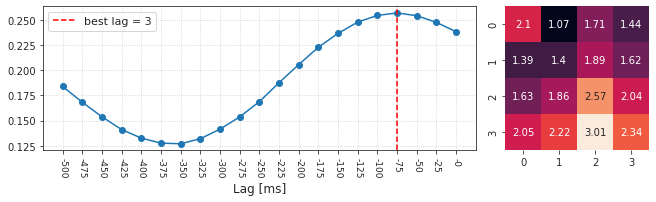

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.144672  0.024873
1.000000e-06  0.142367  0.025928
1.000000e-05  0.143892  0.030469
1.000000e-04  0.142973  0.027708
1.000000e-03  0.143371  0.030345
1.000000e-02  0.151352  0.038190
1.000000e-01  0.153600  0.035784
1.000000e+00  0.141717  0.025949
1.000000e+01  0.109867  0.014787

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.149163  0.012772
1.000000e-06  0.153884  0.016850
1.000000e-05  0.147844  0.014239
1.000000e-04  0.155096  0.020245
1.000000e-03  0.155014  0.026707
1.000000e-02  0.168176  0.043963
1.000000e-01  0.185581  0.046143
1.000000e+00  0.181389  0.036791
1.000000e+01  0.153166  0.025063

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.118197  0.002840
1.000000e-06  0.122271  0.004086
1.000000e-05  0.121692  0.000651
1.000000e-04  0.122284  0.002493
1.000000e-03  0.130954  0.018744
1.000000e-02  0.135099  0.029159
1.000000e-01  0.140165  0.027070
1.000000e+00  0.133110  0.020514
1.000000e+01  0.093202  0.008717

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.123295  0.008828
1.000000e-06  0.132540  0.020504
1.000000e-05  0.128413  0.013446
1.000000e-04  0.123748  0.010303
1.000000e-03  0.127060  0.014629
1.000000e-02  0.143499  0.032036
1.000000e-01  0.162299  0.040165
1.000000e+00  0.164319  0.033865
1.000000e+01  0.135721  0.018300

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                           
1.000000e-07  0.108923  0.013099
1.000000e-06  0.108720  0.012393
1.000000e-05  0.113073  0.013832
1.000000e-04  0.113143  0.016089
1.000000e-03  0.127046  0.027115
1.000000e-02  0.146267  0.037259
1.000000e-01  0.144859  0.033146
1.000000e+00  0.142449  0.023973
1.000000e+01  0.146247  0.010583

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.107858 -0.006043
1.000000e-06  0.103513 -0.009517
1.000000e-05  0.109835 -0.003644
1.000000e-04  0.105156 -0.004524
1.000000e-03  0.116963  0.008456
1.000000e-02  0.127817  0.023263
1.000000e-01  0.128876  0.024906
1.000000e+00  0.117700  0.017946
1.000000e+01  0.096710  0.007029

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.112812 -0.012055
1.000000e-06  0.111265 -0.006809
1.000000e-05  0.114530 -0.008560
1.000000e-04  0.110621 -0.010865
1.000000e-03  0.112284 -0.009372
1.000000e-02  0.121021  0.014609
1.000000e-01  0.128795  0.024782
1.000000e+00  0.138193  0.025490
1.000000e+01  0.122332  0.016044

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.146671  0.028023
1.000000e-06  0.142723  0.026070
1.000000e-05  0.138782  0.023168
1.000000e-04  0.139826  0.025114
1.000000e-03  0.143450  0.029538
1.000000e-02  0.163164  0.044211
1.000000e-01  0.190151  0.049989
1.000000e+00  0.197349  0.040874
1.000000e+01  0.167043  0.022779

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu036, neuron # 0;  best alpha = 1, best_r = 0.197

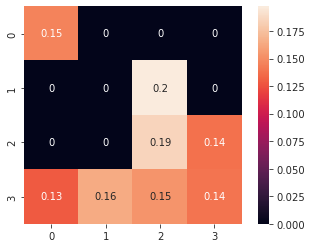

[PROGRESS] 'YUWEI-clu036.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 29/29 [00:17<00:00,  1.68it/s]


[PROGRESS] features extracted

100%|██████████| 10847/10847 [00:14<00:00, 739.28it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

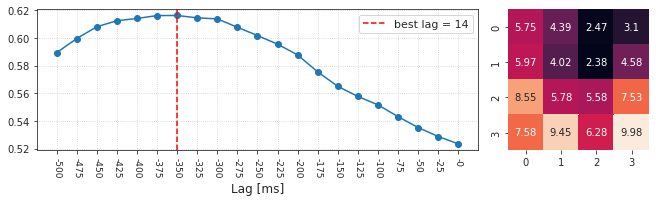

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.239790  0.095433
1.000000e-06  0.241373  0.099412
1.000000e-05  0.243563  0.107453
1.000000e-04  0.239815  0.095761
1.000000e-03  0.249691  0.140077
1.000000e-02  0.252908  0.167137
1.000000e-01  0.241725  0.158129
1.000000e+00  0.220318  0.115477
1.000000e+01  0.164102  0.045064

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.203964  0.094484
1.000000e-06  0.203624  0.099638
1.000000e-05  0.208836  0.101222
1.000000e-04  0.205832  0.104782
1.000000e-03  0.206655  0.103363
1.000000e-02  0.203861  0.117474
1.000000e-01  0.184756  0.090432
1.000000e+00  0.154753  0.050860
1.000000e+01  0.140792  0.024445

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.220679  0.094518
1.000000e-06  0.220925  0.086690
1.000000e-05  0.221523  0.088984
1.000000e-04  0.219140  0.084735
1.000000e-03  0.218537  0.104565
1.000000e-02  0.205615  0.118295
1.000000e-01  0.178728  0.087941
1.000000e+00  0.146844  0.050573
1.000000e+01  0.118301  0.028312

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.208831  0.105879
1.000000e-06  0.209800  0.108001
1.000000e-05  0.211154  0.106977
1.000000e-04  0.211496  0.108623
1.000000e-03  0.216865  0.123203
1.000000e-02  0.212118  0.114428
1.000000e-01  0.184695  0.070781
1.000000e+00  0.153178  0.038483
1.000000e+01  0.101033  0.018142

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.242431  0.126241
1.000000e-06  0.242079  0.128540
1.000000e-05  0.242650  0.126791
1.000000e-04  0.248167  0.141232
1.000000e-03  0.243693  0.139399
1.000000e-02  0.254769  0.152841
1.000000e-01  0.258282  0.144969
1.000000e+00  0.223412  0.094634
1.000000e+01  0.161651  0.036030

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.252188  0.121277
1.000000e-06  0.253962  0.117331
1.000000e-05  0.251803  0.117193
1.000000e-04  0.246348  0.112885
1.000000e-03  0.252257  0.134006
1.000000e-02  0.252962  0.159154
1.000000e-01  0.243910  0.137661
1.000000e+00  0.203627  0.076728
1.000000e+01  0.143544  0.030116

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                           
1.000000e-07  0.224907  0.124628
1.000000e-06  0.233582  0.128458
1.000000e-05  0.227803  0.127563
1.000000e-04  0.232095  0.128587
1.000000e-03  0.230782  0.137620
1.000000e-02  0.233303  0.150172
1.000000e-01  0.185806  0.105046
1.000000e+00  0.154350  0.066912
1.000000e+01  0.138985  0.039158

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.235537  0.132939
1.000000e-06  0.232243  0.133287
1.000000e-05  0.227974  0.121481
1.000000e-04  0.240084  0.143452
1.000000e-03  0.237974  0.145319
1.000000e-02  0.229016  0.138357
1.000000e-01  0.193213  0.085335
1.000000e+00  0.145036  0.037847
1.000000e+01  0.097605  0.014089

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu037, neuron # 0;  best alpha = 0.1, best_r = 0.258

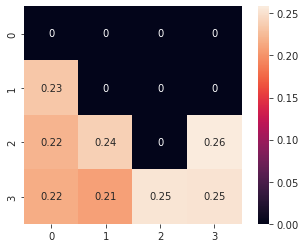

[PROGRESS] 'YUWEI-clu037.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 29/29 [00:16<00:00,  1.73it/s]


[PROGRESS] features extracted

100%|██████████| 22441/22441 [00:28<00:00, 781.37it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

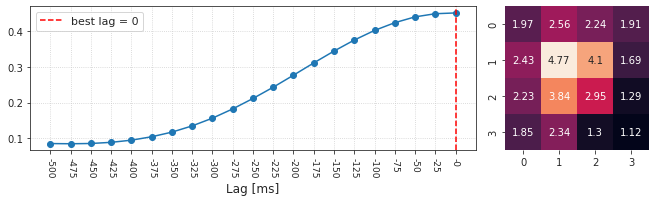

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.325760  0.054239
1.000000e-06  0.326109  0.054035
1.000000e-05  0.328109  0.055397
1.000000e-04  0.329216  0.056232
1.000000e-03  0.327600  0.055513
1.000000e-02  0.330194  0.056092
1.000000e-01  0.320452  0.052590
1.000000e+00  0.280394  0.039746
1.000000e+01  0.213879  0.023501

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.303268  0.046023
1.000000e-06  0.301278  0.045332
1.000000e-05  0.303314  0.045949
1.000000e-04  0.304453  0.045597
1.000000e-03  0.305562  0.046530
1.000000e-02  0.303108  0.046542
1.000000e-01  0.294815  0.044744
1.000000e+00  0.267055  0.035965
1.000000e+01  0.204499  0.021119

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.316973  0.051028
1.000000e-06  0.315048  0.049067
1.000000e-05  0.314547  0.048867
1.000000e-04  0.314055  0.048510
1.000000e-03  0.315823  0.048927
1.000000e-02  0.317502  0.050970
1.000000e-01  0.309323  0.048608
1.000000e+00  0.273010  0.037492
1.000000e+01  0.211757  0.023003

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.308984  0.044873
1.000000e-06  0.309175  0.045472
1.000000e-05  0.309008  0.045443
1.000000e-04  0.308897  0.045374
1.000000e-03  0.309607  0.046341
1.000000e-02  0.312252  0.047821
1.000000e-01  0.302012  0.046912
1.000000e+00  0.267980  0.037125
1.000000e+01  0.215813  0.023459

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                           
1.000000e-07  0.315265  0.050988
1.000000e-06  0.311691  0.049978
1.000000e-05  0.314584  0.051163
1.000000e-04  0.316092  0.051491
1.000000e-03  0.308885  0.049463
1.000000e-02  0.312028  0.050788
1.000000e-01  0.295961  0.046173
1.000000e+00  0.262895  0.035671
1.000000e+01  0.214209  0.023351

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                           
1.000000e-07  0.307533  0.050219
1.000000e-06  0.307608  0.049643
1.000000e-05  0.307124  0.049752
1.000000e-04  0.307120  0.049593
1.000000e-03  0.306798  0.047662
1.000000e-02  0.308256  0.049563
1.000000e-01  0.299420  0.046316
1.000000e+00  0.271482  0.038044
1.000000e+01  0.242525  0.029585

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.307439  0.047694
1.000000e-06  0.307866  0.047876
1.000000e-05  0.311503  0.048991
1.000000e-04  0.308001  0.048107
1.000000e-03  0.309817  0.048578
1.000000e-02  0.313182  0.050116
1.000000e-01  0.294680  0.043724
1.000000e+00  0.251016  0.031453
1.000000e+01  0.190844  0.018873

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                           
1.000000e-07  0.299207  0.046649
1.000000e-06  0.298632  0.044936
1.000000e-05  0.298140  0.045537
1.000000e-04  0.298667  0.045427
1.000000e-03  0.298797  0.046383
1.000000e-02  0.302749  0.047773
1.000000e-01  0.292316  0.044180
1.000000e+00  0.251644  0.031786
1.000000e+01  0.185092  0.017343

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu038, neuron # 0;  best alpha = 0.01, best_r = 0.330

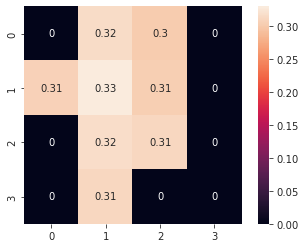

[PROGRESS] 'YUWEI-clu038.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 39/39 [00:22<00:00,  1.75it/s]


[PROGRESS] features extracted

100%|██████████| 22779/22779 [00:28<00:00, 811.85it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

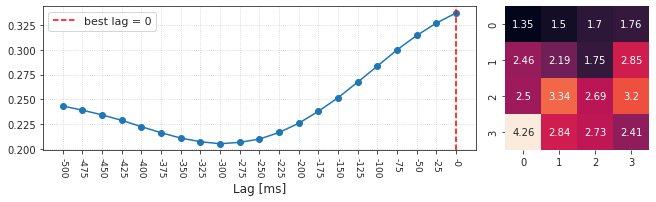

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.309205  0.087730
1.000000e-06  0.309273  0.088198
1.000000e-05  0.307637  0.088487
1.000000e-04  0.309372  0.090048
1.000000e-03  0.308645  0.089159
1.000000e-02  0.309075  0.092573
1.000000e-01  0.272740  0.073701
1.000000e+00  0.211787  0.046502
1.000000e+01  0.171776  0.027400

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.334707  0.093376
1.000000e-06  0.337116  0.097082
1.000000e-05  0.333383  0.091898
1.000000e-04  0.336604  0.098199
1.000000e-03  0.336779  0.096931
1.000000e-02  0.337248  0.100982
1.000000e-01  0.322152  0.099350
1.000000e+00  0.268758  0.070636
1.000000e+01  0.175668  0.031018

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.320311  0.100308
1.000000e-06  0.320447  0.100009
1.000000e-05  0.318893  0.100731
1.000000e-04  0.319618  0.101498
1.000000e-03  0.320584  0.102273
1.000000e-02  0.325897  0.106131
1.000000e-01  0.302593  0.090276
1.000000e+00  0.258696  0.065166
1.000000e+01  0.213409  0.042142

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.312777  0.097055
1.000000e-06  0.312678  0.097051
1.000000e-05  0.313173  0.097317
1.000000e-04  0.314167  0.097408
1.000000e-03  0.315588  0.098368
1.000000e-02  0.313241  0.096672
1.000000e-01  0.282930  0.076846
1.000000e+00  0.222440  0.048404
1.000000e+01  0.169010  0.027882

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.312689  0.093376
1.000000e-06  0.316375  0.096521
1.000000e-05  0.311244  0.092068
1.000000e-04  0.313548  0.093797
1.000000e-03  0.316527  0.097120
1.000000e-02  0.313918  0.097710
1.000000e-01  0.299759  0.088167
1.000000e+00  0.251461  0.059685
1.000000e+01  0.184102  0.033019

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.325280  0.107574
1.000000e-06  0.325920  0.108135
1.000000e-05  0.323079  0.107194
1.000000e-04  0.323506  0.106190
1.000000e-03  0.318455  0.103170
1.000000e-02  0.323569  0.107654
1.000000e-01  0.298928  0.088340
1.000000e+00  0.260087  0.063245
1.000000e+01  0.209322  0.039587

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.341983  0.108903
1.000000e-06  0.340186  0.107949
1.000000e-05  0.338657  0.108566
1.000000e-04  0.343776  0.109810
1.000000e-03  0.342054  0.108807
1.000000e-02  0.343105  0.111144
1.000000e-01  0.326625  0.097879
1.000000e+00  0.285527  0.072325
1.000000e+01  0.212213  0.033284

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.324140  0.097838
1.000000e-06  0.324923  0.098830
1.000000e-05  0.318751  0.095785
1.000000e-04  0.320693  0.095093
1.000000e-03  0.323441  0.096844
1.000000e-02  0.321188  0.097410
1.000000e-01  0.288607  0.082706
1.000000e+00  0.228028  0.052525
1.000000e+01  0.164232  0.027725

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu039, neuron # 0;  best alpha = 0.0001, best_r = 0.344

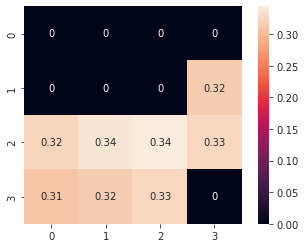

[PROGRESS] 'YUWEI-clu039.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 39/39 [00:22<00:00,  1.74it/s]


[PROGRESS] features extracted

100%|██████████| 24689/24689 [00:30<00:00, 796.93it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

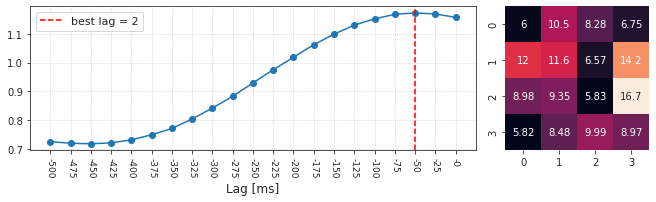

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.384141  0.370030
1.000000e-06  0.377562  0.363448
1.000000e-05  0.378615  0.366307
1.000000e-04  0.387935  0.375439
1.000000e-03  0.386833  0.375477
1.000000e-02  0.377575  0.351540
1.000000e-01  0.324828  0.257963
1.000000e+00  0.243734  0.162251
1.000000e+01  0.189509  0.103778

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.420213  0.399386
1.000000e-06  0.416639  0.400307
1.000000e-05  0.419690  0.400136
1.000000e-04  0.421660  0.401338
1.000000e-03  0.422399  0.405007
1.000000e-02  0.402581  0.376621
1.000000e-01  0.344913  0.269313
1.000000e+00  0.263067  0.153057
1.000000e+01  0.166890  0.077210

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                           
1.000000e-07  0.438412  0.435610
1.000000e-06  0.434363  0.431269
1.000000e-05  0.439227  0.432759
1.000000e-04  0.435474  0.434218
1.000000e-03  0.435469  0.433376
1.000000e-02  0.420755  0.401502
1.000000e-01  0.351590  0.284762
1.000000e+00  0.233402  0.147494
1.000000e+01  0.171869  0.072152

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.456787  0.493539
1.000000e-06  0.457390  0.495322
1.000000e-05  0.467515  0.503750
1.000000e-04  0.466215  0.505702
1.000000e-03  0.467434  0.503964
1.000000e-02  0.452901  0.475412
1.000000e-01  0.397478  0.373880
1.000000e+00  0.322026  0.223485
1.000000e+01  0.221124  0.094115

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                           
1.000000e-07  0.458639  0.457715
1.000000e-06  0.456837  0.460682
1.000000e-05  0.448874  0.452660
1.000000e-04  0.453428  0.456432
1.000000e-03  0.457688  0.460465
1.000000e-02  0.435642  0.420537
1.000000e-01  0.353856  0.285769
1.000000e+00  0.257749  0.154909
1.000000e+01  0.186530  0.074271

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.415991  0.404798
1.000000e-06  0.402803  0.399161
1.000000e-05  0.419475  0.414611
1.000000e-04  0.419902  0.411497
1.000000e-03  0.421138  0.411328
1.000000e-02  0.404046  0.375902
1.000000e-01  0.341606  0.263871
1.000000e+00  0.257929  0.155199
1.000000e+01  0.191452  0.088073

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.472921  0.507017
1.000000e-06  0.472855  0.508513
1.000000e-05  0.473030  0.509992
1.000000e-04  0.470532  0.506284
1.000000e-03  0.472955  0.508895
1.000000e-02  0.471506  0.494663
1.000000e-01  0.417896  0.384601
1.000000e+00  0.321337  0.206807
1.000000e+01  0.194758  0.077708

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.423883  0.421600
1.000000e-06  0.410460  0.412304
1.000000e-05  0.426098  0.423051
1.000000e-04  0.422390  0.420668
1.000000e-03  0.412220  0.409392
1.000000e-02  0.407590  0.379317
1.000000e-01  0.321910  0.258387
1.000000e+00  0.216221  0.137397
1.000000e+01  0.171653  0.065118

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu040, neuron # 0;  best alpha = 1e-05, best_r = 0.473

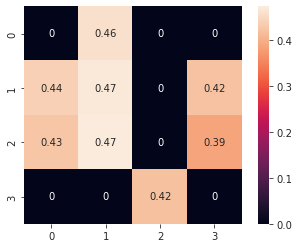

[PROGRESS] 'YUWEI-clu040.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.75it/s]


[PROGRESS] features extracted

100%|██████████| 39257/39257 [00:48<00:00, 812.93it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

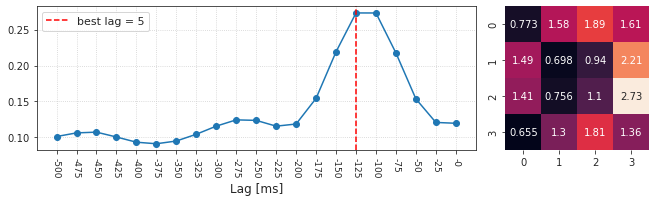

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.321346  0.044403
1.000000e-06  0.321703  0.044405
1.000000e-05  0.320839  0.044268
1.000000e-04  0.321765  0.044598
1.000000e-03  0.320119  0.044182
1.000000e-02  0.317184  0.043413
1.000000e-01  0.295353  0.037526
1.000000e+00  0.262647  0.029900
1.000000e+01  0.227984  0.022414

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.330262  0.046369
1.000000e-06  0.331810  0.046741
1.000000e-05  0.329783  0.046292
1.000000e-04  0.331925  0.046659
1.000000e-03  0.330584  0.046386
1.000000e-02  0.330353  0.045919
1.000000e-01  0.302814  0.038856
1.000000e+00  0.261365  0.030044
1.000000e+01  0.222495  0.021937

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                           
1.000000e-07  0.327174  0.046868
1.000000e-06  0.328379  0.047146
1.000000e-05  0.327693  0.047102
1.000000e-04  0.328180  0.047367
1.000000e-03  0.331428  0.047708
1.000000e-02  0.331313  0.047441
1.000000e-01  0.317009  0.042185
1.000000e+00  0.276805  0.032055
1.000000e+01  0.228302  0.022113

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.304576  0.040369
1.000000e-06  0.304306  0.040062
1.000000e-05  0.309833  0.041250
1.000000e-04  0.301086  0.039401
1.000000e-03  0.307471  0.040820
1.000000e-02  0.306118  0.040152
1.000000e-01  0.288142  0.034114
1.000000e+00  0.249997  0.025072
1.000000e+01  0.214407  0.017367

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (0, 3)

r      nnll
alpha                           
1.000000e-07  0.312023  0.042243
1.000000e-06  0.312706  0.042353
1.000000e-05  0.311397  0.042177
1.000000e-04  0.311865  0.042309
1.000000e-03  0.315353  0.042715
1.000000e-02  0.315790  0.042048
1.000000e-01  0.290740  0.034481
1.000000e+00  0.246203  0.024569
1.000000e+01  0.189340  0.014209

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                           
1.000000e-07  0.330307  0.046432
1.000000e-06  0.329753  0.046294
1.000000e-05  0.329489  0.046221
1.000000e-04  0.331343  0.046639
1.000000e-03  0.331680  0.046697
1.000000e-02  0.331350  0.046516
1.000000e-01  0.313252  0.040514
1.000000e+00  0.269063  0.028877
1.000000e+01  0.205804  0.017489

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                           
1.000000e-07  0.324151  0.045467
1.000000e-06  0.322670  0.045148
1.000000e-05  0.321458  0.044872
1.000000e-04  0.322536  0.044948
1.000000e-03  0.323846  0.045533
1.000000e-02  0.324777  0.045011
1.000000e-01  0.304608  0.037981
1.000000e+00  0.259599  0.026165
1.000000e+01  0.199941  0.015636

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.319020  0.042854
1.000000e-06  0.318857  0.042783
1.000000e-05  0.318904  0.042778
1.000000e-04  0.318692  0.042783
1.000000e-03  0.322450  0.043663
1.000000e-02  0.316580  0.041960
1.000000e-01  0.295067  0.035346
1.000000e+00  0.245334  0.023176
1.000000e+01  0.183024  0.012824

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu043, neuron # 0;  best alpha = 0.0001, best_r = 0.332

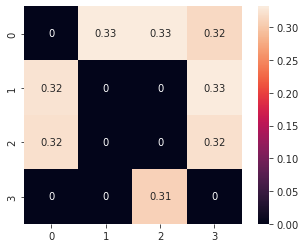

[PROGRESS] 'YUWEI-clu043.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 77/77 [00:44<00:00,  1.73it/s]


[PROGRESS] features extracted

100%|██████████| 62597/62597 [01:23<00:00, 753.42it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

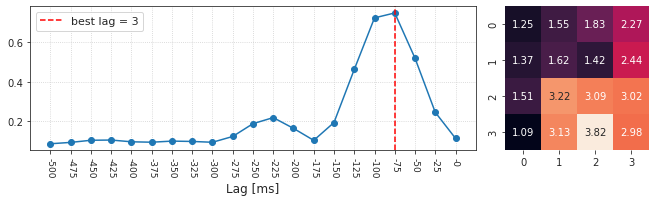

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.337619  0.111216
1.000000e-06  0.335614  0.110436
1.000000e-05  0.338442  0.111486
1.000000e-04  0.338912  0.111616
1.000000e-03  0.338023  0.111981
1.000000e-02  0.334027  0.110721
1.000000e-01  0.313973  0.098791
1.000000e+00  0.274987  0.077852
1.000000e+01  0.228070  0.054195

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.341539  0.108868
1.000000e-06  0.339734  0.107833
1.000000e-05  0.339515  0.109058
1.000000e-04  0.337993  0.108238
1.000000e-03  0.339494  0.108553
1.000000e-02  0.336727  0.107769
1.000000e-01  0.313949  0.095600
1.000000e+00  0.264295  0.070510
1.000000e+01  0.201409  0.042169

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.330589  0.106708
1.000000e-06  0.330889  0.106675
1.000000e-05  0.330093  0.106248
1.000000e-04  0.331146  0.107142
1.000000e-03  0.331973  0.107244
1.000000e-02  0.329994  0.107116
1.000000e-01  0.307685  0.094518
1.000000e+00  0.253318  0.069691
1.000000e+01  0.211509  0.047422

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.335113  0.107113
1.000000e-06  0.336310  0.107495
1.000000e-05  0.334284  0.106456
1.000000e-04  0.334658  0.107659
1.000000e-03  0.335880  0.107442
1.000000e-02  0.335068  0.107913
1.000000e-01  0.323192  0.101153
1.000000e+00  0.285621  0.078742
1.000000e+01  0.202040  0.041508

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.329982  0.103508
1.000000e-06  0.328634  0.103109
1.000000e-05  0.328632  0.102818
1.000000e-04  0.330357  0.103412
1.000000e-03  0.329335  0.104752
1.000000e-02  0.327154  0.103628
1.000000e-01  0.307105  0.092908
1.000000e+00  0.267525  0.072167
1.000000e+01  0.218524  0.045932

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.327665  0.104011
1.000000e-06  0.327979  0.103755
1.000000e-05  0.328647  0.104107
1.000000e-04  0.327692  0.103984
1.000000e-03  0.328176  0.104129
1.000000e-02  0.323881  0.101349
1.000000e-01  0.300911  0.089193
1.000000e+00  0.259445  0.068157
1.000000e+01  0.196256  0.037015

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.309811  0.092407
1.000000e-06  0.309061  0.091269
1.000000e-05  0.309005  0.091905
1.000000e-04  0.309045  0.091338
1.000000e-03  0.310443  0.091901
1.000000e-02  0.306133  0.090715
1.000000e-01  0.282430  0.079312
1.000000e+00  0.242160  0.059250
1.000000e+01  0.195818  0.036700

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (0, 3)

r      nnll
alpha                           
1.000000e-07  0.313527  0.090501
1.000000e-06  0.313095  0.090521
1.000000e-05  0.313600  0.091094
1.000000e-04  0.313115  0.090382
1.000000e-03  0.315240  0.092340
1.000000e-02  0.304355  0.087230
1.000000e-01  0.276529  0.073877
1.000000e+00  0.227135  0.050789
1.000000e+01  0.158773  0.025844

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu044, neuron # 0;  best alpha = 1e-07, best_r = 0.342

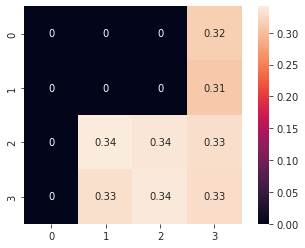

[PROGRESS] 'YUWEI-clu044.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.73it/s]


[PROGRESS] features extracted

100%|██████████| 47543/47543 [01:03<00:00, 746.44it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

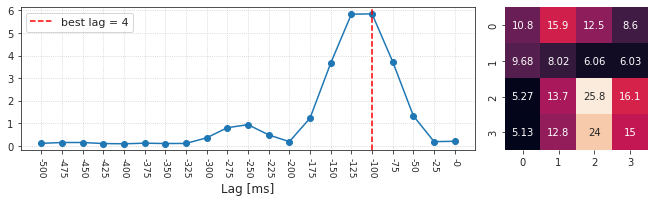

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.471283  0.380201
1.000000e-06  0.469583  0.379462
1.000000e-05  0.470846  0.379379
1.000000e-04  0.473514  0.381295
1.000000e-03  0.474591  0.381628
1.000000e-02  0.476069  0.380760
1.000000e-01  0.465639  0.364403
1.000000e+00  0.441718  0.331681
1.000000e+01  0.386120  0.266084

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.467431  0.364386
1.000000e-06  0.462238  0.360060
1.000000e-05  0.465066  0.364250
1.000000e-04  0.464377  0.362009
1.000000e-03  0.465085  0.362695
1.000000e-02  0.468417  0.363823
1.000000e-01  0.453560  0.340314
1.000000e+00  0.430951  0.299738
1.000000e+01  0.379366  0.241597

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.469450  0.373317
1.000000e-06  0.472771  0.372821
1.000000e-05  0.471107  0.371726
1.000000e-04  0.472460  0.372855
1.000000e-03  0.473104  0.369573
1.000000e-02  0.468062  0.363680
1.000000e-01  0.443236  0.336370
1.000000e+00  0.389149  0.279866
1.000000e+01  0.312222  0.179284

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                           
1.000000e-07  0.431627  0.333697
1.000000e-06  0.432254  0.334503
1.000000e-05  0.433577  0.334541
1.000000e-04  0.431947  0.334192
1.000000e-03  0.436313  0.337123
1.000000e-02  0.434263  0.326597
1.000000e-01  0.411866  0.285655
1.000000e+00  0.368960  0.225953
1.000000e+01  0.303418  0.162871

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.469399  0.360901
1.000000e-06  0.467849  0.360846
1.000000e-05  0.467858  0.360807
1.000000e-04  0.467397  0.361098
1.000000e-03  0.469180  0.359839
1.000000e-02  0.466363  0.352038
1.000000e-01  0.440857  0.325324
1.000000e+00  0.391316  0.269923
1.000000e+01  0.314979  0.162722

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.450861  0.361603
1.000000e-06  0.450056  0.361416
1.000000e-05  0.450341  0.361596
1.000000e-04  0.448117  0.360718
1.000000e-03  0.451905  0.362660
1.000000e-02  0.448962  0.359661
1.000000e-01  0.433256  0.334196
1.000000e+00  0.389562  0.280512
1.000000e+01  0.334281  0.196165

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.450207  0.351953
1.000000e-06  0.450971  0.353871
1.000000e-05  0.452275  0.354012
1.000000e-04  0.452245  0.353185
1.000000e-03  0.453325  0.354269
1.000000e-02  0.450797  0.347476
1.000000e-01  0.427188  0.305821
1.000000e+00  0.364843  0.233358
1.000000e+01  0.301855  0.156123

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                           
1.000000e-07  0.444754  0.347235
1.000000e-06  0.441251  0.346621
1.000000e-05  0.443191  0.347664
1.000000e-04  0.446705  0.349040
1.000000e-03  0.446984  0.349453
1.000000e-02  0.448076  0.343074
1.000000e-01  0.430050  0.298872
1.000000e+00  0.371130  0.220984
1.000000e+01  0.292261  0.144289

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu053, neuron # 0;  best alpha = 0.01, best_r = 0.476

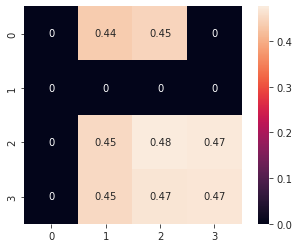

[PROGRESS] 'YUWEI-clu053.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.72it/s]


[PROGRESS] features extracted

100%|██████████| 36178/36178 [00:48<00:00, 750.98it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

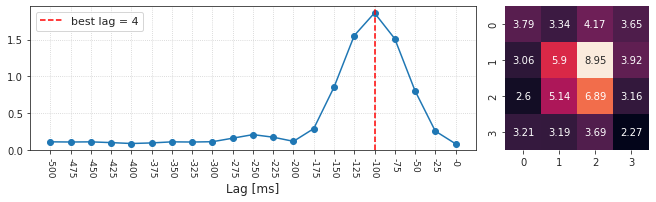

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.376236  0.203444
1.000000e-06  0.378690  0.206667
1.000000e-05  0.378064  0.202812
1.000000e-04  0.382220  0.207192
1.000000e-03  0.378635  0.204967
1.000000e-02  0.384389  0.207773
1.000000e-01  0.376351  0.194481
1.000000e+00  0.336171  0.156116
1.000000e+01  0.272437  0.100284

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.384817  0.200705
1.000000e-06  0.383784  0.200693
1.000000e-05  0.383561  0.199782
1.000000e-04  0.381343  0.198947
1.000000e-03  0.381872  0.201568
1.000000e-02  0.384006  0.200341
1.000000e-01  0.363033  0.178757
1.000000e+00  0.320588  0.139430
1.000000e+01  0.262483  0.096448

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.380989  0.192682
1.000000e-06  0.379794  0.190344
1.000000e-05  0.382559  0.193276
1.000000e-04  0.378596  0.191183
1.000000e-03  0.382501  0.194441
1.000000e-02  0.379247  0.194028
1.000000e-01  0.356503  0.171354
1.000000e+00  0.311731  0.129880
1.000000e+01  0.240547  0.082497

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.381045  0.195594
1.000000e-06  0.378547  0.195994
1.000000e-05  0.379444  0.195904
1.000000e-04  0.379601  0.196197
1.000000e-03  0.383650  0.199124
1.000000e-02  0.384141  0.198358
1.000000e-01  0.366339  0.177195
1.000000e+00  0.319168  0.135192
1.000000e+01  0.243499  0.083422

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                           
1.000000e-07  0.368462  0.187120
1.000000e-06  0.368080  0.186863
1.000000e-05  0.367864  0.187013
1.000000e-04  0.370107  0.186793
1.000000e-03  0.371165  0.189138
1.000000e-02  0.367259  0.183093
1.000000e-01  0.344025  0.159580
1.000000e+00  0.307438  0.128205
1.000000e+01  0.271748  0.085415

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.357709  0.176471
1.000000e-06  0.360035  0.177532
1.000000e-05  0.359623  0.177728
1.000000e-04  0.357873  0.174450
1.000000e-03  0.357877  0.174607
1.000000e-02  0.361796  0.175466
1.000000e-01  0.340861  0.156579
1.000000e+00  0.313101  0.132655
1.000000e+01  0.283373  0.090515

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                           
1.000000e-07  0.359479  0.169892
1.000000e-06  0.361156  0.170046
1.000000e-05  0.360833  0.170007
1.000000e-04  0.360733  0.170300
1.000000e-03  0.359841  0.168409
1.000000e-02  0.348823  0.156916
1.000000e-01  0.318886  0.128554
1.000000e+00  0.272884  0.096330
1.000000e+01  0.193730  0.048684

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.343676  0.163712
1.000000e-06  0.343991  0.163823
1.000000e-05  0.342270  0.163786
1.000000e-04  0.342867  0.163719
1.000000e-03  0.342766  0.163500
1.000000e-02  0.331849  0.156105
1.000000e-01  0.302900  0.129399
1.000000e+00  0.268585  0.099190
1.000000e+01  0.211357  0.054311

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu055, neuron # 0;  best alpha = 1e-07, best_r = 0.385

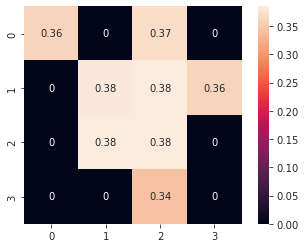

[PROGRESS] 'YUWEI-clu055.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:34<00:00,  1.70it/s]


[PROGRESS] features extracted

100%|██████████| 44504/44504 [00:57<00:00, 777.89it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

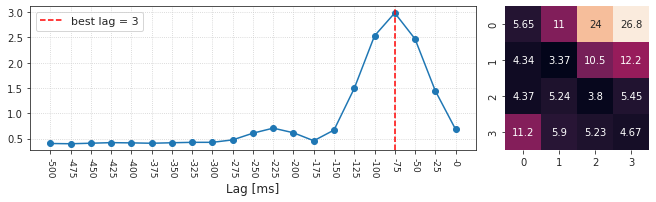

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (0, 3)

r      nnll
alpha                           
1.000000e-07  0.596347  0.392492
1.000000e-06  0.596367  0.392750
1.000000e-05  0.596069  0.391715
1.000000e-04  0.598287  0.391937
1.000000e-03  0.598321  0.392802
1.000000e-02  0.593344  0.384928
1.000000e-01  0.574690  0.350181
1.000000e+00  0.533529  0.300570
1.000000e+01  0.448935  0.225029

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                           
1.000000e-07  0.610510  0.420875
1.000000e-06  0.608229  0.420324
1.000000e-05  0.608405  0.420994
1.000000e-04  0.611208  0.424016
1.000000e-03  0.607127  0.421239
1.000000e-02  0.615071  0.420717
1.000000e-01  0.604246  0.395326
1.000000e+00  0.566385  0.339502
1.000000e+01  0.472577  0.248717

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.552345  0.353017
1.000000e-06  0.553273  0.355344
1.000000e-05  0.561730  0.357730
1.000000e-04  0.565639  0.359615
1.000000e-03  0.563983  0.358797
1.000000e-02  0.552972  0.348979
1.000000e-01  0.522651  0.309714
1.000000e+00  0.479599  0.246605
1.000000e+01  0.405147  0.165212

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.553327  0.340810
1.000000e-06  0.553517  0.341790
1.000000e-05  0.556571  0.344469
1.000000e-04  0.547553  0.340398
1.000000e-03  0.553704  0.341509
1.000000e-02  0.516428  0.302906
1.000000e-01  0.452737  0.239826
1.000000e+00  0.385751  0.176444
1.000000e+01  0.320110  0.114949

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                           
1.000000e-07  0.557280  0.375006
1.000000e-06  0.563740  0.377615
1.000000e-05  0.551907  0.373945
1.000000e-04  0.562031  0.375829
1.000000e-03  0.557742  0.374863
1.000000e-02  0.556971  0.365950
1.000000e-01  0.531969  0.331237
1.000000e+00  0.471355  0.270841
1.000000e+01  0.392538  0.176540

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.576255  0.381281
1.000000e-06  0.578315  0.380716
1.000000e-05  0.577226  0.381321
1.000000e-04  0.581659  0.384120
1.000000e-03  0.579486  0.382439
1.000000e-02  0.579926  0.377752
1.000000e-01  0.562378  0.342213
1.000000e+00  0.515095  0.261586
1.000000e+01  0.380352  0.141989

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.547784  0.335580
1.000000e-06  0.546088  0.335021
1.000000e-05  0.550453  0.338253
1.000000e-04  0.551496  0.338352
1.000000e-03  0.551823  0.337487
1.000000e-02  0.537472  0.321049
1.000000e-01  0.459616  0.257897
1.000000e+00  0.398609  0.173319
1.000000e+01  0.307355  0.092771

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                           
1.000000e-07  0.449237  0.314063
1.000000e-06  0.455287  0.316483
1.000000e-05  0.457137  0.314861
1.000000e-04  0.454435  0.314984
1.000000e-03  0.464933  0.315386
1.000000e-02  0.498076  0.309181
1.000000e-01  0.500784  0.271477
1.000000e+00  0.432681  0.188157
1.000000e+01  0.265293  0.079382

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu059, neuron # 0;  best alpha = 0.01, best_r = 0.615

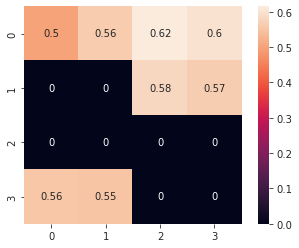

[PROGRESS] 'YUWEI-clu059.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.72it/s]


[PROGRESS] features extracted

100%|██████████| 25985/25985 [00:33<00:00, 783.31it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

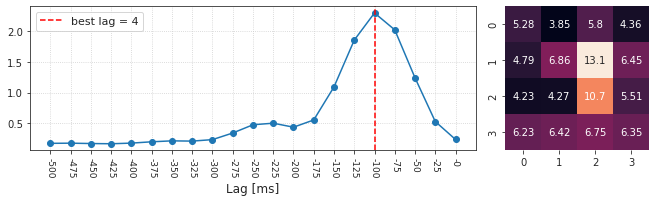

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.111414  0.136223
1.000000e-06  0.113816  0.142179
1.000000e-05  0.113893  0.128209
1.000000e-04  0.108230  0.142517
1.000000e-03  0.133646  0.200858
1.000000e-02  0.134029  0.200612
1.000000e-01  0.126286  0.180664
1.000000e+00  0.113427  0.150761
1.000000e+01  0.111179  0.109289

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.172934  0.274706
1.000000e-06  0.175828  0.275857
1.000000e-05  0.175332  0.283189
1.000000e-04  0.172534  0.285746
1.000000e-03  0.181044  0.319879
1.000000e-02  0.174388  0.297522
1.000000e-01  0.151959  0.229624
1.000000e+00  0.114718  0.129178
1.000000e+01  0.080741  0.052320

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.106986  0.057236
1.000000e-06  0.105019  0.031074
1.000000e-05  0.106873  0.063715
1.000000e-04  0.111503  0.068774
1.000000e-03  0.122375  0.117992
1.000000e-02  0.124951  0.126410
1.000000e-01  0.106011  0.110585
1.000000e+00  0.081438  0.068894
1.000000e+01  0.057314  0.028790

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.155211  0.135670
1.000000e-06  0.146590  0.157231
1.000000e-05  0.149762  0.152770
1.000000e-04  0.152969  0.184272
1.000000e-03  0.160223  0.214136
1.000000e-02  0.145384  0.215880
1.000000e-01  0.124324  0.172685
1.000000e+00  0.101377  0.102968
1.000000e+01  0.082259  0.040778

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.111203  0.130004
1.000000e-06  0.118905  0.141554
1.000000e-05  0.110036  0.119545
1.000000e-04  0.114415  0.120801
1.000000e-03  0.130144  0.181787
1.000000e-02  0.121623  0.163834
1.000000e-01  0.110154  0.140504
1.000000e+00  0.109681  0.103857
1.000000e+01  0.104454  0.052996

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.145702  0.185052
1.000000e-06  0.148802  0.200185
1.000000e-05  0.143335  0.190825
1.000000e-04  0.149632  0.213519
1.000000e-03  0.143859  0.213282
1.000000e-02  0.127046  0.175525
1.000000e-01  0.111747  0.125011
1.000000e+00  0.084922  0.072188
1.000000e+01  0.071128  0.036211

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.104894  0.112011
1.000000e-06  0.130388  0.130943
1.000000e-05  0.127385  0.142642
1.000000e-04  0.136753  0.183869
1.000000e-03  0.152296  0.219384
1.000000e-02  0.151267  0.206575
1.000000e-01  0.136593  0.159458
1.000000e+00  0.096600  0.074427
1.000000e+01  0.073113  0.022245

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu061, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.083150  0.082113
1.000000e-06  0.099270  0.103205
1.000000e-05  0.088921  0.076221
1.000000e-04  0.104326  0.108789
1.000000e-03  0.098822  0.130985
1.000000e-02  0.090911  0.107791
1.000000e-01  0.084459  0.077284
1.000000e+00  0.070637  0.051865
1.000000e+01  0.064280  0.030176

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu061, neuron # 0;  best alpha = 0.001, best_r = 0.181

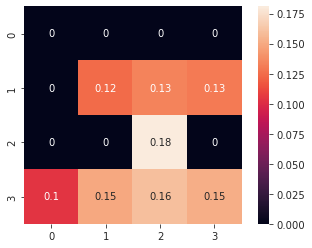

[PROGRESS] 'YUWEI-clu061.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.71it/s]


[PROGRESS] features extracted

100%|██████████| 36360/36360 [00:45<00:00, 792.95it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

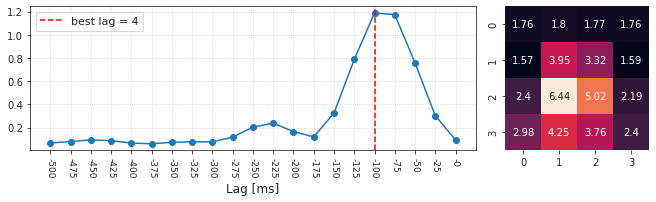

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.331988  0.135839
1.000000e-06  0.333538  0.136597
1.000000e-05  0.333132  0.136449
1.000000e-04  0.331778  0.135980
1.000000e-03  0.333777  0.137498
1.000000e-02  0.336793  0.138547
1.000000e-01  0.331495  0.132769
1.000000e+00  0.310318  0.118118
1.000000e+01  0.265112  0.089689

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.333834  0.135135
1.000000e-06  0.333099  0.134714
1.000000e-05  0.335442  0.135349
1.000000e-04  0.335169  0.135935
1.000000e-03  0.331807  0.134749
1.000000e-02  0.332113  0.134512
1.000000e-01  0.318957  0.124361
1.000000e+00  0.288416  0.104851
1.000000e+01  0.243366  0.074112

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.321514  0.129696
1.000000e-06  0.321987  0.129112
1.000000e-05  0.320866  0.128470
1.000000e-04  0.321259  0.128915
1.000000e-03  0.320575  0.128674
1.000000e-02  0.323685  0.130740
1.000000e-01  0.314873  0.124422
1.000000e+00  0.282279  0.101661
1.000000e+01  0.237734  0.065224

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.320163  0.122466
1.000000e-06  0.320326  0.122225
1.000000e-05  0.321639  0.123604
1.000000e-04  0.318214  0.121010
1.000000e-03  0.319557  0.123493
1.000000e-02  0.324076  0.126518
1.000000e-01  0.316180  0.118968
1.000000e+00  0.284883  0.098331
1.000000e+01  0.244421  0.073007

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.305217  0.117187
1.000000e-06  0.306288  0.118327
1.000000e-05  0.307721  0.117828
1.000000e-04  0.308668  0.119241
1.000000e-03  0.309565  0.119392
1.000000e-02  0.307505  0.117543
1.000000e-01  0.287274  0.104853
1.000000e+00  0.247210  0.080275
1.000000e+01  0.198625  0.047365

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.308728  0.120215
1.000000e-06  0.313450  0.122962
1.000000e-05  0.313758  0.122837
1.000000e-04  0.311292  0.120472
1.000000e-03  0.312083  0.122505
1.000000e-02  0.318751  0.125426
1.000000e-01  0.305527  0.115386
1.000000e+00  0.279237  0.096893
1.000000e+01  0.247941  0.070696

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.312553  0.123807
1.000000e-06  0.311562  0.124157
1.000000e-05  0.311190  0.122340
1.000000e-04  0.312973  0.124152
1.000000e-03  0.312402  0.124489
1.000000e-02  0.317019  0.127161
1.000000e-01  0.309599  0.120664
1.000000e+00  0.276055  0.092531
1.000000e+01  0.205433  0.045333

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu064, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.322866  0.132592
1.000000e-06  0.321901  0.132242
1.000000e-05  0.321950  0.132131
1.000000e-04  0.321675  0.132318
1.000000e-03  0.322344  0.132045
1.000000e-02  0.328821  0.135913
1.000000e-01  0.315807  0.128074
1.000000e+00  0.285240  0.100400
1.000000e+01  0.238966  0.058323

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu064, neuron # 0;  best alpha = 0.01, best_r = 0.337

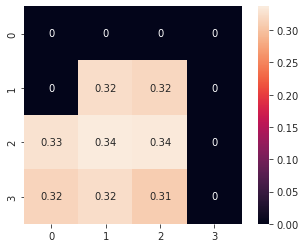

[PROGRESS] 'YUWEI-clu064.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.74it/s]


[PROGRESS] features extracted

100%|██████████| 34510/34510 [00:45<00:00, 758.94it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

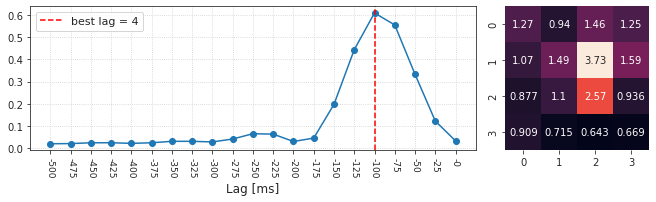

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.307410  0.066111
1.000000e-06  0.307459  0.066134
1.000000e-05  0.307124  0.066003
1.000000e-04  0.307716  0.066192
1.000000e-03  0.306835  0.066401
1.000000e-02  0.308620  0.067058
1.000000e-01  0.303880  0.064331
1.000000e+00  0.290207  0.057050
1.000000e+01  0.259959  0.045635

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.293072  0.058742
1.000000e-06  0.293993  0.059646
1.000000e-05  0.294381  0.059402
1.000000e-04  0.293315  0.059412
1.000000e-03  0.294163  0.059291
1.000000e-02  0.297731  0.060457
1.000000e-01  0.290222  0.057313
1.000000e+00  0.270834  0.050493
1.000000e+01  0.242145  0.040211

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.291991  0.058960
1.000000e-06  0.290886  0.058686
1.000000e-05  0.288743  0.057436
1.000000e-04  0.287374  0.057572
1.000000e-03  0.290480  0.058852
1.000000e-02  0.289599  0.059148
1.000000e-01  0.280960  0.056056
1.000000e+00  0.267985  0.049796
1.000000e+01  0.244544  0.038279

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.290767  0.058558
1.000000e-06  0.290870  0.058842
1.000000e-05  0.288822  0.057983
1.000000e-04  0.289942  0.058228
1.000000e-03  0.289876  0.058538
1.000000e-02  0.291186  0.059252
1.000000e-01  0.281782  0.054839
1.000000e+00  0.260518  0.046686
1.000000e+01  0.233650  0.035319

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                           
1.000000e-07  0.292673  0.061723
1.000000e-06  0.293502  0.061625
1.000000e-05  0.294822  0.061868
1.000000e-04  0.290990  0.061002
1.000000e-03  0.294626  0.061719
1.000000e-02  0.295140  0.062137
1.000000e-01  0.287920  0.058351
1.000000e+00  0.269637  0.048303
1.000000e+01  0.221928  0.030850

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                           
1.000000e-07  0.273925  0.052095
1.000000e-06  0.274066  0.051597
1.000000e-05  0.276476  0.052537
1.000000e-04  0.274351  0.051637
1.000000e-03  0.274897  0.052276
1.000000e-02  0.278123  0.053468
1.000000e-01  0.272947  0.050802
1.000000e+00  0.252789  0.041390
1.000000e+01  0.198055  0.023705

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (0, 3)

r      nnll
alpha                           
1.000000e-07  0.291814  0.058803
1.000000e-06  0.292577  0.059145
1.000000e-05  0.292380  0.059121
1.000000e-04  0.293861  0.059772
1.000000e-03  0.294166  0.060008
1.000000e-02  0.294193  0.060413
1.000000e-01  0.281422  0.055534
1.000000e+00  0.265262  0.046605
1.000000e+01  0.215387  0.027021

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu068, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.279057  0.054894
1.000000e-06  0.279521  0.054663
1.000000e-05  0.280285  0.054945
1.000000e-04  0.281771  0.055645
1.000000e-03  0.281123  0.054994
1.000000e-02  0.279898  0.054539
1.000000e-01  0.268742  0.049425
1.000000e+00  0.247123  0.040594
1.000000e+01  0.224210  0.029647

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu068, neuron # 0;  best alpha = 0.01, best_r = 0.309

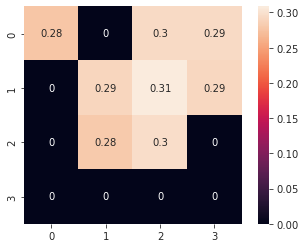

[PROGRESS] 'YUWEI-clu068.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 72/72 [00:41<00:00,  1.73it/s]


[PROGRESS] features extracted

100%|██████████| 23298/23298 [00:30<00:00, 769.62it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

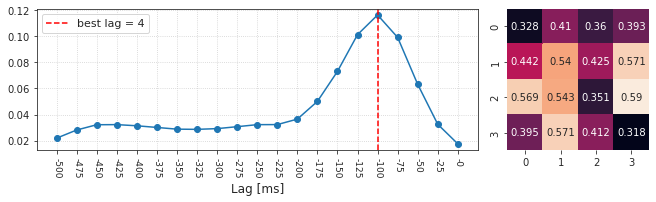

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.072990 -0.000715
1.000000e-06  0.075199 -0.000066
1.000000e-05  0.072902 -0.000770
1.000000e-04  0.076138  0.002372
1.000000e-03  0.079114  0.003564
1.000000e-02  0.080605  0.007371
1.000000e-01  0.079633  0.008806
1.000000e+00  0.075379  0.007428
1.000000e+01  0.066661  0.004236

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.057661 -0.008295
1.000000e-06  0.059081 -0.005831
1.000000e-05  0.060053 -0.005207
1.000000e-04  0.062149 -0.004793
1.000000e-03  0.064659 -0.001967
1.000000e-02  0.071365  0.002975
1.000000e-01  0.080302  0.007861
1.000000e+00  0.079851  0.007703
1.000000e+01  0.070449  0.004729

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.063836 -0.009606
1.000000e-06  0.062569 -0.008848
1.000000e-05  0.063439 -0.007758
1.000000e-04  0.065827 -0.007859
1.000000e-03  0.061108 -0.008602
1.000000e-02  0.069629  0.002475
1.000000e-01  0.074402  0.006642
1.000000e+00  0.072243  0.005518
1.000000e+01  0.063187  0.003171

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.056733 -0.007215
1.000000e-06  0.058890 -0.007818
1.000000e-05  0.056546 -0.006639
1.000000e-04  0.050941 -0.008632
1.000000e-03  0.058414 -0.003469
1.000000e-02  0.065419  0.002041
1.000000e-01  0.071320  0.005425
1.000000e+00  0.071877  0.005603
1.000000e+01  0.070344  0.004160

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.077282  0.000325
1.000000e-06  0.076121  0.001247
1.000000e-05  0.074643 -0.000447
1.000000e-04  0.076090  0.000988
1.000000e-03  0.075518  0.000742
1.000000e-02  0.078113  0.006659
1.000000e-01  0.076451  0.007194
1.000000e+00  0.073366  0.005451
1.000000e+01  0.068103  0.002860

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.065593 -0.002001
1.000000e-06  0.068807 -0.000995
1.000000e-05  0.068266 -0.001880
1.000000e-04  0.068123 -0.001086
1.000000e-03  0.068361 -0.000055
1.000000e-02  0.070282  0.005140
1.000000e-01  0.070380  0.006551
1.000000e+00  0.065347  0.004738
1.000000e+01  0.057776  0.001638

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                           
1.000000e-07  0.049639 -0.002052
1.000000e-06  0.047482 -0.003959
1.000000e-05  0.048059 -0.004823
1.000000e-04  0.045365 -0.007028
1.000000e-03  0.046026 -0.005369
1.000000e-02  0.049432 -0.000070
1.000000e-01  0.052782  0.002692
1.000000e+00  0.049891  0.002169
1.000000e+01  0.049821  0.001692

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu069, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.070684 -0.003587
1.000000e-06  0.072287 -0.004517
1.000000e-05  0.071012 -0.004769
1.000000e-04  0.074520 -0.001022
1.000000e-03  0.076587  0.001397
1.000000e-02  0.077983  0.005773
1.000000e-01  0.082397  0.008498
1.000000e+00  0.076108  0.006655
1.000000e+01  0.058383  0.002426

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu069, neuron # 0;  best alpha = 0.1, best_r = 0.082

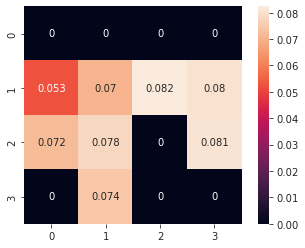

[PROGRESS] 'YUWEI-clu069.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.72it/s]


[PROGRESS] features extracted

100%|██████████| 35233/35233 [00:46<00:00, 757.24it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

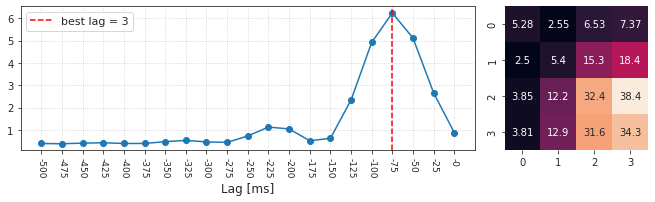

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.484332  0.515089
1.000000e-06  0.484040  0.517179
1.000000e-05  0.493256  0.521651
1.000000e-04  0.488945  0.514411
1.000000e-03  0.495892  0.522064
1.000000e-02  0.494104  0.509641
1.000000e-01  0.464882  0.463314
1.000000e+00  0.392225  0.381666
1.000000e+01  0.313814  0.284960

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.466367  0.494466
1.000000e-06  0.469295  0.494813
1.000000e-05  0.470047  0.494580
1.000000e-04  0.474562  0.495113
1.000000e-03  0.479242  0.497718
1.000000e-02  0.477029  0.480091
1.000000e-01  0.439518  0.420779
1.000000e+00  0.337870  0.337228
1.000000e+01  0.259071  0.238712

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.505434  0.530733
1.000000e-06  0.501276  0.527268
1.000000e-05  0.500772  0.525998
1.000000e-04  0.500720  0.529608
1.000000e-03  0.504683  0.527593
1.000000e-02  0.504616  0.523136
1.000000e-01  0.472378  0.471079
1.000000e+00  0.395054  0.359674
1.000000e+01  0.331881  0.270412

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.480995  0.499622
1.000000e-06  0.481182  0.501041
1.000000e-05  0.478639  0.498774
1.000000e-04  0.482258  0.500354
1.000000e-03  0.480702  0.499947
1.000000e-02  0.476592  0.486389
1.000000e-01  0.452978  0.431789
1.000000e+00  0.371518  0.347926
1.000000e+01  0.280434  0.256514

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.282941  0.431733
1.000000e-06  0.230962  0.419836
1.000000e-05  0.259787  0.423291
1.000000e-04  0.231431  0.421722
1.000000e-03  0.259096  0.424040
1.000000e-02  0.423560  0.429967
1.000000e-01  0.388474  0.363668
1.000000e+00  0.336377  0.282643
1.000000e+01  0.279260  0.186502

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.406059  0.442046
1.000000e-06  0.382218  0.433144
1.000000e-05  0.396687  0.437853
1.000000e-04  0.403464  0.435597
1.000000e-03  0.418806  0.443586
1.000000e-02  0.430916  0.424640
1.000000e-01  0.389522  0.347058
1.000000e+00  0.320204  0.257719
1.000000e+01  0.251504  0.168287

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.409434  0.391849
1.000000e-06  0.414463  0.390020
1.000000e-05  0.418218  0.388637
1.000000e-04  0.415976  0.384124
1.000000e-03  0.415586  0.396475
1.000000e-02  0.400988  0.385895
1.000000e-01  0.364354  0.340246
1.000000e+00  0.314270  0.262639
1.000000e+01  0.240155  0.162710

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu081, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.436309  0.423897
1.000000e-06  0.429477  0.418184
1.000000e-05  0.435160  0.422755
1.000000e-04  0.434713  0.418491
1.000000e-03  0.430935  0.421275
1.000000e-02  0.427068  0.420546
1.000000e-01  0.385710  0.358212
1.000000e+00  0.315369  0.253291
1.000000e+01  0.240751  0.149058

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu081, neuron # 0;  best alpha = 1e-07, best_r = 0.505

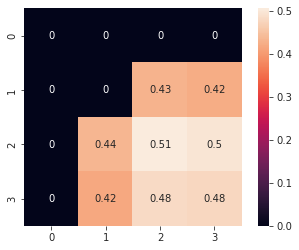

[PROGRESS] 'YUWEI-clu081.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:27<00:00,  2.09it/s]


[PROGRESS] features extracted

100%|██████████| 18709/18709 [00:23<00:00, 803.06it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

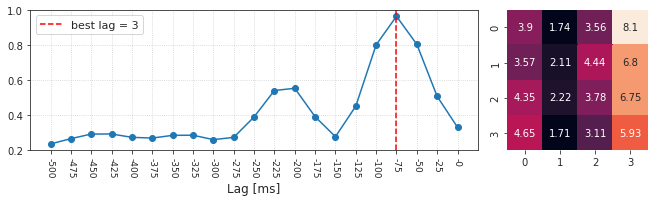

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (0, 3)

r      nnll
alpha                           
1.000000e-07  0.176686  0.078761
1.000000e-06  0.170905  0.075425
1.000000e-05  0.175667  0.079020
1.000000e-04  0.176672  0.079646
1.000000e-03  0.182069  0.086032
1.000000e-02  0.180608  0.082436
1.000000e-01  0.173024  0.069652
1.000000e+00  0.145230  0.048709
1.000000e+01  0.120687  0.032608

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.212679  0.092587
1.000000e-06  0.210048  0.091047
1.000000e-05  0.212100  0.088802
1.000000e-04  0.210233  0.095824
1.000000e-03  0.213504  0.100581
1.000000e-02  0.215812  0.105121
1.000000e-01  0.205614  0.096029
1.000000e+00  0.173111  0.070202
1.000000e+01  0.147991  0.048596

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.198551  0.087354
1.000000e-06  0.196861  0.087596
1.000000e-05  0.199665  0.091160
1.000000e-04  0.197824  0.085328
1.000000e-03  0.205916  0.102748
1.000000e-02  0.207882  0.105464
1.000000e-01  0.202333  0.096598
1.000000e+00  0.187304  0.079913
1.000000e+01  0.175601  0.062957

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.191306  0.073592
1.000000e-06  0.195516  0.075649
1.000000e-05  0.194259  0.075122
1.000000e-04  0.193936  0.078009
1.000000e-03  0.198327  0.087391
1.000000e-02  0.193247  0.087035
1.000000e-01  0.173571  0.069307
1.000000e+00  0.155932  0.054251
1.000000e+01  0.146601  0.040350

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.178021  0.071454
1.000000e-06  0.134884  0.068133
1.000000e-05  0.143867  0.069525
1.000000e-04  0.164708  0.075357
1.000000e-03  0.189200  0.088004
1.000000e-02  0.177380  0.080739
1.000000e-01  0.141571  0.054266
1.000000e+00  0.113066  0.029072
1.000000e+01  0.087076  0.014033

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.184131  0.073652
1.000000e-06  0.183862  0.073079
1.000000e-05  0.185079  0.073211
1.000000e-04  0.185148  0.072180
1.000000e-03  0.181461  0.076045
1.000000e-02  0.172601  0.074854
1.000000e-01  0.160382  0.065332
1.000000e+00  0.136084  0.045563
1.000000e+01  0.108103  0.028371

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.223321  0.097698
1.000000e-06  0.223657  0.095041
1.000000e-05  0.221460  0.096379
1.000000e-04  0.220274  0.098469
1.000000e-03  0.218260  0.101828
1.000000e-02  0.206443  0.104846
1.000000e-01  0.183338  0.085947
1.000000e+00  0.156848  0.054423
1.000000e+01  0.122289  0.026995

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu082, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                           
1.000000e-07  0.193988  0.096580
1.000000e-06  0.194983  0.097043
1.000000e-05  0.191360  0.096279
1.000000e-04  0.193783  0.096403
1.000000e-03  0.194900  0.103258
1.000000e-02  0.183340  0.093756
1.000000e-01  0.162820  0.071847
1.000000e+00  0.138809  0.049004
1.000000e+01  0.117389  0.029212

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu082, neuron # 0;  best alpha = 1e-06, best_r = 0.224

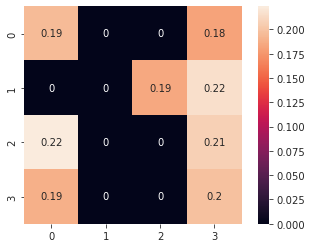

[PROGRESS] 'YUWEI-clu082.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 58/58 [00:33<00:00,  1.73it/s]


[PROGRESS] features extracted

100%|██████████| 43635/43635 [00:55<00:00, 779.25it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

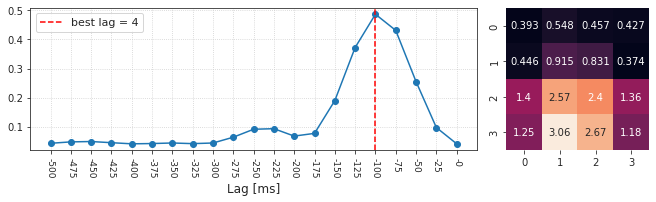

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                           
1.000000e-07  0.418168  0.067264
1.000000e-06  0.415469  0.066616
1.000000e-05  0.418476  0.067638
1.000000e-04  0.418326  0.067556
1.000000e-03  0.417132  0.067336
1.000000e-02  0.421691  0.068121
1.000000e-01  0.398748  0.060591
1.000000e+00  0.358699  0.050051
1.000000e+01  0.320880  0.040604

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                           
1.000000e-07  0.395985  0.058585
1.000000e-06  0.396229  0.058586
1.000000e-05  0.394911  0.058576
1.000000e-04  0.394007  0.058003
1.000000e-03  0.394469  0.058218
1.000000e-02  0.394441  0.058594
1.000000e-01  0.378371  0.053408
1.000000e+00  0.334190  0.042566
1.000000e+01  0.283906  0.031805

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.417988  0.067329
1.000000e-06  0.419273  0.067419
1.000000e-05  0.416672  0.067131
1.000000e-04  0.418290  0.067294
1.000000e-03  0.417526  0.067152
1.000000e-02  0.420065  0.067744
1.000000e-01  0.412276  0.064048
1.000000e+00  0.377983  0.053721
1.000000e+01  0.330672  0.039520

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.402892  0.061260
1.000000e-06  0.400569  0.060637
1.000000e-05  0.402073  0.060926
1.000000e-04  0.404409  0.061848
1.000000e-03  0.399713  0.060288
1.000000e-02  0.401149  0.060702
1.000000e-01  0.389531  0.056647
1.000000e+00  0.351538  0.045801
1.000000e+01  0.299450  0.032616

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.403459  0.062049
1.000000e-06  0.396554  0.060193
1.000000e-05  0.399117  0.060938
1.000000e-04  0.397822  0.060573
1.000000e-03  0.397816  0.060869
1.000000e-02  0.401241  0.061612
1.000000e-01  0.380259  0.054862
1.000000e+00  0.342645  0.043424
1.000000e+01  0.283193  0.028597

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.368533  0.052463
1.000000e-06  0.367834  0.052276
1.000000e-05  0.366615  0.052018
1.000000e-04  0.366605  0.052080
1.000000e-03  0.367789  0.052199
1.000000e-02  0.363347  0.050909
1.000000e-01  0.333383  0.042850
1.000000e+00  0.298593  0.033033
1.000000e+01  0.250012  0.020123

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                           
1.000000e-07  0.383773  0.056349
1.000000e-06  0.383506  0.056214
1.000000e-05  0.383812  0.056510
1.000000e-04  0.384035  0.056438
1.000000e-03  0.382672  0.056081
1.000000e-02  0.381174  0.055442
1.000000e-01  0.349183  0.046114
1.000000e+00  0.316277  0.036720
1.000000e+01  0.268427  0.023982

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu087, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.360431  0.048289
1.000000e-06  0.359738  0.048199
1.000000e-05  0.361567  0.048399
1.000000e-04  0.359269  0.047959
1.000000e-03  0.358681  0.047876
1.000000e-02  0.355260  0.046639
1.000000e-01  0.318607  0.038808
1.000000e+00  0.287851  0.031082
1.000000e+01  0.254873  0.018940

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu087, neuron # 0;  best alpha = 0.01, best_r = 0.422

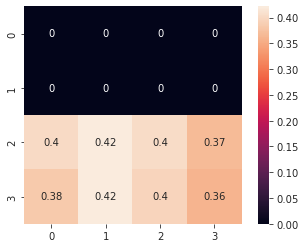

[PROGRESS] 'YUWEI-clu087.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 5/5 [00:02<00:00,  1.73it/s]


[PROGRESS] features extracted

100%|██████████| 14960/14960 [00:19<00:00, 771.40it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

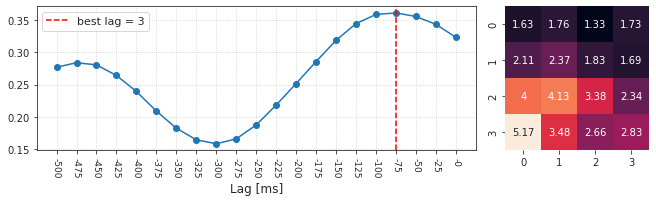

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (3, 0)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.058980 -0.070349  0.104491 -86.342283
1.000000e-06  0.057789 -0.074015  0.160161 -92.780730
1.000000e-05  0.055841 -0.067343  0.047628 -97.535054
1.000000e-04  0.059270 -0.068235  0.177883 -81.989020
1.000000e-03  0.057059 -0.042552  0.150306 -75.740510
1.000000e-02  0.053619 -0.012159  0.239399 -31.960337
1.000000e-01  0.057091  0.010256  0.365057   1.227406
1.000000e+00  0.052510  0.011261  0.404768   5.102642
1.000000e+01  0.044299  0.008534  0.411912  -1.406845

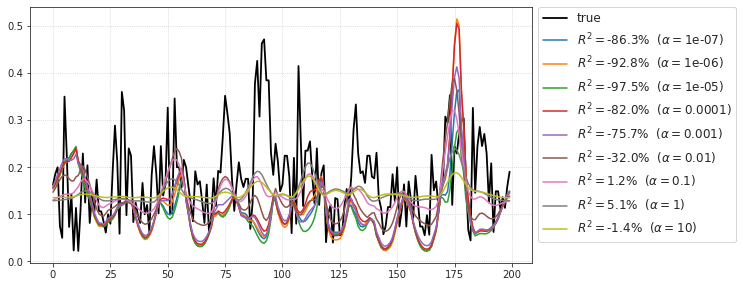

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.053761 -0.086589  0.086408 -43.244542
1.000000e-06  0.059071 -0.062202  0.091526 -39.230765
1.000000e-05  0.059592 -0.056454  0.110061 -35.863239
1.000000e-04  0.057584 -0.068310  0.151040 -35.191153
1.000000e-03  0.061197 -0.031608  0.206283 -16.775975
1.000000e-02  0.058737  0.002884  0.425538  12.613624
1.000000e-01  0.058117  0.015716  0.482056  16.553480
1.000000e+00  0.052495  0.014171  0.448188   7.734122
1.000000e+01  0.050503  0.011639  0.387083  -0.374342

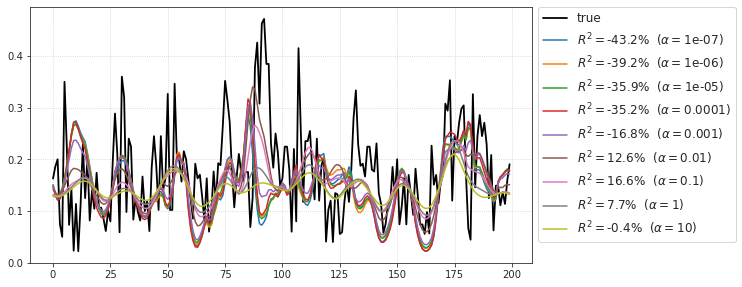

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (2, 0)

r      nnll     r_tst        r2_tst
alpha                                                   
1.000000e-07  0.059285 -0.097460  0.180461 -45042.202072
1.000000e-06  0.061873 -0.094734  0.185047 -45123.682443
1.000000e-05  0.061069 -0.103064  0.210614  -7523.711400
1.000000e-04  0.058883 -0.105645  0.181174 -45489.105400
1.000000e-03  0.063044 -0.062336  0.210421 -10341.621210
1.000000e-02  0.058698 -0.005404  0.313395   -310.100559
1.000000e-01  0.058348  0.014106  0.438271     -9.142843
1.000000e+00  0.054578  0.015365  0.450594     14.667741
1.000000e+01  0.051992  0.012897  0.427250     13.282847

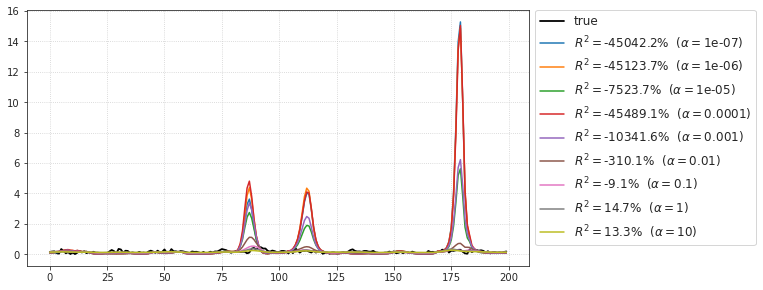

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (3, 1)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.099009 -0.051218 -0.004175 -225.613203
1.000000e-06  0.094419 -0.061796 -0.004641 -213.558568
1.000000e-05  0.095362 -0.051844 -0.016493 -229.858929
1.000000e-04  0.100289 -0.029355 -0.007078 -183.036416
1.000000e-03  0.106798 -0.001724 -0.019221 -173.472824
1.000000e-02  0.107504  0.040483 -0.033547  -85.069995
1.000000e-01  0.089236  0.036118  0.086847  -22.885568
1.000000e+00  0.073528  0.023470  0.466313   19.396784
1.000000e+01  0.061824  0.014158  0.518839   22.419289

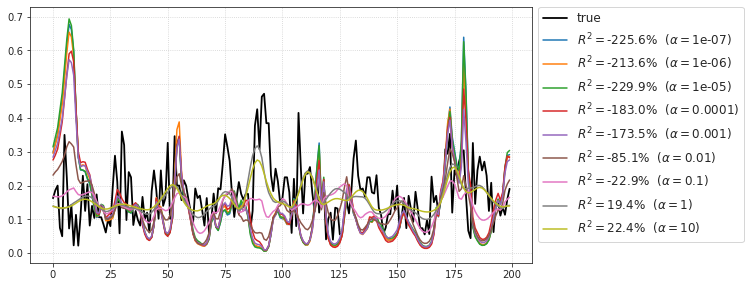

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.102862 -0.042230 -0.237603 -205.705786
1.000000e-06  0.102457 -0.048612 -0.207144 -189.193092
1.000000e-05  0.106799 -0.049605 -0.238146 -201.784280
1.000000e-04  0.104385 -0.034117 -0.217146 -232.469199
1.000000e-03  0.103433 -0.011467 -0.208802 -122.324431
1.000000e-02  0.085691  0.025266 -0.136582  -61.870992
1.000000e-01  0.068370  0.025700  0.051894  -14.472304
1.000000e+00  0.054407  0.014853  0.259444   -4.569515
1.000000e+01  0.050646  0.011214  0.274728   -6.911109

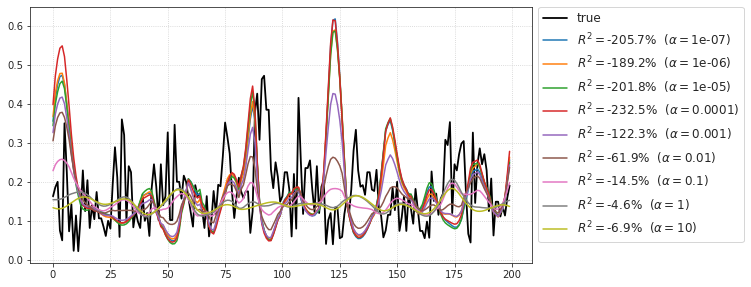

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (3, 3)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.104968 -0.089180 -0.405084 -284.798318
1.000000e-06  0.105598 -0.068065 -0.371729 -347.681936
1.000000e-05  0.112418 -0.096379 -0.386353 -306.137231
1.000000e-04  0.119038 -0.040546 -0.378756 -318.415540
1.000000e-03  0.112833 -0.027032 -0.381435 -192.407604
1.000000e-02  0.113274  0.034570 -0.280392  -63.151545
1.000000e-01  0.098652  0.038751 -0.168909  -23.577600
1.000000e+00  0.073846  0.019964  0.107581   -8.695159
1.000000e+01  0.060265  0.009643  0.343543   -8.239675

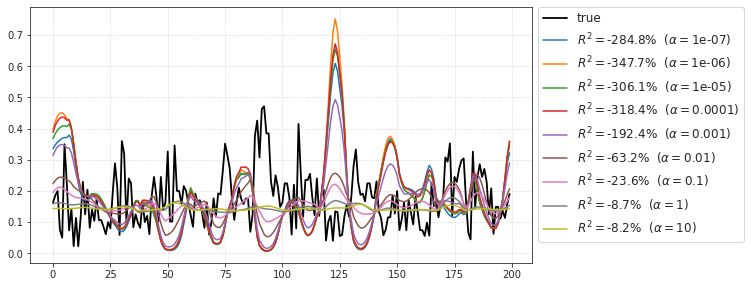

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (3, 2)

r      nnll     r_tst       r2_tst
alpha                                                  
1.000000e-07  0.129771 -0.017702 -0.237943 -4490.709622
1.000000e-06  0.129324 -0.015624 -0.253346 -3895.506608
1.000000e-05  0.116075 -0.040857 -0.246544 -4075.959040
1.000000e-04  0.133377 -0.021432 -0.250342 -3460.249977
1.000000e-03  0.132701  0.000300 -0.260398 -2141.524202
1.000000e-02  0.125884  0.043246 -0.282771  -432.424172
1.000000e-01  0.102711  0.042819 -0.252818   -54.002995
1.000000e+00  0.089383  0.028837  0.242252     0.497531
1.000000e+01  0.070909  0.016296  0.483480    12.002011

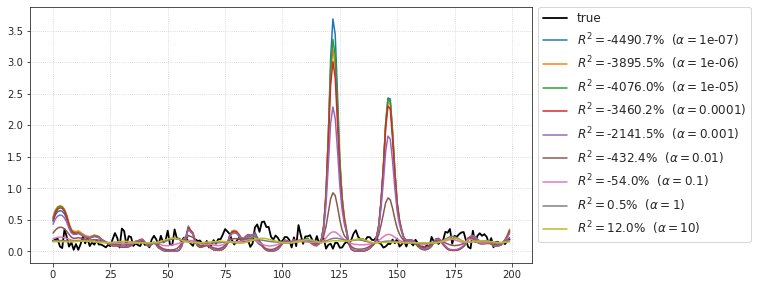

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu088, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.059036 -0.097222  0.186072 -34.919491
1.000000e-06  0.055264 -0.102179  0.152853 -28.677340
1.000000e-05  0.053843 -0.099657  0.159917 -29.649622
1.000000e-04  0.055327 -0.090933  0.175322 -26.350965
1.000000e-03  0.066036 -0.049259  0.124961 -31.155404
1.000000e-02  0.052963 -0.019980  0.215702 -10.252441
1.000000e-01  0.050394  0.007407  0.253634  -6.612221
1.000000e+00  0.042701  0.008429  0.230299  -7.922275
1.000000e+01  0.034923  0.004808  0.112702 -11.818526

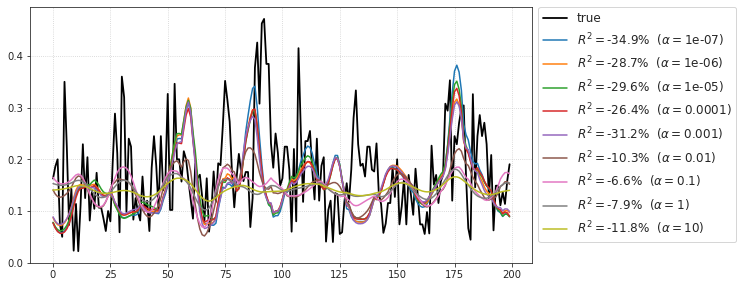

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu088, neuron # 0;  best alpha = 10, best_r = 0.519

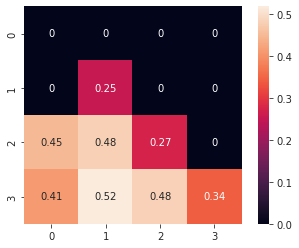

[PROGRESS] 'YUWEI-clu088.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


[PROGRESS] features extracted

100%|██████████| 50826/50826 [01:07<00:00, 757.41it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

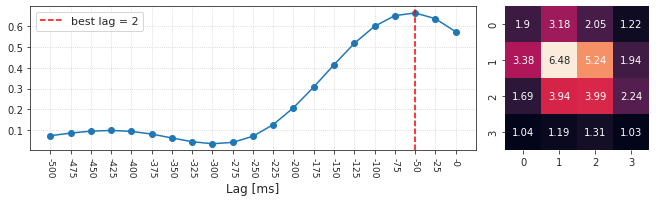

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.169599  0.053664  0.520427  16.249879
1.000000e-06  0.167877  0.053148  0.507715  13.641207
1.000000e-05  0.168083  0.051602  0.503656  12.866725
1.000000e-04  0.171394  0.054762  0.507459  13.719790
1.000000e-03  0.172659  0.056372  0.519495  17.416814
1.000000e-02  0.171135  0.056558  0.542436  20.562942
1.000000e-01  0.165813  0.052933  0.575626  21.027190
1.000000e+00  0.153337  0.046070  0.597390  17.715196
1.000000e+01  0.135672  0.036791  0.606461  10.303940

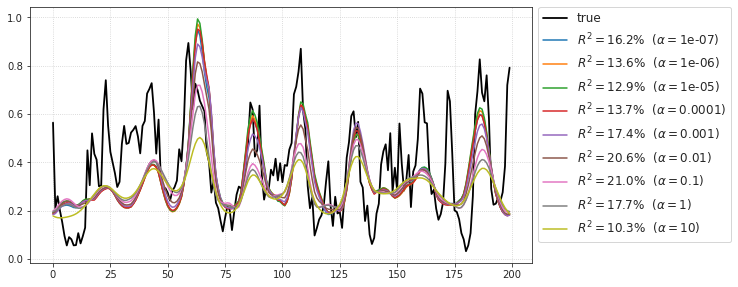

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.168810  0.054372  0.525659   7.378059
1.000000e-06  0.166069  0.053447  0.515331   6.056903
1.000000e-05  0.169192  0.055360  0.522653   8.393709
1.000000e-04  0.168331  0.053156  0.531213  10.179746
1.000000e-03  0.169426  0.056436  0.529587   9.756407
1.000000e-02  0.167284  0.055293  0.558676  10.857347
1.000000e-01  0.154031  0.047818  0.558493   3.273917
1.000000e+00  0.133621  0.037388  0.465558  -7.331937
1.000000e+01  0.118336  0.029909  0.342176 -14.810383

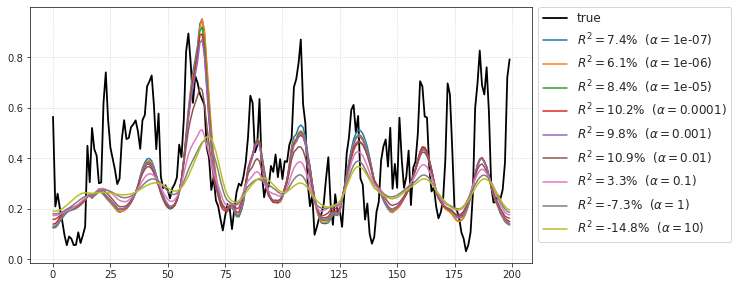

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.162875  0.054494  0.463607  11.923539
1.000000e-06  0.162370  0.053360  0.451403  10.916485
1.000000e-05  0.163023  0.054594  0.442682  10.120557
1.000000e-04  0.162600  0.053858  0.466154  12.485211
1.000000e-03  0.163377  0.055921  0.444877  10.402385
1.000000e-02  0.166423  0.056424  0.462645  11.361149
1.000000e-01  0.155369  0.049317  0.458640   5.620398
1.000000e+00  0.135470  0.038668  0.456356  -5.050970
1.000000e+01  0.117111  0.027448  0.304019 -18.837820

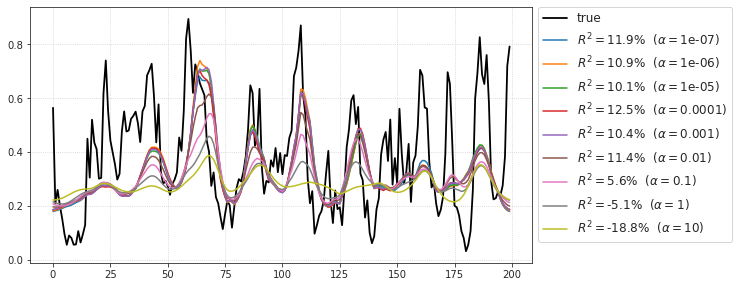

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.166688  0.050856  0.630813  27.230400
1.000000e-06  0.165475  0.050695  0.642290  27.406524
1.000000e-05  0.164945  0.050150  0.642061  27.795729
1.000000e-04  0.164474  0.049845  0.635132  26.798501
1.000000e-03  0.165653  0.050933  0.638395  26.929510
1.000000e-02  0.165402  0.052277  0.659548  22.576205
1.000000e-01  0.155722  0.047520  0.669135  11.499842
1.000000e+00  0.138049  0.038370  0.651941   1.766411
1.000000e+01  0.120659  0.028984  0.574883  -5.445013

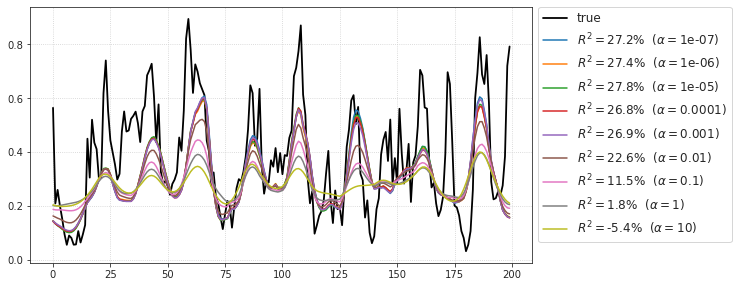

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (1, 0)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.156552  0.047466  0.549196  15.221924
1.000000e-06  0.157641  0.048370  0.533494   9.696556
1.000000e-05  0.158453  0.048909  0.556297  19.358100
1.000000e-04  0.158325  0.048998  0.558262  16.632353
1.000000e-03  0.156823  0.048370  0.565718  21.805559
1.000000e-02  0.157221  0.049462  0.583759  27.292757
1.000000e-01  0.150961  0.045496  0.578945  22.192720
1.000000e+00  0.143129  0.039887  0.600301  23.371070
1.000000e+01  0.123609  0.027520  0.605918  19.018825

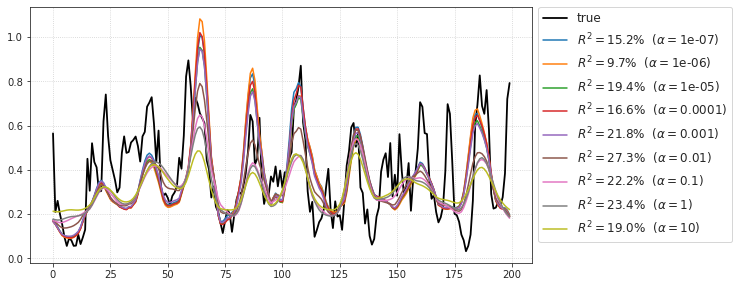

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (0, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.158227  0.048869  0.561572  21.144806
1.000000e-06  0.159226  0.049509  0.515580  12.337222
1.000000e-05  0.157255  0.048721  0.513241  13.401872
1.000000e-04  0.158326  0.049236  0.509089  11.757159
1.000000e-03  0.159750  0.050387  0.528378  17.833941
1.000000e-02  0.164537  0.054473  0.480942  12.812628
1.000000e-01  0.159045  0.050327  0.503261  18.698750
1.000000e+00  0.142143  0.040614  0.513223  19.209551
1.000000e+01  0.112472  0.025354  0.447960  10.631155

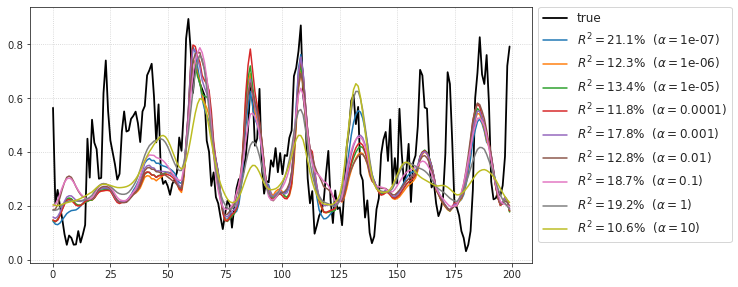

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.149355  0.050518  0.449538   7.800887
1.000000e-06  0.149374  0.050532  0.452143   6.623595
1.000000e-05  0.148831  0.050475  0.461196   8.050123
1.000000e-04  0.148968  0.050445  0.459458   6.806146
1.000000e-03  0.149980  0.051375  0.438334   5.701988
1.000000e-02  0.157178  0.053577  0.405439  -0.552504
1.000000e-01  0.155025  0.047495  0.403640  -8.093912
1.000000e+00  0.139286  0.033144  0.275256 -17.572322
1.000000e+01  0.106570  0.014933 -0.001417 -23.616402

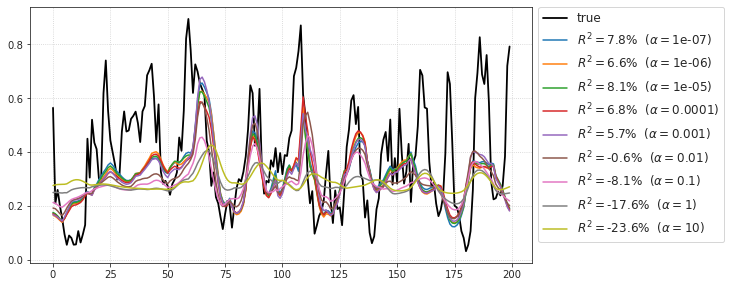

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu089, neuron # 0; pix: (i, j) = (0, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.164849  0.052391  0.396843 -10.292201
1.000000e-06  0.165455  0.052243  0.430266  -7.498363
1.000000e-05  0.164933  0.051965  0.407476  -8.339897
1.000000e-04  0.166763  0.053581  0.427903  -5.292832
1.000000e-03  0.166870  0.054527  0.411500  -7.899454
1.000000e-02  0.161946  0.052273  0.473868   7.669529
1.000000e-01  0.145202  0.041911  0.492660   1.669186
1.000000e+00  0.124943  0.030770  0.382985  -6.200820
1.000000e+01  0.096656  0.017379  0.290059 -11.023173

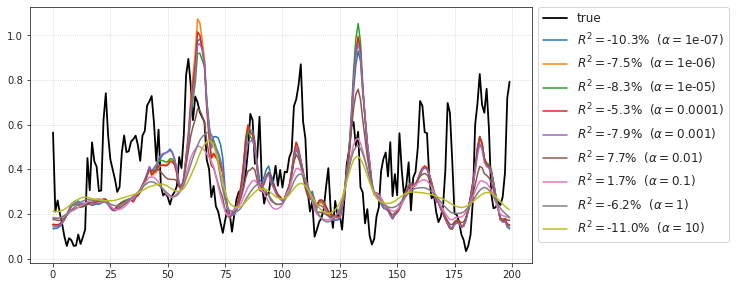

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu089, neuron # 0;  best alpha = 0.1, best_r = 0.669

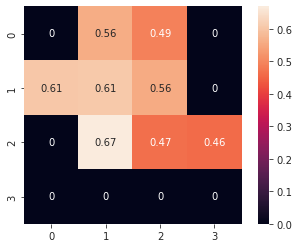

[PROGRESS] 'YUWEI-clu089.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


[PROGRESS] features extracted

100%|██████████| 54385/54385 [01:06<00:00, 822.98it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

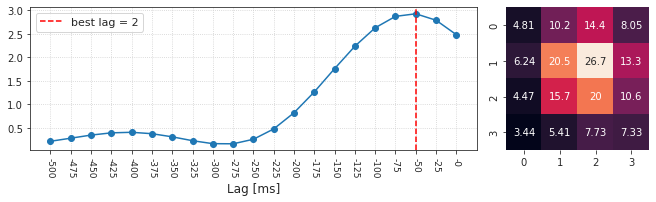

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.334512  0.212083  0.812412  64.100891
1.000000e-06  0.334643  0.212983  0.813850  64.211263
1.000000e-05  0.335965  0.215129  0.807885  64.177635
1.000000e-04  0.333096  0.212264  0.812577  64.209962
1.000000e-03  0.338362  0.214752  0.817784  65.225312
1.000000e-02  0.341224  0.217631  0.836633  67.142765
1.000000e-01  0.324916  0.198952  0.848571  63.120315
1.000000e+00  0.293672  0.167568  0.831987  50.891394
1.000000e+01  0.260145  0.140894  0.821443  40.034444

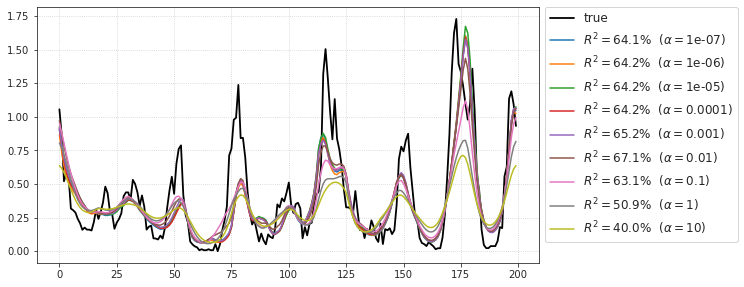

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.336656  0.212077  0.684114  44.419156
1.000000e-06  0.336090  0.212422  0.669100  41.061186
1.000000e-05  0.336060  0.211805  0.633752  32.719179
1.000000e-04  0.335918  0.211948  0.692166  46.491151
1.000000e-03  0.336993  0.214861  0.655598  38.804371
1.000000e-02  0.339111  0.215668  0.693174  47.970177
1.000000e-01  0.323870  0.197130  0.741830  44.867647
1.000000e+00  0.288330  0.162299  0.746556  34.063639
1.000000e+01  0.237915  0.121757  0.645873  25.743332

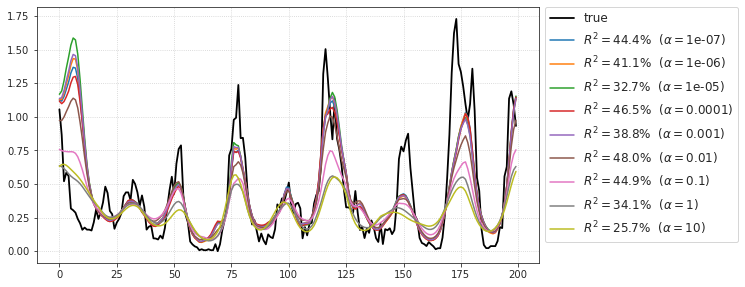

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.332102  0.204117  0.843029  66.742178
1.000000e-06  0.331932  0.205282  0.852445  68.184966
1.000000e-05  0.330430  0.203272  0.833016  65.671791
1.000000e-04  0.332664  0.206713  0.828341  67.030225
1.000000e-03  0.333509  0.206894  0.838194  66.919020
1.000000e-02  0.331260  0.207588  0.839475  63.125018
1.000000e-01  0.315073  0.190651  0.826022  53.466954
1.000000e+00  0.277859  0.155703  0.790546  38.291835
1.000000e+01  0.231025  0.113474  0.664193  24.471348

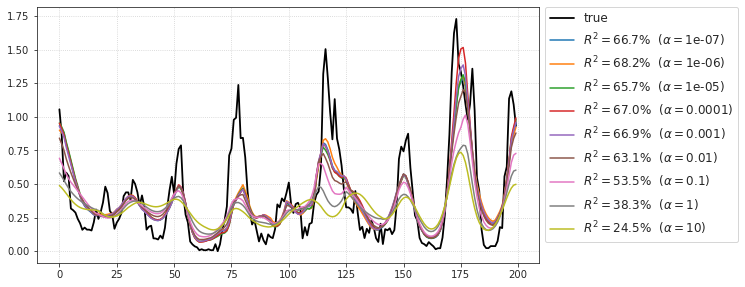

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.330313  0.208173  0.753368  51.059284
1.000000e-06  0.331164  0.209477  0.773299  53.020733
1.000000e-05  0.331074  0.209871  0.762797  52.420187
1.000000e-04  0.329677  0.208675  0.729907  50.543853
1.000000e-03  0.333098  0.212731  0.765965  53.319060
1.000000e-02  0.330118  0.208769  0.802457  48.785917
1.000000e-01  0.305784  0.183465  0.821506  40.099609
1.000000e+00  0.259923  0.142173  0.754536  28.405120
1.000000e+01  0.212778  0.097887  0.572607  17.623558

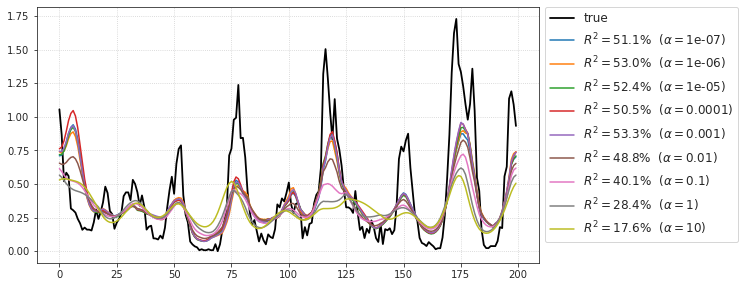

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (0, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.328140  0.204005  0.617510  29.850854
1.000000e-06  0.324853  0.200303  0.597571  22.532985
1.000000e-05  0.326268  0.201878  0.600425  29.921257
1.000000e-04  0.325000  0.201945  0.610394  31.656105
1.000000e-03  0.326886  0.203120  0.671225  43.599498
1.000000e-02  0.323073  0.201749  0.711584  48.627918
1.000000e-01  0.299969  0.182018  0.786470  54.431045
1.000000e+00  0.271095  0.147228  0.725938  45.528542
1.000000e+01  0.221355  0.093976  0.675133  30.893930

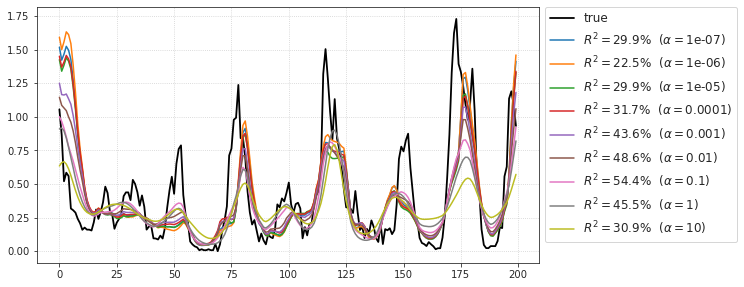

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.329941  0.209303  0.762726  57.063728
1.000000e-06  0.329261  0.208006  0.767701  57.632808
1.000000e-05  0.327531  0.207524  0.765916  57.253202
1.000000e-04  0.329232  0.207781  0.742351  53.691629
1.000000e-03  0.328856  0.207863  0.772246  58.865377
1.000000e-02  0.326467  0.206161  0.793670  62.395778
1.000000e-01  0.302548  0.183380  0.815383  62.241870
1.000000e+00  0.260049  0.141867  0.793302  50.659226
1.000000e+01  0.202812  0.082183  0.730806  28.100149

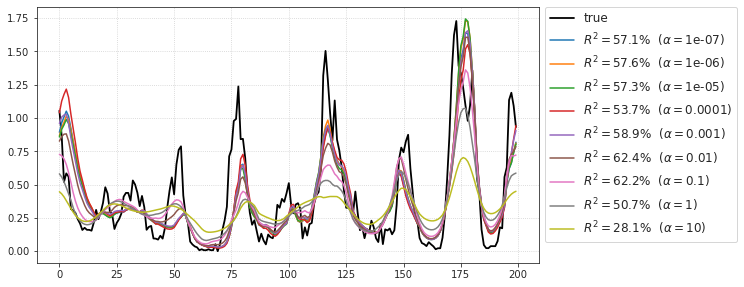

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.324143  0.199850  0.816242  61.574145
1.000000e-06  0.326113  0.201056  0.824658  59.665301
1.000000e-05  0.325987  0.200995  0.807827  57.415094
1.000000e-04  0.327200  0.203717  0.817672  59.398944
1.000000e-03  0.326026  0.203302  0.825136  59.269305
1.000000e-02  0.318443  0.197050  0.833757  59.025743
1.000000e-01  0.290235  0.172076  0.791949  53.411996
1.000000e+00  0.254180  0.132761  0.647426  37.989601
1.000000e+01  0.204248  0.074376  0.505207  18.163574

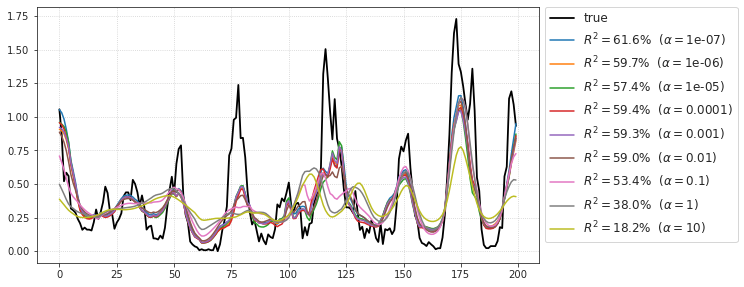

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (0, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.323856  0.198673  0.679501  46.034369
1.000000e-06  0.323670  0.198989  0.685580  46.826633
1.000000e-05  0.324253  0.199737  0.685120  46.917341
1.000000e-04  0.323187  0.198628  0.709935  50.389368
1.000000e-03  0.325703  0.200179  0.718584  50.413522
1.000000e-02  0.325736  0.202347  0.744317  50.864737
1.000000e-01  0.306454  0.183030  0.764867  41.903620
1.000000e+00  0.263453  0.140310  0.631159  31.289468
1.000000e+01  0.211214  0.084417  0.500965  19.808145

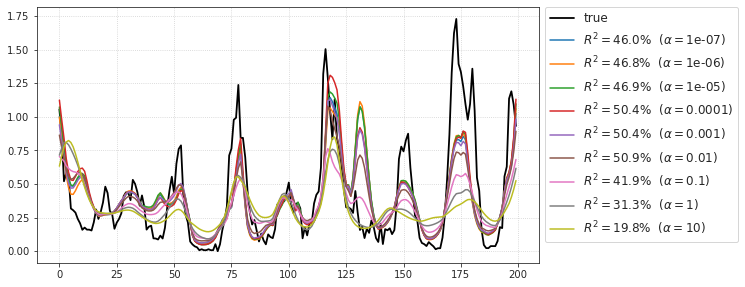

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu090, neuron # 0;  best alpha = 1e-06, best_r = 0.852

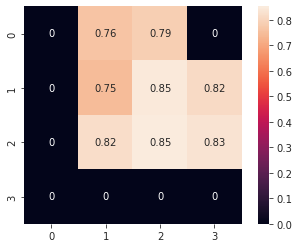

[PROGRESS] 'YUWEI-clu090.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


[PROGRESS] features extracted

100%|██████████| 48918/48918 [00:58<00:00, 830.07it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

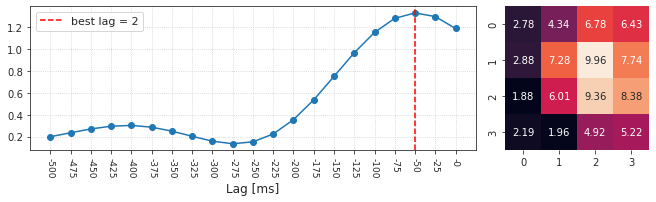

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.200455  0.098173  0.729012  48.211823
1.000000e-06  0.199993  0.098598  0.728722  50.137055
1.000000e-05  0.201522  0.100612  0.716339  44.834229
1.000000e-04  0.197885  0.096517  0.746237  53.619124
1.000000e-03  0.201357  0.100652  0.746182  54.447881
1.000000e-02  0.201564  0.102570  0.753034  56.550869
1.000000e-01  0.186212  0.088163  0.753216  53.905299
1.000000e+00  0.148913  0.058309  0.777558  42.239007
1.000000e+01  0.111753  0.035078  0.794956  32.084280

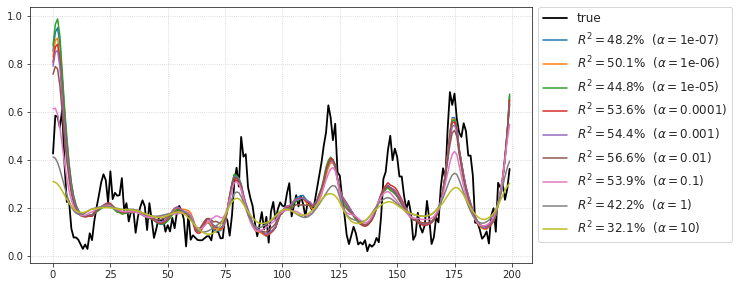

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.178804  0.077375  0.736557  54.005211
1.000000e-06  0.178954  0.077578  0.740012  54.340587
1.000000e-05  0.178140  0.079155  0.748775  55.716060
1.000000e-04  0.180141  0.080598  0.751084  55.923666
1.000000e-03  0.178326  0.080604  0.762769  57.004507
1.000000e-02  0.175878  0.083088  0.762902  54.604653
1.000000e-01  0.159309  0.071177  0.724042  43.174315
1.000000e+00  0.135754  0.052945  0.616066  26.917204
1.000000e+01  0.113029  0.039062  0.458689  12.865796

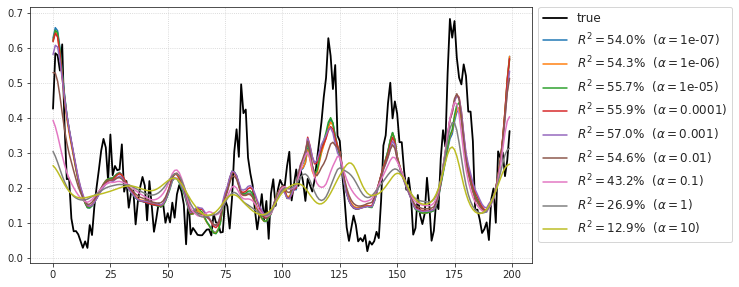

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.187607  0.088497  0.754195  56.773991
1.000000e-06  0.188942  0.091000  0.785823  61.171039
1.000000e-05  0.188170  0.092043  0.786733  60.955191
1.000000e-04  0.185878  0.090554  0.747987  54.967562
1.000000e-03  0.189391  0.093433  0.750949  56.330840
1.000000e-02  0.187506  0.094596  0.776988  57.505471
1.000000e-01  0.168577  0.079719  0.710586  45.283162
1.000000e+00  0.138062  0.057127  0.549906  28.127624
1.000000e+01  0.112164  0.038706  0.430184  15.713829

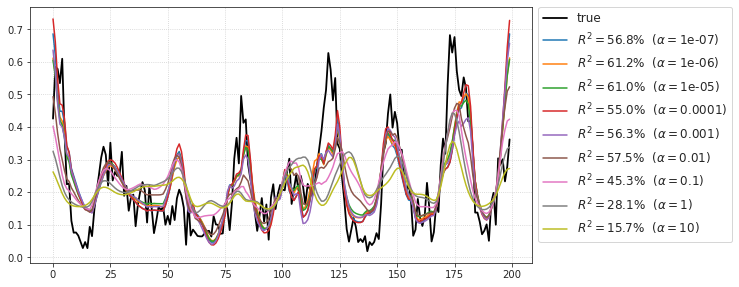

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (1, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.201118  0.091563  0.748972  46.183687
1.000000e-06  0.202027  0.092657  0.759097  50.306145
1.000000e-05  0.201610  0.093319  0.748319  49.783458
1.000000e-04  0.201967  0.092275  0.768576  51.293223
1.000000e-03  0.203774  0.095971  0.774490  56.575223
1.000000e-02  0.197975  0.094460  0.813556  64.445439
1.000000e-01  0.176571  0.077431  0.837875  68.034776
1.000000e+00  0.141870  0.055746  0.840104  54.132418
1.000000e+01  0.104285  0.035220  0.822122  33.642601

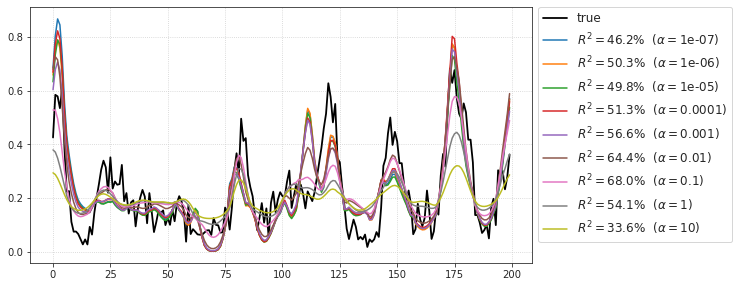

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.175470  0.073555  0.567454  26.265169
1.000000e-06  0.171675  0.065524  0.573979  22.669552
1.000000e-05  0.172655  0.069682  0.572239  24.381053
1.000000e-04  0.171521  0.069738  0.561652  21.156884
1.000000e-03  0.173660  0.073687  0.567494  24.364214
1.000000e-02  0.163974  0.067890  0.591728  32.576953
1.000000e-01  0.141242  0.051048  0.606145  32.477464
1.000000e+00  0.115716  0.036462  0.573333  19.847841
1.000000e+01  0.100112  0.028830  0.489333  14.407533

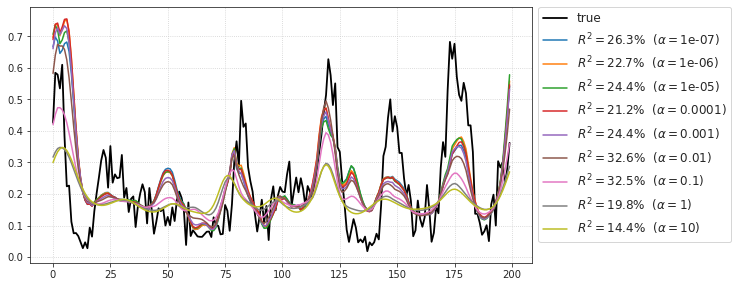

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (0, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.188273  0.081938  0.639621  17.669321
1.000000e-06  0.188965  0.084520  0.649397  19.833562
1.000000e-05  0.188147  0.082541  0.647848  28.964497
1.000000e-04  0.188888  0.083379  0.635858  18.197924
1.000000e-03  0.188751  0.086089  0.643599  26.740460
1.000000e-02  0.181121  0.083866  0.733755  50.080786
1.000000e-01  0.162948  0.068991  0.788695  52.453879
1.000000e+00  0.128970  0.045637  0.778376  48.434505
1.000000e+01  0.101077  0.028978  0.745862  36.103239

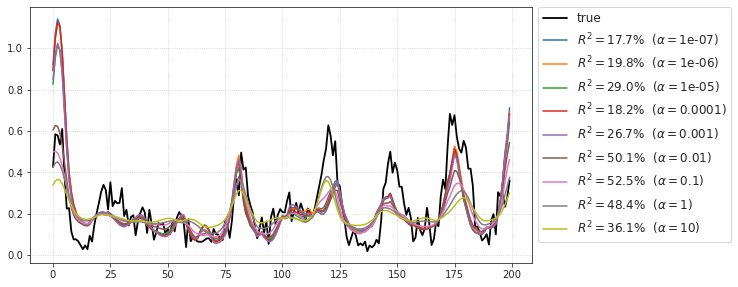

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (0, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.194351  0.089639  0.822046  64.981039
1.000000e-06  0.192010  0.085823  0.823457  66.358783
1.000000e-05  0.194107  0.086327  0.824157  66.283131
1.000000e-04  0.193485  0.090560  0.823533  66.509097
1.000000e-03  0.195101  0.090455  0.832285  66.199222
1.000000e-02  0.183697  0.084300  0.855575  60.301348
1.000000e-01  0.161801  0.068757  0.867321  43.775452
1.000000e+00  0.133844  0.051365  0.859959  28.444019
1.000000e+01  0.104343  0.031784  0.835505   7.215916

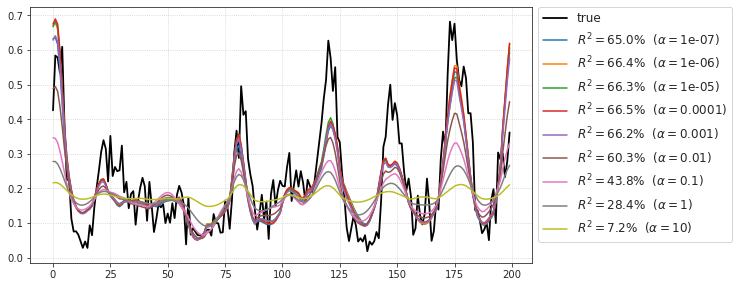

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu095, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.164177  0.066439  0.537095  24.498021
1.000000e-06  0.164779  0.067057  0.547444  26.200890
1.000000e-05  0.163785  0.069538  0.564181  28.706860
1.000000e-04  0.164446  0.068667  0.550006  27.964463
1.000000e-03  0.162550  0.067405  0.557327  29.331667
1.000000e-02  0.162035  0.070998  0.580224  30.098360
1.000000e-01  0.147044  0.056740  0.605105  18.572123
1.000000e+00  0.124664  0.042364  0.491727   8.640068
1.000000e+01  0.111622  0.033913  0.255818   0.688234

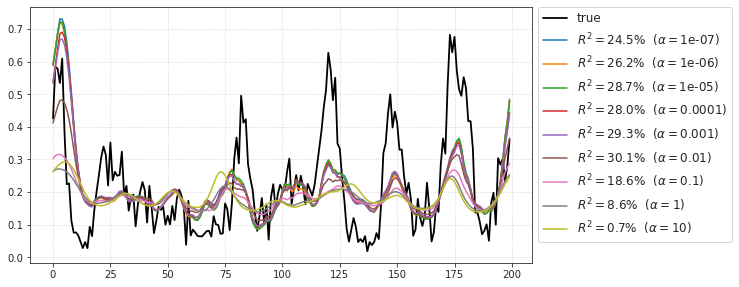

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu095, neuron # 0;  best alpha = 0.1, best_r = 0.867

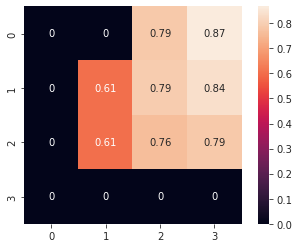

[PROGRESS] 'YUWEI-clu095.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


[PROGRESS] features extracted

100%|██████████| 24279/24279 [00:28<00:00, 864.49it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

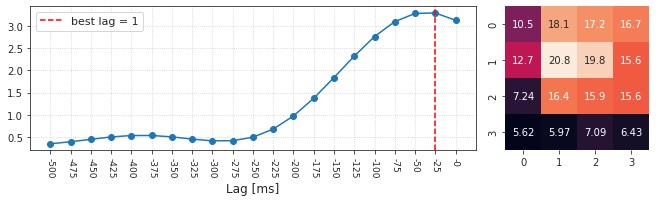

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.255742  0.250239  0.438808 -30.168583
1.000000e-06  0.249821  0.254199  0.411806 -56.233419
1.000000e-05  0.256256  0.241322  0.422150 -47.822708
1.000000e-04  0.259753  0.254024  0.410674 -80.870256
1.000000e-03  0.255878  0.255068  0.428939 -35.160000
1.000000e-02  0.245364  0.247193  0.457077 -21.468732
1.000000e-01  0.203738  0.190129  0.522400 -29.469129
1.000000e+00  0.159972  0.128691  0.535965 -50.677222
1.000000e+01  0.133780  0.093127  0.531471 -59.585838

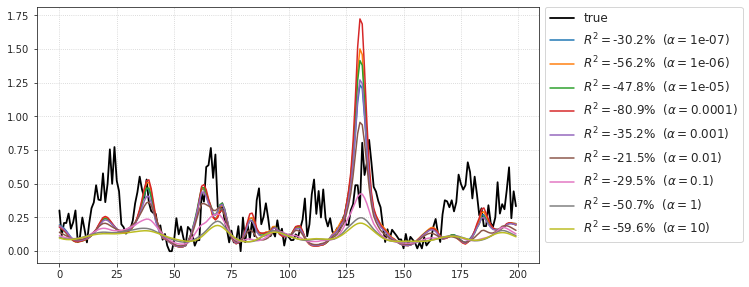

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.274482  0.296091  0.391372 -28.252530
1.000000e-06  0.270775  0.289867  0.373840 -30.206012
1.000000e-05  0.276104  0.293336  0.381780 -28.905879
1.000000e-04  0.276261  0.292264  0.401949 -24.932123
1.000000e-03  0.280782  0.305259  0.401480 -24.861514
1.000000e-02  0.282497  0.309476  0.438108 -22.375429
1.000000e-01  0.265329  0.273083  0.465064 -27.417247
1.000000e+00  0.213032  0.193450  0.471053 -38.330593
1.000000e+01  0.169274  0.130253  0.498850 -50.436177

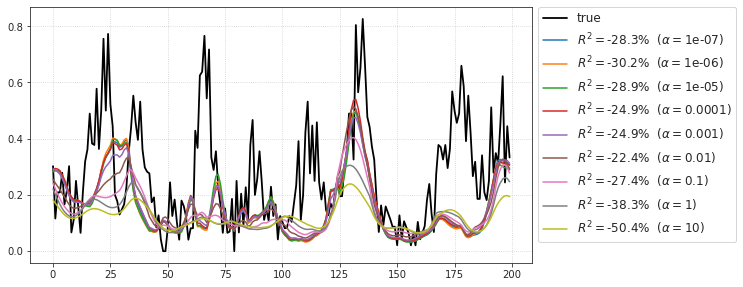

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (0, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.219812  0.207744  0.367759 -34.386400
1.000000e-06  0.222979  0.216754  0.376739 -30.191989
1.000000e-05  0.223138  0.217050  0.369803 -33.265380
1.000000e-04  0.223692  0.216676  0.385483 -27.314358
1.000000e-03  0.225995  0.221045  0.382593 -29.661198
1.000000e-02  0.229399  0.217957  0.375521 -31.577148
1.000000e-01  0.199324  0.171588  0.330421 -35.519228
1.000000e+00  0.167388  0.127282  0.321855 -43.441012
1.000000e+01  0.144122  0.096788  0.339056 -52.351657

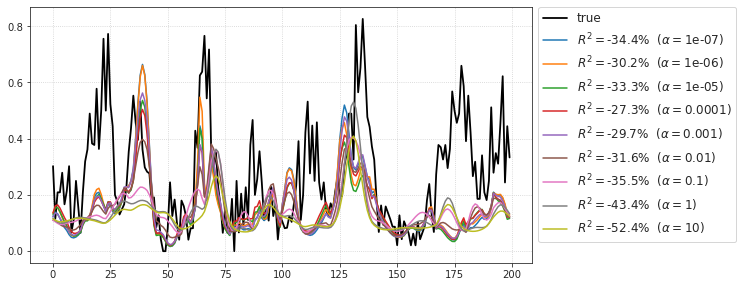

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (0, 2)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.272216  0.266037  0.318759 -168.733220
1.000000e-06  0.274936  0.267111  0.317538 -269.869945
1.000000e-05  0.274023  0.268779  0.315702 -232.568139
1.000000e-04  0.274137  0.271110  0.310935 -414.371710
1.000000e-03  0.279294  0.280393  0.312871 -168.764406
1.000000e-02  0.275249  0.270071  0.330660  -54.177958
1.000000e-01  0.240094  0.212321  0.358689  -39.832363
1.000000e+00  0.181702  0.149506  0.369299  -41.618331
1.000000e+01  0.161864  0.114238  0.365042  -49.348328

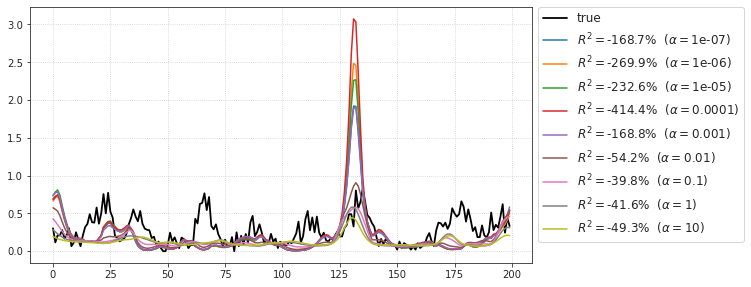

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (0, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.255509  0.240506  0.275459 -54.513232
1.000000e-06  0.256549  0.240766  0.318436 -55.895549
1.000000e-05  0.256053  0.253331  0.320635 -55.710100
1.000000e-04  0.255229  0.243407  0.311375 -52.805605
1.000000e-03  0.259168  0.262465  0.341433 -53.057062
1.000000e-02  0.249795  0.251820  0.397748 -53.803372
1.000000e-01  0.227003  0.203389  0.432157 -62.716331
1.000000e+00  0.181361  0.141336  0.430141 -70.207564
1.000000e+01  0.136907  0.080779  0.394471 -76.499018

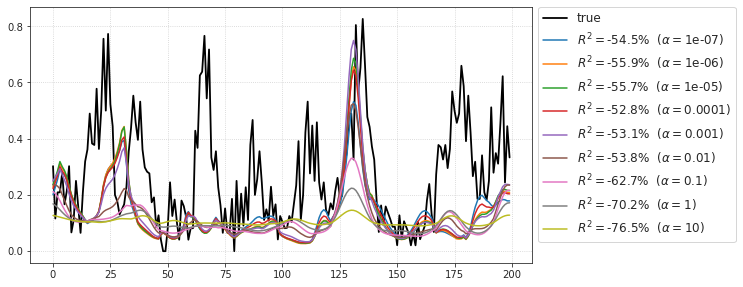

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.174929  0.179118  0.598424 -19.336037
1.000000e-06  0.174206  0.176187  0.595303 -19.510631
1.000000e-05  0.172621  0.178405  0.590223 -19.269408
1.000000e-04  0.171708  0.180114  0.592801 -22.453785
1.000000e-03  0.175099  0.188924  0.593052 -21.607065
1.000000e-02  0.170202  0.173789  0.569610 -39.861455
1.000000e-01  0.152862  0.124925  0.552646 -55.912570
1.000000e+00  0.128563  0.083935  0.468112 -59.620478
1.000000e+01  0.120197  0.068701  0.390607 -62.484810

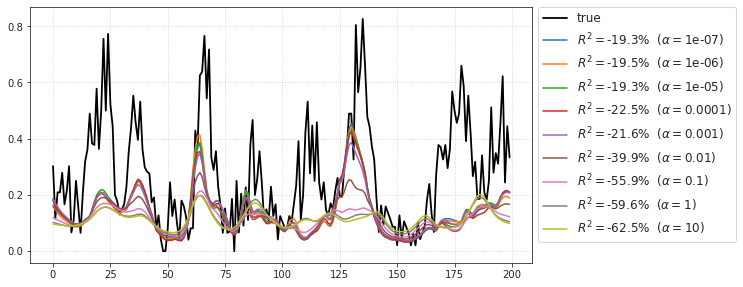

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.243868  0.255443  0.529789 -23.288526
1.000000e-06  0.243081  0.248472  0.522157 -24.769985
1.000000e-05  0.241408  0.247581  0.535586 -23.644737
1.000000e-04  0.239172  0.249504  0.523192 -21.927558
1.000000e-03  0.246217  0.261814  0.549763 -17.392555
1.000000e-02  0.240528  0.255917  0.586598 -14.480977
1.000000e-01  0.213037  0.203637  0.522897 -28.859887
1.000000e+00  0.169384  0.130213  0.441889 -47.588723
1.000000e+01  0.135925  0.084947  0.382699 -57.848231

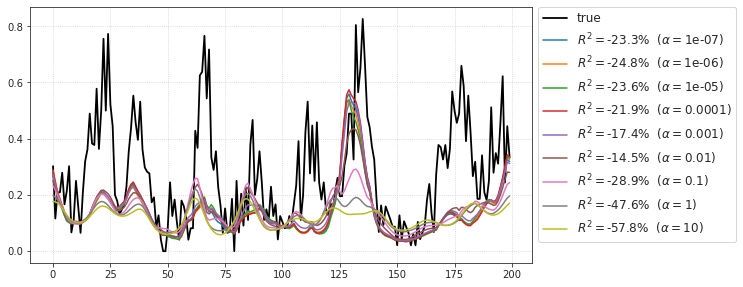

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.235243  0.176337  0.294575 -47.458258
1.000000e-06  0.231033  0.172885  0.293650 -53.918077
1.000000e-05  0.234990  0.172051  0.315368 -45.669745
1.000000e-04  0.233766  0.176058  0.291753 -49.016262
1.000000e-03  0.242398  0.201591  0.335325 -43.764279
1.000000e-02  0.238880  0.212711  0.367075 -23.523671
1.000000e-01  0.218980  0.194354  0.285945 -24.575437
1.000000e+00  0.192748  0.149079  0.268211 -32.765937
1.000000e+01  0.156094  0.094006  0.247182 -49.587701

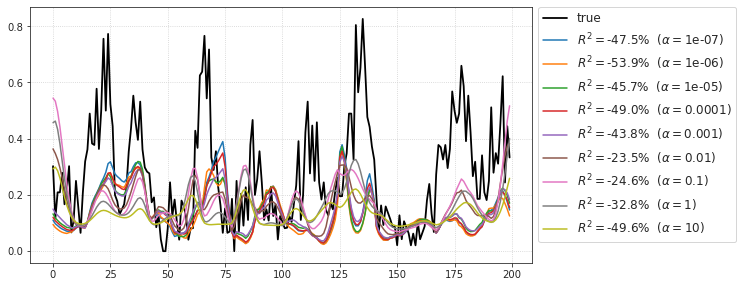

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu096, neuron # 0;  best alpha = 1e-07, best_r = 0.598

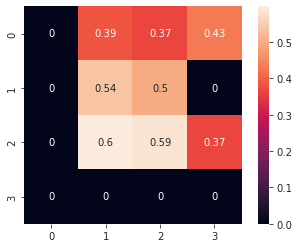

[PROGRESS] 'YUWEI-clu096.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  4.07it/s]


[PROGRESS] features extracted

100%|██████████| 45318/45318 [00:53<00:00, 842.06it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

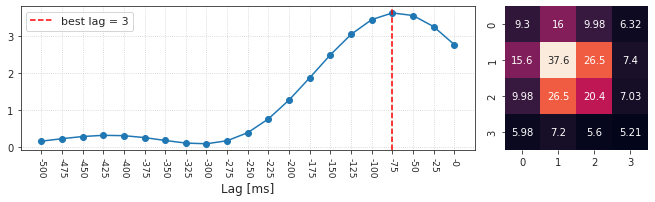

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.458500  0.309279  0.424123 -283.154405
1.000000e-06  0.460269  0.309387  0.416695 -321.907212
1.000000e-05  0.458216  0.308154  0.417284 -289.623320
1.000000e-04  0.457542  0.308350  0.426523 -312.781863
1.000000e-03  0.460016  0.309259  0.417756 -338.887859
1.000000e-02  0.457558  0.306641  0.428511 -260.688593
1.000000e-01  0.441188  0.287260  0.470694 -153.294528
1.000000e+00  0.404825  0.245522  0.521140  -60.521587
1.000000e+01  0.356158  0.203888  0.491725  -47.749756

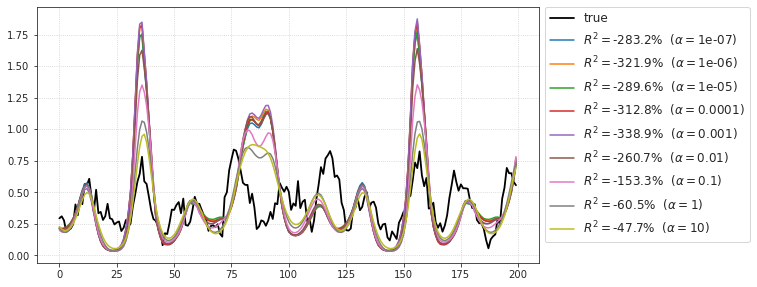

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.434817  0.300352  0.548731 -44.185399
1.000000e-06  0.437735  0.301884  0.536899 -48.199523
1.000000e-05  0.434703  0.300733  0.552611 -40.807890
1.000000e-04  0.437553  0.302751  0.552928 -42.183977
1.000000e-03  0.437148  0.300253  0.533808 -51.491518
1.000000e-02  0.433023  0.296805  0.535815 -41.233378
1.000000e-01  0.411014  0.271960  0.527712 -23.838523
1.000000e+00  0.383121  0.233391  0.542501   2.562085
1.000000e+01  0.331068  0.177350  0.532450  19.521987

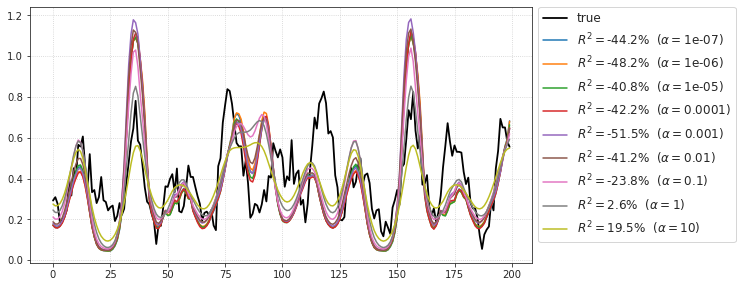

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.436785  0.290537  0.451115 -124.754742
1.000000e-06  0.438479  0.293585  0.443772 -127.873214
1.000000e-05  0.438052  0.292386  0.443170 -120.516061
1.000000e-04  0.438098  0.290827  0.451202 -130.161152
1.000000e-03  0.438579  0.291985  0.446418 -136.743604
1.000000e-02  0.435416  0.290895  0.444175 -124.685563
1.000000e-01  0.410259  0.264798  0.442235  -73.523348
1.000000e+00  0.368775  0.218664  0.446082  -21.195781
1.000000e+01  0.322060  0.168433  0.397327  -16.642127

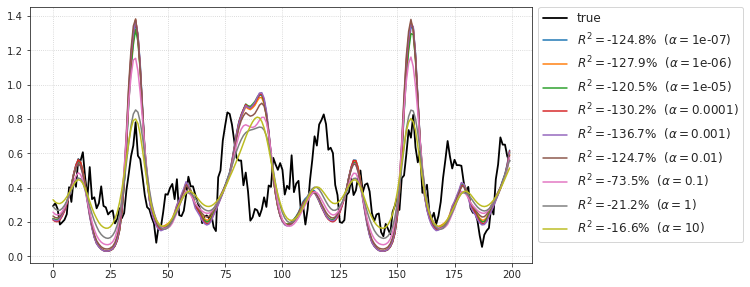

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.436482  0.289560  0.359433 -123.756353
1.000000e-06  0.436806  0.288362  0.350722 -136.703139
1.000000e-05  0.437619  0.290634  0.366384  -92.319799
1.000000e-04  0.438861  0.292054  0.365052 -120.014852
1.000000e-03  0.436492  0.290035  0.359777  -87.641904
1.000000e-02  0.433093  0.285210  0.376844  -90.031022
1.000000e-01  0.410026  0.260454  0.401230  -52.497989
1.000000e+00  0.362351  0.215347  0.427179   -5.418466
1.000000e+01  0.309925  0.155578  0.396897   11.167235

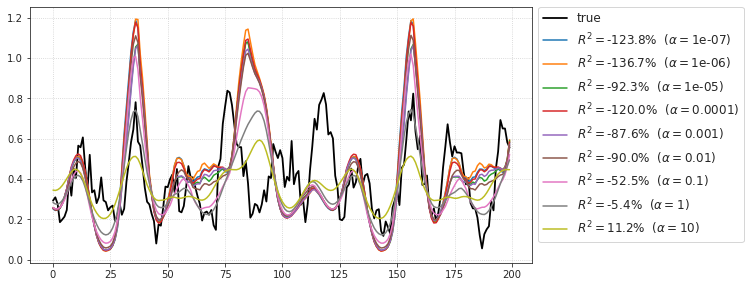

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (0, 1)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.447715  0.296163  0.513042 -220.775432
1.000000e-06  0.447504  0.297174  0.482716 -207.493493
1.000000e-05  0.446503  0.295788  0.502095 -196.269775
1.000000e-04  0.447653  0.296107  0.510148 -193.640808
1.000000e-03  0.446734  0.295627  0.504251 -172.663294
1.000000e-02  0.444037  0.293400  0.507103 -176.471131
1.000000e-01  0.418912  0.268836  0.490660 -161.205424
1.000000e+00  0.375248  0.217577  0.400981 -196.061806
1.000000e+01  0.312663  0.135706  0.339753  -82.361570

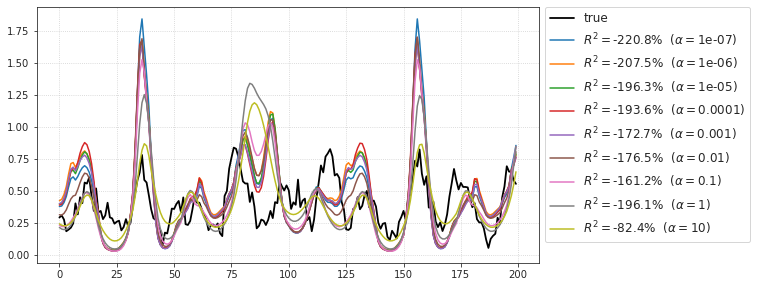

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (1, 0)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.449297  0.298057  0.426947  -34.953482
1.000000e-06  0.447010  0.296069  0.414585  -50.724729
1.000000e-05  0.446740  0.295447  0.452103  -51.302770
1.000000e-04  0.445475  0.294912  0.426358  -45.592185
1.000000e-03  0.449208  0.297813  0.458854  -38.076629
1.000000e-02  0.444705  0.293791  0.367497  -58.291305
1.000000e-01  0.421313  0.272412  0.398541  -98.797717
1.000000e+00  0.380241  0.220785  0.401442 -203.906963
1.000000e+01  0.316462  0.133878  0.381092  -79.270362

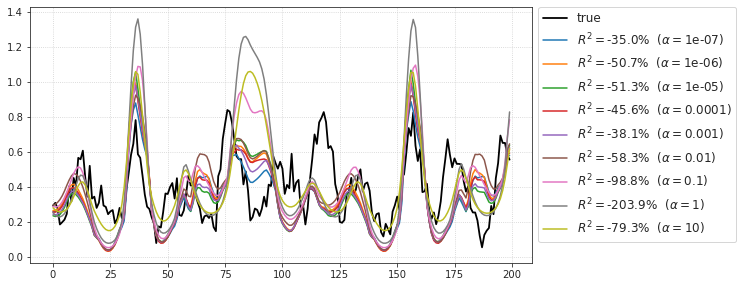

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (2, 0)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.423806  0.277181  0.467003  -11.608413
1.000000e-06  0.423418  0.277279  0.465729  -11.104349
1.000000e-05  0.421710  0.275406  0.463517  -16.174403
1.000000e-04  0.423577  0.277095  0.454908  -20.680607
1.000000e-03  0.422858  0.276372  0.459071  -26.713365
1.000000e-02  0.426210  0.277398  0.441547  -39.480761
1.000000e-01  0.405404  0.253265  0.382293  -91.990193
1.000000e+00  0.358389  0.191976  0.349422 -118.131442
1.000000e+01  0.290861  0.104924  0.347743  -23.134732

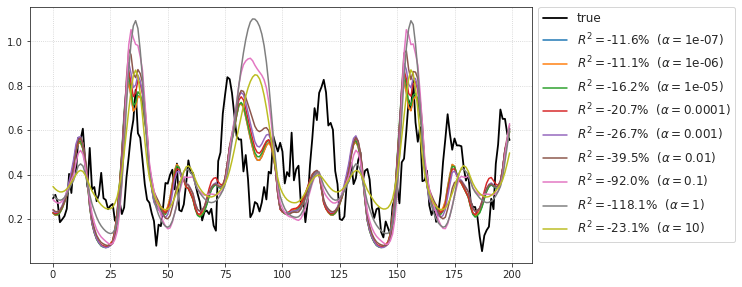

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (0, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.426351  0.286662  0.500940 -87.845410
1.000000e-06  0.426714  0.286590  0.506583 -86.353210
1.000000e-05  0.425901  0.286227  0.497399 -83.942676
1.000000e-04  0.427375  0.286446  0.528681 -81.447508
1.000000e-03  0.428190  0.286090  0.519644 -89.864407
1.000000e-02  0.422537  0.282691  0.537135 -48.311705
1.000000e-01  0.395693  0.256614  0.533759 -18.237836
1.000000e+00  0.353449  0.197411  0.460118 -17.415316
1.000000e+01  0.283152  0.106913  0.421022  11.345601

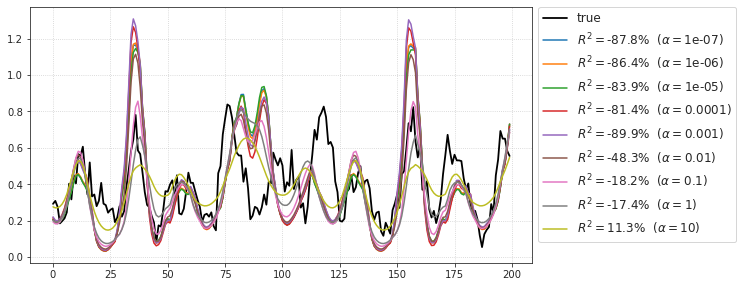

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu099, neuron # 0;  best alpha = 0.0001, best_r = 0.553

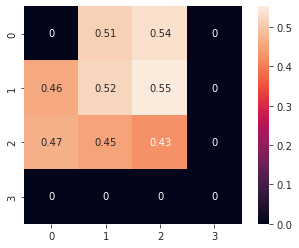

[PROGRESS] 'YUWEI-clu099.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


[PROGRESS] features extracted

100%|██████████| 38585/38585 [00:45<00:00, 852.38it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

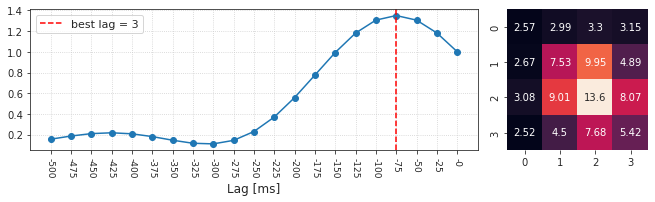

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.406248  0.139583  0.772943   7.691236
1.000000e-06  0.405574  0.138634  0.765142  20.681842
1.000000e-05  0.402139  0.136402  0.766656  24.719002
1.000000e-04  0.405206  0.138149  0.778777  33.757131
1.000000e-03  0.406045  0.139638  0.773650  26.372423
1.000000e-02  0.402986  0.138730  0.774162  32.459980
1.000000e-01  0.381375  0.125898  0.787509  58.130274
1.000000e+00  0.335867  0.101166  0.769995  56.372735
1.000000e+01  0.274072  0.070175  0.758825  40.378865

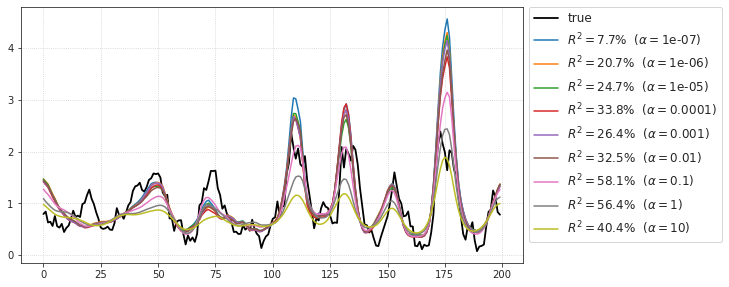

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.393511  0.131965  0.663827  40.606900
1.000000e-06  0.393520  0.131919  0.669902  42.798052
1.000000e-05  0.392601  0.132273  0.680923  44.153840
1.000000e-04  0.390689  0.130555  0.665234  41.753880
1.000000e-03  0.389864  0.129917  0.645936  38.452279
1.000000e-02  0.391358  0.132121  0.670488  42.629981
1.000000e-01  0.380298  0.125705  0.672485  42.466435
1.000000e+00  0.342116  0.103202  0.615993  27.449099
1.000000e+01  0.274812  0.068746  0.473999   5.612444

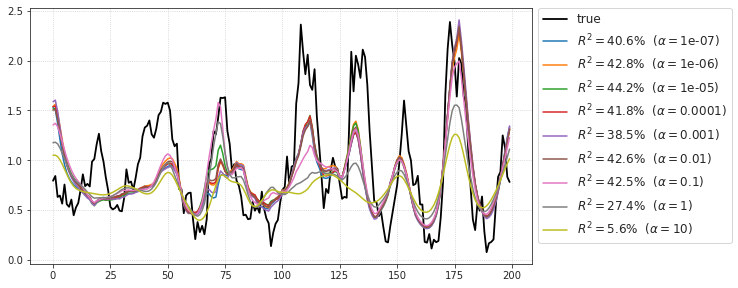

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.386428  0.127620  0.771926  58.580323
1.000000e-06  0.386632  0.127519  0.771549  58.591354
1.000000e-05  0.389475  0.129856  0.763512  57.262992
1.000000e-04  0.387847  0.128131  0.768096  58.175863
1.000000e-03  0.388531  0.128510  0.762740  57.245335
1.000000e-02  0.391868  0.130384  0.769277  58.266119
1.000000e-01  0.371197  0.115712  0.767102  50.675430
1.000000e+00  0.317822  0.087903  0.700952  30.910614
1.000000e+01  0.248008  0.057608  0.591217  14.847426

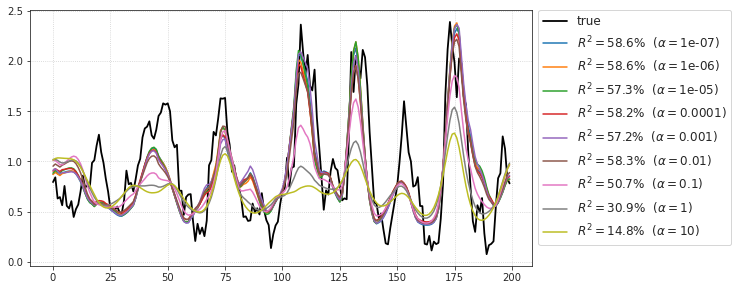

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.387654  0.129417  0.768999  51.485846
1.000000e-06  0.388641  0.130464  0.771213  50.466996
1.000000e-05  0.387325  0.129859  0.773332  51.052470
1.000000e-04  0.386631  0.130187  0.763350  49.182305
1.000000e-03  0.388883  0.132227  0.780495  52.702561
1.000000e-02  0.386385  0.132248  0.776057  53.537645
1.000000e-01  0.359925  0.118875  0.770345  55.867018
1.000000e+00  0.318725  0.096732  0.750610  53.657911
1.000000e+01  0.261380  0.067540  0.752635  53.460818

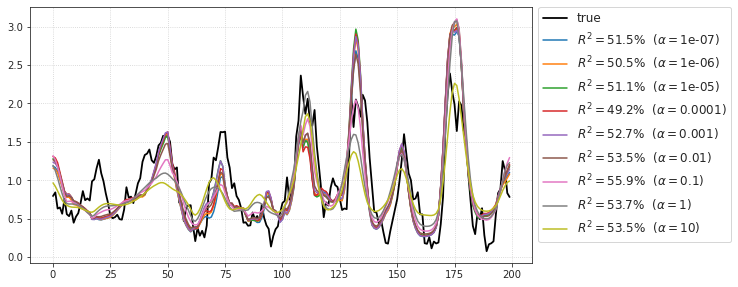

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (3, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.393327  0.128523  0.730048  38.562013
1.000000e-06  0.391472  0.127871  0.731793  38.092568
1.000000e-05  0.389221  0.128895  0.742737  45.865072
1.000000e-04  0.391303  0.128523  0.728043  45.942154
1.000000e-03  0.394594  0.130747  0.740933  44.347069
1.000000e-02  0.390033  0.130322  0.741590  42.999902
1.000000e-01  0.369800  0.119658  0.760864  51.897442
1.000000e+00  0.318381  0.093697  0.786028  61.315394
1.000000e+01  0.260159  0.063072  0.785582  57.831604

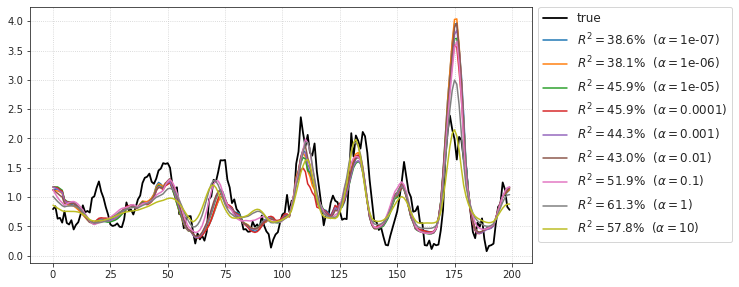

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.406694  0.131599  0.750039  56.255816
1.000000e-06  0.405844  0.129976  0.736526  53.497256
1.000000e-05  0.407254  0.131272  0.727157  52.427753
1.000000e-04  0.408776  0.133390  0.758049  57.219561
1.000000e-03  0.409428  0.132581  0.720425  51.543933
1.000000e-02  0.406337  0.133485  0.716085  51.145173
1.000000e-01  0.381687  0.120845  0.728731  47.684837
1.000000e+00  0.327661  0.092313  0.645722  22.721614
1.000000e+01  0.257544  0.059512  0.306177  -7.004662

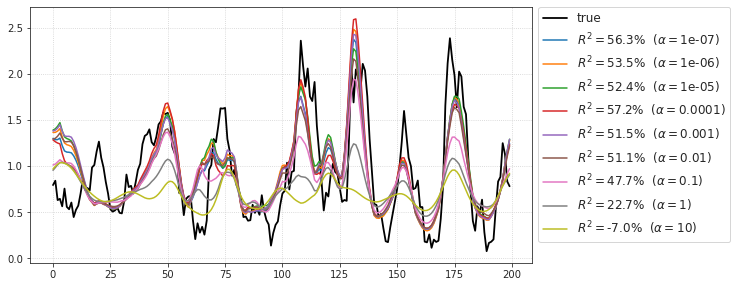

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (3, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.389325  0.130836  0.753877  41.992285
1.000000e-06  0.389332  0.130785  0.754638  42.971121
1.000000e-05  0.391077  0.131786  0.756899  38.528784
1.000000e-04  0.391699  0.133016  0.756663  44.065082
1.000000e-03  0.391599  0.133231  0.754154  46.169714
1.000000e-02  0.381842  0.128496  0.768419  45.073787
1.000000e-01  0.350512  0.110569  0.776294  54.907196
1.000000e+00  0.316064  0.088654  0.777662  58.985005
1.000000e+01  0.264394  0.050657  0.790312  41.231919

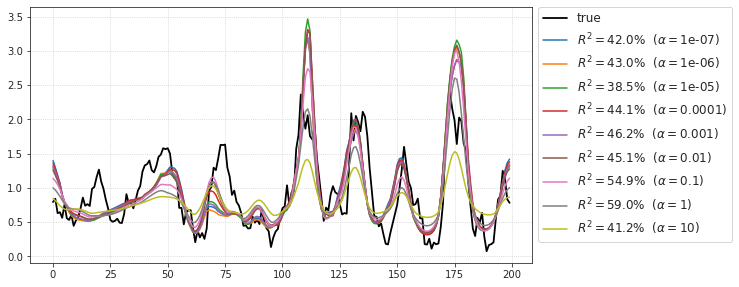

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (1, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.390431  0.125974  0.589445  24.039156
1.000000e-06  0.391980  0.127383  0.579288  24.303218
1.000000e-05  0.388788  0.127759  0.610873  25.492792
1.000000e-04  0.390051  0.127145  0.619948  29.338841
1.000000e-03  0.389284  0.125825  0.575542  19.979774
1.000000e-02  0.388947  0.127152  0.617179  31.129341
1.000000e-01  0.362464  0.113916  0.671488  42.645294
1.000000e+00  0.318783  0.091670  0.629365  34.942995
1.000000e+01  0.262359  0.058653  0.556129  19.338024

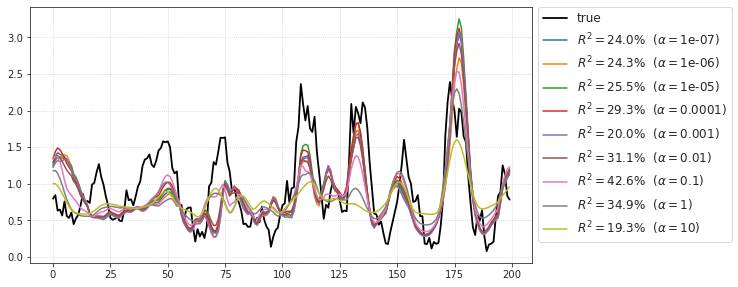

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu104, neuron # 0;  best alpha = 10, best_r = 0.790

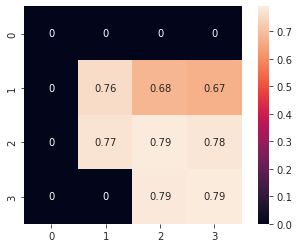

[PROGRESS] 'YUWEI-clu104.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


[PROGRESS] features extracted

100%|██████████| 47848/47848 [04:03<00:00, 196.73it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

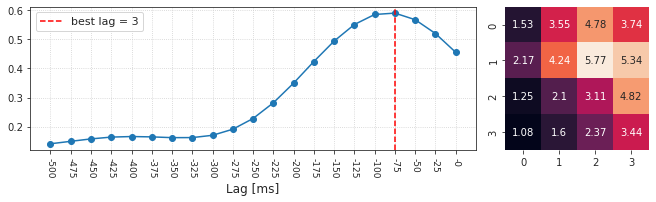

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.238018  0.084383  0.651230  39.181943
1.000000e-06  0.239231  0.086091  0.661970  40.512309
1.000000e-05  0.238659  0.084467  0.640268  38.118012
1.000000e-04  0.240860  0.085126  0.646704  39.415827
1.000000e-03  0.241620  0.086642  0.643481  38.499650
1.000000e-02  0.241622  0.087312  0.649458  37.509493
1.000000e-01  0.226854  0.077207  0.633900  32.380320
1.000000e+00  0.196221  0.057858  0.602879  20.769272
1.000000e+01  0.148507  0.033292  0.627389  12.682159

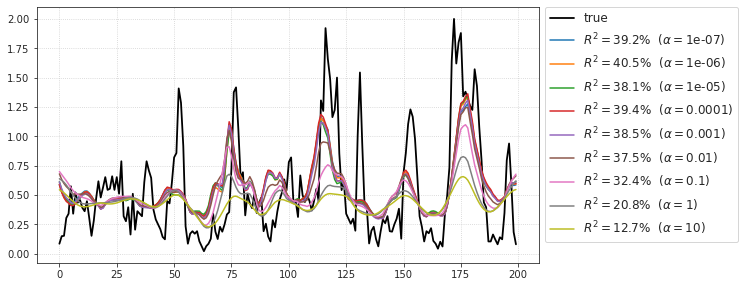

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (1, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.228170  0.077192  0.630993  37.298123
1.000000e-06  0.228159  0.077198  0.601851  34.644712
1.000000e-05  0.228316  0.077367  0.603266  35.223968
1.000000e-04  0.226714  0.077505  0.592755  33.584737
1.000000e-03  0.228564  0.077319  0.604850  34.970397
1.000000e-02  0.225334  0.076562  0.599802  33.886616
1.000000e-01  0.203041  0.063604  0.590174  31.518548
1.000000e+00  0.173604  0.046857  0.547638  25.047377
1.000000e+01  0.145264  0.031926  0.428055  11.332901

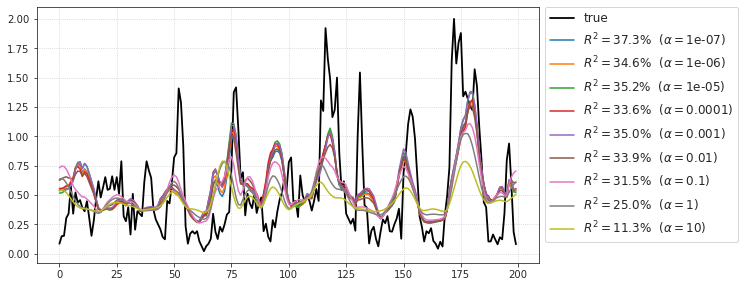

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.233290  0.080312  0.280196   6.202434
1.000000e-06  0.234001  0.079460  0.359730  11.879842
1.000000e-05  0.233829  0.079725  0.341551  10.738111
1.000000e-04  0.234847  0.080926  0.324922   9.533612
1.000000e-03  0.232579  0.080971  0.325682   9.556351
1.000000e-02  0.229614  0.081201  0.304532   8.126691
1.000000e-01  0.206247  0.066476  0.363575  11.845310
1.000000e+00  0.163128  0.044243  0.367004  12.974390
1.000000e+01  0.128924  0.028634  0.272531   6.505162

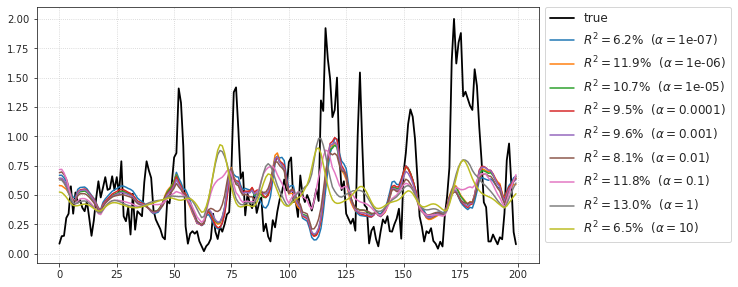

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (0, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.221923  0.079870  0.324999  -0.460291
1.000000e-06  0.222007  0.079381  0.252756 -12.109320
1.000000e-05  0.223017  0.079336  0.225443 -28.597545
1.000000e-04  0.220020  0.077996  0.356355   7.698872
1.000000e-03  0.221378  0.080678  0.320985   0.761830
1.000000e-02  0.218981  0.077787  0.454544  20.588485
1.000000e-01  0.198189  0.063088  0.620934  28.420187
1.000000e+00  0.161965  0.042141  0.561861  18.920140
1.000000e+01  0.135151  0.028549  0.491961  10.204605

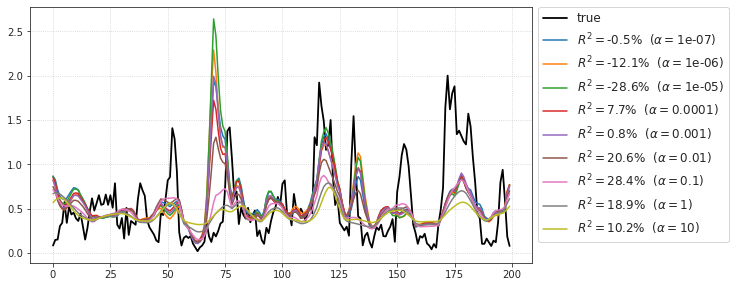

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.232590  0.079517  0.604453  30.857329
1.000000e-06  0.228922  0.077249  0.613918  32.186631
1.000000e-05  0.229023  0.077936  0.611148  31.240371
1.000000e-04  0.229089  0.079358  0.628197  30.935120
1.000000e-03  0.231968  0.080526  0.630842  31.541137
1.000000e-02  0.233250  0.081965  0.631703  31.705465
1.000000e-01  0.216977  0.071353  0.602168  23.179213
1.000000e+00  0.175473  0.046566  0.491093  11.286102
1.000000e+01  0.129515  0.025001  0.436289   4.153189

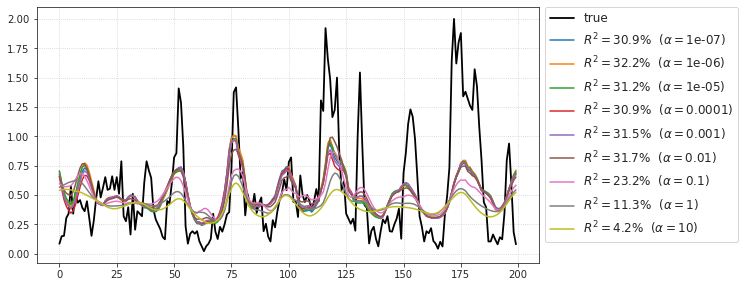

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (0, 3)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.212794  0.068387  0.182202  -93.934428
1.000000e-06  0.213841  0.069910  0.168368 -111.284409
1.000000e-05  0.214765  0.070056  0.172455 -102.533416
1.000000e-04  0.214212  0.069350  0.143561 -127.354159
1.000000e-03  0.216889  0.070977  0.211196  -61.306693
1.000000e-02  0.212860  0.069734  0.280193  -17.324826
1.000000e-01  0.188286  0.054985  0.584296   27.758570
1.000000e+00  0.154236  0.037967  0.631796   18.628045
1.000000e+01  0.127014  0.022614  0.552550    0.828394

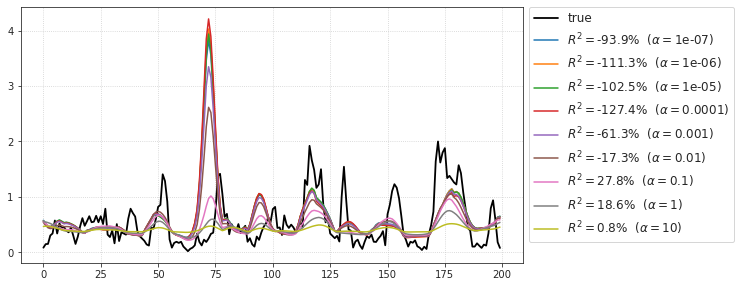

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (0, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.221169  0.069037  0.475428  21.485917
1.000000e-06  0.225247  0.072704  0.493337  23.360630
1.000000e-05  0.224841  0.069706  0.475908  21.512998
1.000000e-04  0.221804  0.070649  0.499412  23.682354
1.000000e-03  0.220779  0.069820  0.513019  25.731110
1.000000e-02  0.216142  0.070049  0.519626  25.235031
1.000000e-01  0.191139  0.056604  0.536448  20.610222
1.000000e+00  0.153559  0.036534  0.433808  12.701123
1.000000e+01  0.133892  0.026018  0.312595   5.898802

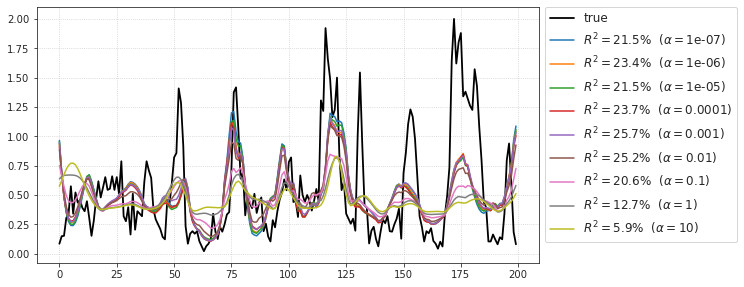

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu107, neuron # 0; pix: (i, j) = (3, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.210775  0.067081  0.229462   4.033778
1.000000e-06  0.210153  0.067823  0.241652   4.677575
1.000000e-05  0.209506  0.066408  0.234530   4.228412
1.000000e-04  0.211208  0.067594  0.203961   1.211315
1.000000e-03  0.210500  0.069009  0.304794   8.615927
1.000000e-02  0.206151  0.067463  0.440090  14.185418
1.000000e-01  0.178063  0.049690  0.554252  18.168705
1.000000e+00  0.138651  0.030714  0.461326  12.199022
1.000000e+01  0.090969  0.012261  0.297302  -0.124231

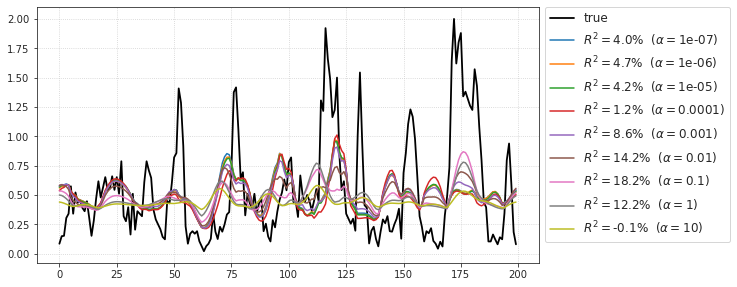

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu107, neuron # 0;  best alpha = 1e-06, best_r = 0.662

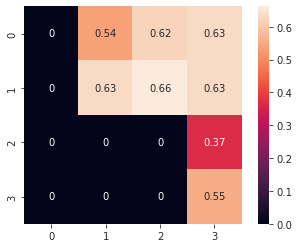

[PROGRESS] 'YUWEI-clu107.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 2/2 [00:00<00:00,  3.21it/s]


[PROGRESS] features extracted

100%|██████████| 53077/53077 [01:04<00:00, 828.10it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

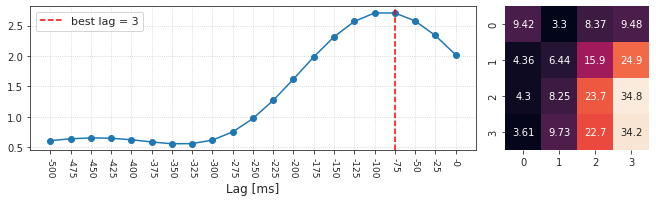

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.406228  0.284666  0.636205   34.593401
1.000000e-06  0.407648  0.285000  0.612492   30.305673
1.000000e-05  0.406441  0.283136  0.616861   29.648090
1.000000e-04  0.406352  0.282917  0.613253   30.021306
1.000000e-03  0.405465  0.281850  0.597824   33.522850
1.000000e-02  0.403389  0.277097  0.525185   23.958755
1.000000e-01  0.382328  0.248292  0.382423    8.913208
1.000000e+00  0.348612  0.208242  0.476500   -7.017478
1.000000e+01  0.290201  0.154106  0.439750 -116.578310

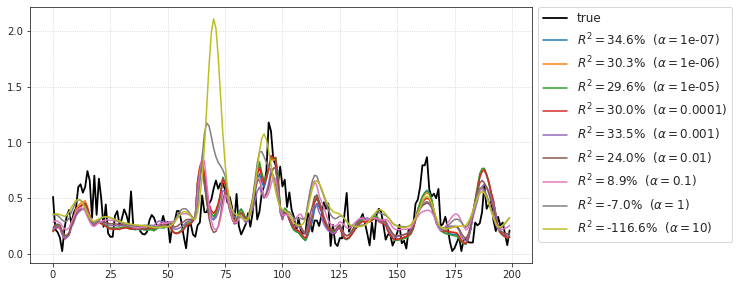

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (3, 3)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.407221  0.284814  0.433687 -378.733723
1.000000e-06  0.406266  0.284671  0.436741 -334.702018
1.000000e-05  0.406657  0.284343  0.389427 -677.558605
1.000000e-04  0.408028  0.283997  0.419265 -379.610586
1.000000e-03  0.410898  0.288148  0.395419 -526.055533
1.000000e-02  0.408803  0.278764  0.450345 -115.460114
1.000000e-01  0.381765  0.244790  0.566540   27.287439
1.000000e+00  0.337339  0.197375  0.600203   33.156297
1.000000e+01  0.281692  0.143432  0.487950   21.922324

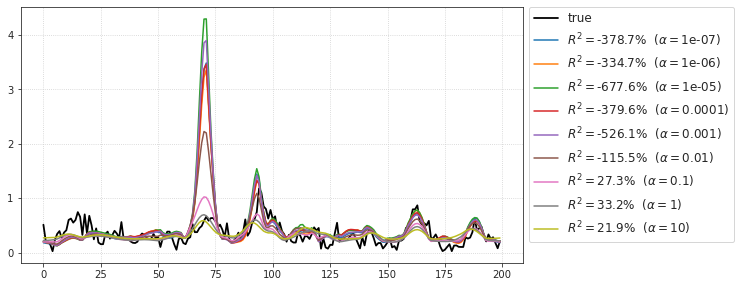

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (1, 3)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.408394  0.277666  0.423544   -7.730854
1.000000e-06  0.406343  0.277249  0.366099  -15.899795
1.000000e-05  0.407539  0.276804  0.422945   -6.930141
1.000000e-04  0.408822  0.278822  0.357011  -15.703258
1.000000e-03  0.406862  0.276224  0.417776   -4.908740
1.000000e-02  0.405804  0.269771  0.470947   -5.503782
1.000000e-01  0.378660  0.233296  0.561924   -9.388184
1.000000e+00  0.325217  0.178485  0.414703 -536.922693
1.000000e+01  0.265610  0.127677  0.333270 -731.604083

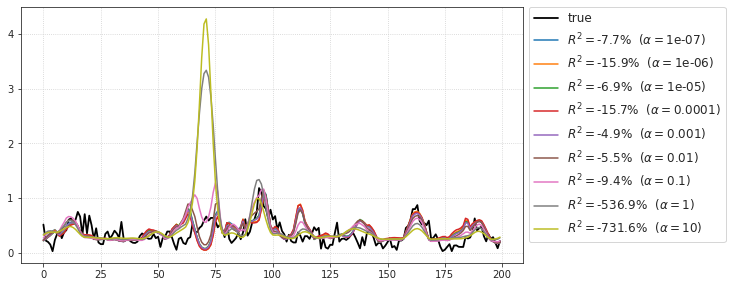

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.410242  0.279385  0.466137 -103.407453
1.000000e-06  0.410454  0.280444  0.460578  -71.466999
1.000000e-05  0.410719  0.278864  0.463531  -76.423595
1.000000e-04  0.409031  0.279077  0.458193 -109.833971
1.000000e-03  0.410331  0.282445  0.457161  -91.997896
1.000000e-02  0.412236  0.279063  0.510574  -16.793735
1.000000e-01  0.393832  0.250347  0.588018   28.791832
1.000000e+00  0.352515  0.187842  0.646399   41.315310
1.000000e+01  0.265419  0.109914  0.624983   38.540748

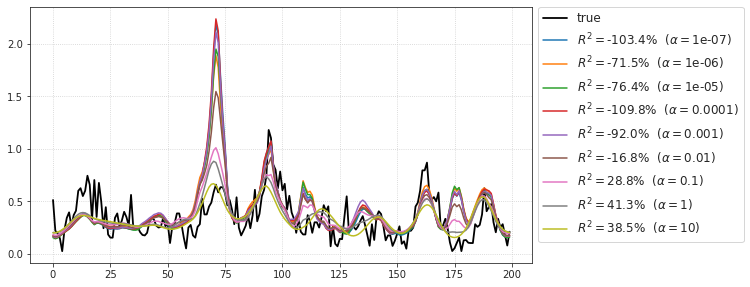

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (3, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.373802  0.261537  0.601946 -23.514607
1.000000e-06  0.375557  0.260502  0.591619 -51.503708
1.000000e-05  0.372049  0.260002  0.585910 -53.784033
1.000000e-04  0.367503  0.258045  0.603073 -22.297890
1.000000e-03  0.372769  0.261978  0.600487 -25.024548
1.000000e-02  0.377583  0.257358  0.616346  -1.121406
1.000000e-01  0.358121  0.221988  0.615383  24.452069
1.000000e+00  0.323920  0.166838  0.504079   9.024986
1.000000e+01  0.256665  0.106569  0.332106 -11.905066

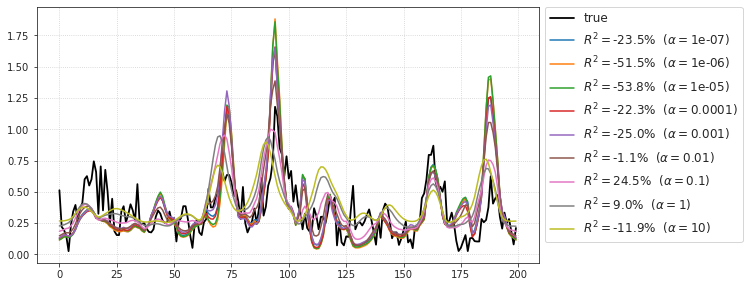

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (1, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.387091  0.256316  0.482329  19.008563
1.000000e-06  0.389681  0.257895  0.471303  17.385505
1.000000e-05  0.384435  0.255562  0.431423  10.469637
1.000000e-04  0.382041  0.254048  0.433884  11.429023
1.000000e-03  0.385662  0.252671  0.513523  24.134251
1.000000e-02  0.379948  0.247946  0.566831  31.132793
1.000000e-01  0.348907  0.200770  0.623344  36.096407
1.000000e+00  0.288312  0.132310  0.517873   3.113132
1.000000e+01  0.209369  0.075627  0.469386  15.062634

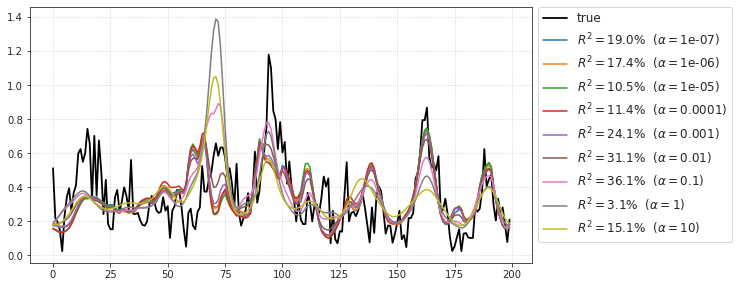

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (3, 1)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.384388  0.250446  0.367962 -289.101184
1.000000e-06  0.380003  0.248074  0.381816 -217.222439
1.000000e-05  0.380515  0.247792  0.347668 -219.453347
1.000000e-04  0.384915  0.253413  0.362855 -314.809772
1.000000e-03  0.384553  0.251521  0.368504 -219.591608
1.000000e-02  0.382035  0.242291  0.298401 -133.781635
1.000000e-01  0.342234  0.188611  0.147948  -73.718253
1.000000e+00  0.261208  0.113547  0.049130  -50.584980
1.000000e+01  0.194750  0.065083  0.015680  -29.659136

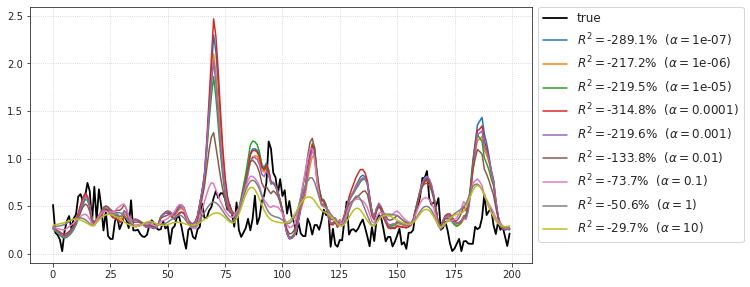

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu108, neuron # 0; pix: (i, j) = (0, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.378720  0.244361  0.644522  16.643718
1.000000e-06  0.379048  0.244516  0.638857   4.688031
1.000000e-05  0.380602  0.245697  0.632365   7.432227
1.000000e-04  0.380231  0.244459  0.656482  28.729859
1.000000e-03  0.378626  0.243195  0.651133  19.997163
1.000000e-02  0.367227  0.225481  0.516968 -52.963623
1.000000e-01  0.331505  0.184867  0.454081 -74.732449
1.000000e+00  0.277077  0.129553  0.404220 -93.448896
1.000000e+01  0.193044  0.058736  0.359889   9.046152

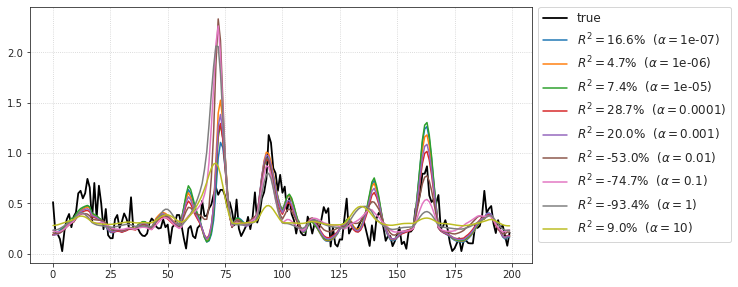

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu108, neuron # 0;  best alpha = 0.0001, best_r = 0.656

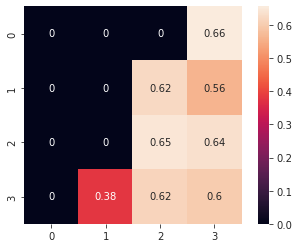

[PROGRESS] 'YUWEI-clu108.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 29/29 [00:11<00:00,  2.52it/s]


[PROGRESS] features extracted

100%|██████████| 23806/23806 [00:30<00:00, 772.14it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

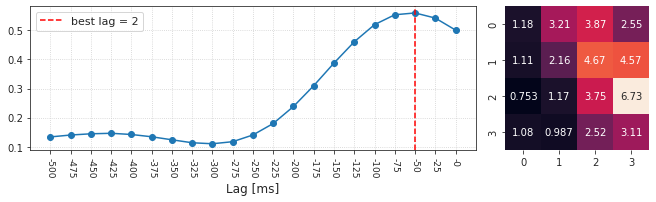

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                           
1.000000e-07  0.180458  0.077676
1.000000e-06  0.180342  0.080748
1.000000e-05  0.181550  0.078947
1.000000e-04  0.179018  0.076666
1.000000e-03  0.181236  0.082338
1.000000e-02  0.171110  0.077079
1.000000e-01  0.148867  0.060095
1.000000e+00  0.131294  0.046296
1.000000e+01  0.119814  0.036178

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.198622  0.081457
1.000000e-06  0.197320  0.085575
1.000000e-05  0.194926  0.081746
1.000000e-04  0.196500  0.079116
1.000000e-03  0.196961  0.082955
1.000000e-02  0.199857  0.087924
1.000000e-01  0.179173  0.074329
1.000000e+00  0.150923  0.051030
1.000000e+01  0.117696  0.030235

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                           
1.000000e-07  0.182655  0.093448
1.000000e-06  0.179277  0.091749
1.000000e-05  0.178291  0.089432
1.000000e-04  0.182859  0.092966
1.000000e-03  0.183035  0.093971
1.000000e-02  0.178815  0.087910
1.000000e-01  0.159814  0.067394
1.000000e+00  0.131303  0.045341
1.000000e+01  0.107520  0.029213

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                           
1.000000e-07  0.173384  0.070512
1.000000e-06  0.172800  0.070695
1.000000e-05  0.174147  0.071797
1.000000e-04  0.171022  0.067273
1.000000e-03  0.173390  0.071326
1.000000e-02  0.176321  0.076411
1.000000e-01  0.158599  0.062823
1.000000e+00  0.140045  0.046460
1.000000e+01  0.115570  0.028392

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.169183  0.065373
1.000000e-06  0.167675  0.064211
1.000000e-05  0.170585  0.066082
1.000000e-04  0.168732  0.064106
1.000000e-03  0.172899  0.071213
1.000000e-02  0.173746  0.077290
1.000000e-01  0.154968  0.062742
1.000000e+00  0.133938  0.044321
1.000000e+01  0.111988  0.026713

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                           
1.000000e-07  0.148828  0.054885
1.000000e-06  0.152055  0.054811
1.000000e-05  0.144128  0.051335
1.000000e-04  0.144628  0.048897
1.000000e-03  0.149283  0.056396
1.000000e-02  0.142119  0.055874
1.000000e-01  0.131572  0.047000
1.000000e+00  0.117253  0.034139
1.000000e+01  0.100478  0.022062

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                           
1.000000e-07  0.168918  0.053191
1.000000e-06  0.172433  0.056676
1.000000e-05  0.174072  0.060309
1.000000e-04  0.169913  0.056553
1.000000e-03  0.174352  0.063441
1.000000e-02  0.167970  0.063526
1.000000e-01  0.146295  0.048415
1.000000e+00  0.124753  0.033057
1.000000e+01  0.097960  0.018296

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu109, neuron # 0; pix: (i, j) = (0, 3)

r      nnll
alpha                           
1.000000e-07  0.175272  0.066415
1.000000e-06  0.175216  0.063914
1.000000e-05  0.173926  0.066273
1.000000e-04  0.176313  0.065561
1.000000e-03  0.176353  0.068834
1.000000e-02  0.169020  0.065443
1.000000e-01  0.150307  0.051577
1.000000e+00  0.123095  0.034479
1.000000e+01  0.072745  0.012505

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu109, neuron # 0;  best alpha = 0.01, best_r = 0.200

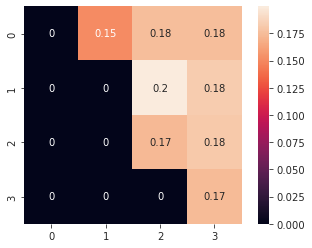

[PROGRESS] 'YUWEI-clu109.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 22/22 [00:08<00:00,  2.51it/s]


[PROGRESS] features extracted

100%|██████████| 18615/18615 [00:22<00:00, 820.64it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

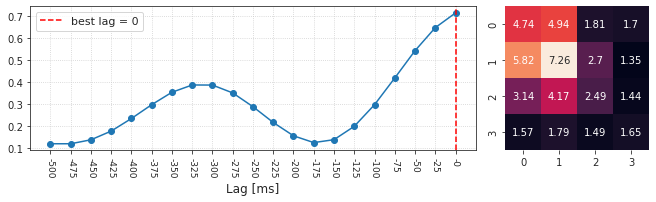

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                           
1.000000e-07  0.131557  0.023284
1.000000e-06  0.133670  0.023308
1.000000e-05  0.136035  0.025458
1.000000e-04  0.131111  0.019988
1.000000e-03  0.137700  0.036358
1.000000e-02  0.119609  0.035786
1.000000e-01  0.101507  0.027573
1.000000e+00  0.093277  0.020750
1.000000e+01  0.085940  0.018146

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                           
1.000000e-07  0.153368  0.039105
1.000000e-06  0.154852  0.038126
1.000000e-05  0.158663  0.040855
1.000000e-04  0.153662  0.039548
1.000000e-03  0.152415  0.038033
1.000000e-02  0.147732  0.044066
1.000000e-01  0.124386  0.035215
1.000000e+00  0.106669  0.028106
1.000000e+01  0.090113  0.020386

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                           
1.000000e-07  0.148338  0.032692
1.000000e-06  0.146981  0.035182
1.000000e-05  0.144631  0.030759
1.000000e-04  0.140714  0.037196
1.000000e-03  0.140080  0.037532
1.000000e-02  0.125108  0.036342
1.000000e-01  0.096530  0.024541
1.000000e+00  0.083717  0.019542
1.000000e+01  0.073040  0.015202

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                           
1.000000e-07  0.139669  0.030177
1.000000e-06  0.142713  0.031985
1.000000e-05  0.141993  0.027703
1.000000e-04  0.150323  0.032702
1.000000e-03  0.141519  0.031255
1.000000e-02  0.137806  0.040909
1.000000e-01  0.110666  0.028098
1.000000e+00  0.091463  0.021696
1.000000e+01  0.077269  0.015758

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                           
1.000000e-07  0.172052  0.047162
1.000000e-06  0.170584  0.043042
1.000000e-05  0.172422  0.044531
1.000000e-04  0.170762  0.045976
1.000000e-03  0.168383  0.050077
1.000000e-02  0.164850  0.058427
1.000000e-01  0.136065  0.042548
1.000000e+00  0.100087  0.024362
1.000000e+01  0.073420  0.013476

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                           
1.000000e-07  0.134271  0.024800
1.000000e-06  0.131192  0.021292
1.000000e-05  0.130640  0.017189
1.000000e-04  0.130954  0.022855
1.000000e-03  0.133783  0.027590
1.000000e-02  0.115478  0.030480
1.000000e-01  0.095061  0.021719
1.000000e+00  0.080347  0.016397
1.000000e+01  0.068454  0.012167

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                           
1.000000e-07  0.135960  0.025722
1.000000e-06  0.138064  0.021614
1.000000e-05  0.139989  0.023904
1.000000e-04  0.137789  0.024877
1.000000e-03  0.139131  0.033354
1.000000e-02  0.133972  0.042652
1.000000e-01  0.119936  0.039144
1.000000e+00  0.105425  0.030421
1.000000e+01  0.077479  0.016032

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu110, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                           
1.000000e-07  0.164203  0.046815
1.000000e-06  0.165306  0.048853
1.000000e-05  0.167604  0.047216
1.000000e-04  0.164144  0.036654
1.000000e-03  0.164931  0.049999
1.000000e-02  0.151849  0.055080
1.000000e-01  0.113876  0.036291
1.000000e+00  0.069099  0.013414
1.000000e+01  0.046637  0.005438

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu110, neuron # 0;  best alpha = 1e-05, best_r = 0.172

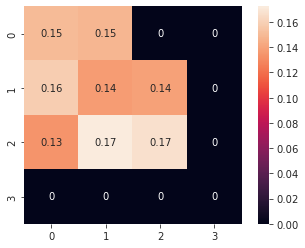

[PROGRESS] 'YUWEI-clu110.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  3.83it/s]


[PROGRESS] features extracted

100%|██████████| 55536/55536 [01:07<00:00, 827.34it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

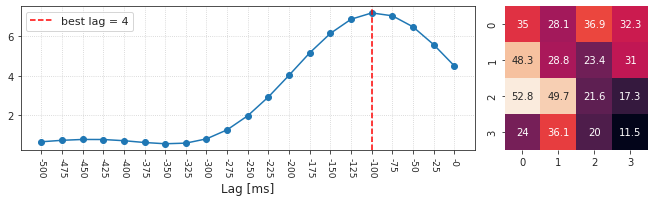

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (2, 0)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.133723  0.458464 -0.045698 -458.689807
1.000000e-06  0.144234  0.488399 -0.049532 -287.856471
1.000000e-05  0.136176  0.488628 -0.037064 -314.204787
1.000000e-04  0.131952  0.489110 -0.039672 -257.183385
1.000000e-03  0.148086  0.504918  0.064660  -61.122554
1.000000e-02  0.139102  0.404322  0.368293   11.822220
1.000000e-01  0.130828  0.299556  0.341615    1.586141
1.000000e+00  0.128443  0.249672  0.298501   -6.425872
1.000000e+01  0.109236  0.156949  0.322640    9.621657

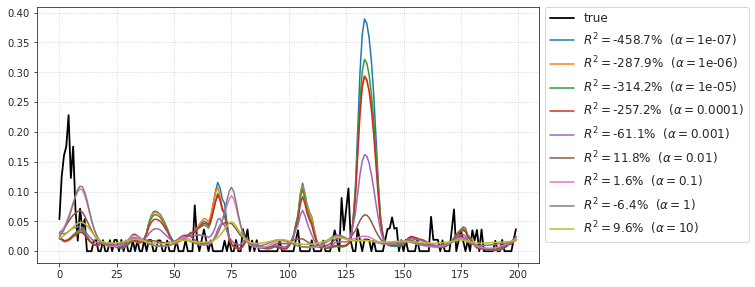

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (2, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.171640  0.555201  0.457165  19.885233
1.000000e-06  0.164828  0.552303  0.521608  26.404327
1.000000e-05  0.173113  0.561321  0.502349  24.798831
1.000000e-04  0.166891  0.565984  0.510722  24.991600
1.000000e-03  0.156065  0.528469  0.569906  30.611019
1.000000e-02  0.139973  0.403955  0.489647  14.903161
1.000000e-01  0.117619  0.292575  0.451759  17.939062
1.000000e+00  0.094964  0.218095  0.500334  22.669929
1.000000e+01  0.082616  0.133829  0.493334  12.789298

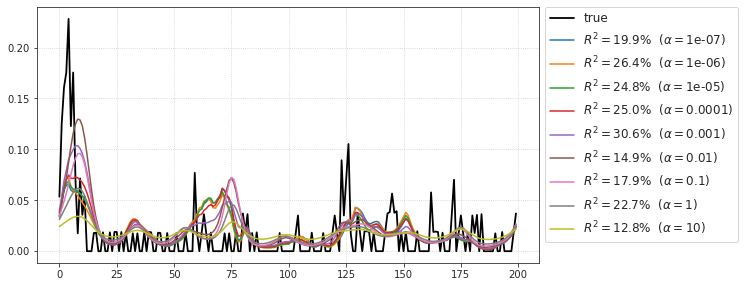

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (1, 0)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.107570  0.437273  0.153008  -7.542366
1.000000e-06  0.107367  0.433658  0.192191  -1.117922
1.000000e-05  0.107619  0.445332  0.097461  -8.763229
1.000000e-04  0.119463  0.481426  0.105935  -8.611972
1.000000e-03  0.121718  0.476041  0.079972 -13.026782
1.000000e-02  0.114560  0.397755  0.242872   3.805252
1.000000e-01  0.113544  0.287217  0.388517   9.530600
1.000000e+00  0.112533  0.221413  0.403743   3.099767
1.000000e+01  0.101422  0.141696  0.431158  16.302540

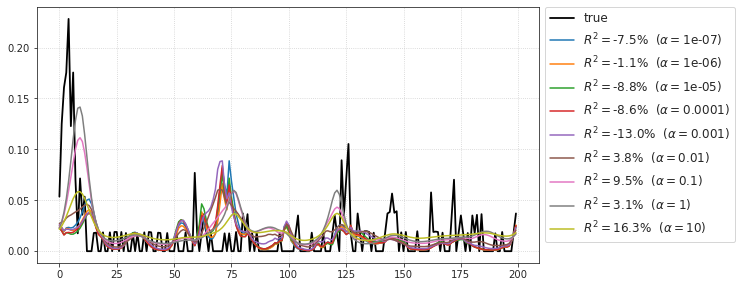

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (0, 2)

r      nnll     r_tst       r2_tst
alpha                                                  
1.000000e-07  0.141788  0.465700  0.099399  -829.535043
1.000000e-06  0.137208  0.445455  0.234023  -678.341539
1.000000e-05  0.146951  0.473563  0.205288 -1027.136764
1.000000e-04  0.146933  0.478989  0.248131  -434.034986
1.000000e-03  0.141691  0.469014  0.264722   -91.088526
1.000000e-02  0.124155  0.359955  0.223394   -19.111486
1.000000e-01  0.099470  0.255871  0.138396   -23.514357
1.000000e+00  0.084446  0.195106  0.107116   -11.836723
1.000000e+01  0.086937  0.098114  0.080979     0.302472

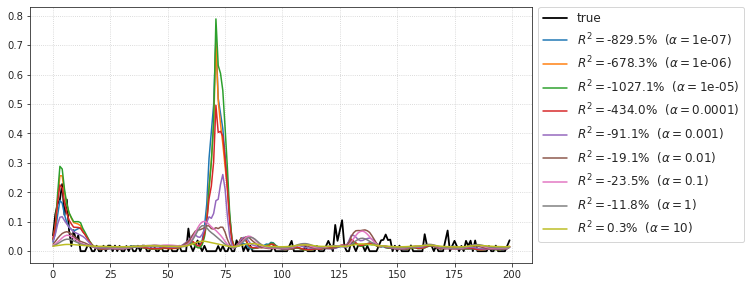

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (3, 1)

r      nnll     r_tst      r2_tst
alpha                                                 
1.000000e-07  0.136248  0.390502  0.351898 -189.088097
1.000000e-06  0.149830  0.421859  0.346354  -86.238872
1.000000e-05  0.139054  0.401134  0.353152 -147.147430
1.000000e-04  0.141600  0.434454  0.343244 -145.774242
1.000000e-03  0.131308  0.424768  0.290203 -159.504689
1.000000e-02  0.127493  0.349465  0.293479  -37.317999
1.000000e-01  0.111764  0.278206  0.252127   -4.226754
1.000000e+00  0.084538  0.182315  0.167391   -0.483591
1.000000e+01  0.071119  0.084591  0.149915    1.988321

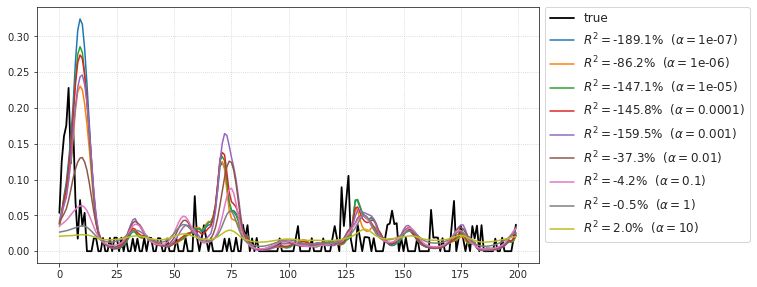

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (0, 0)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.122133  0.448586  0.064612 -18.453686
1.000000e-06  0.124709  0.455594  0.027113 -14.895342
1.000000e-05  0.127840  0.459657  0.021313 -12.616980
1.000000e-04  0.121402  0.462185  0.038853 -15.001003
1.000000e-03  0.116304  0.460676  0.078774 -17.639684
1.000000e-02  0.103475  0.375311  0.304476   8.602137
1.000000e-01  0.093425  0.243124  0.442019  19.165065
1.000000e+00  0.072127  0.140110  0.447420  17.461302
1.000000e+01  0.067156  0.066205  0.452745   7.042489

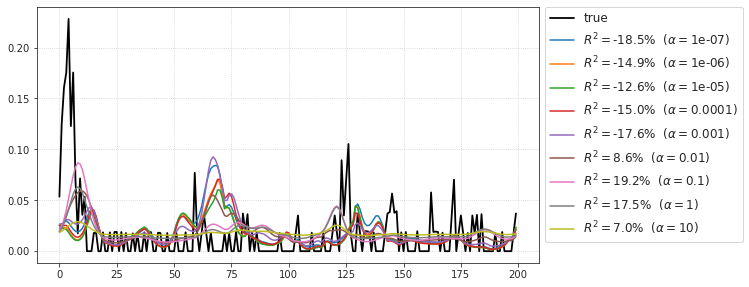

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (0, 3)

r      nnll     r_tst        r2_tst
alpha                                                   
1.000000e-07  0.133695  0.332796 -0.041404 -1.343346e+06
1.000000e-06  0.132819  0.339995 -0.042871 -1.395120e+06
1.000000e-05  0.137551  0.343918 -0.042811 -1.454381e+06
1.000000e-04  0.140699  0.376276 -0.043613 -2.475640e+05
1.000000e-03  0.127451  0.340052  0.014905 -6.265719e+02
1.000000e-02  0.107135  0.260937  0.171431 -1.752225e+01
1.000000e-01  0.089452  0.225207  0.169385 -1.683006e+00
1.000000e+00  0.080084  0.159121  0.142448  2.027040e+00
1.000000e+01  0.075469  0.063177  0.122698  6.902711e-01

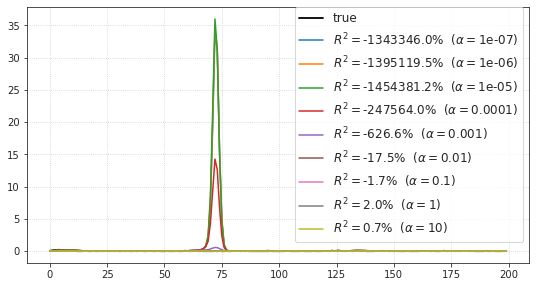

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu116, neuron # 0; pix: (i, j) = (1, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.098519  0.307182  0.345029 -34.463087
1.000000e-06  0.096735  0.279303  0.301924 -44.149308
1.000000e-05  0.101088  0.305431  0.333067 -49.707616
1.000000e-04  0.110925  0.350361  0.276059 -35.059024
1.000000e-03  0.122007  0.361862  0.319358  -1.217467
1.000000e-02  0.117842  0.310068  0.476482  22.133498
1.000000e-01  0.107007  0.245137  0.554198  24.761361
1.000000e+00  0.083960  0.163524  0.480942  15.186144
1.000000e+01  0.074740  0.074382  0.399039   5.220866

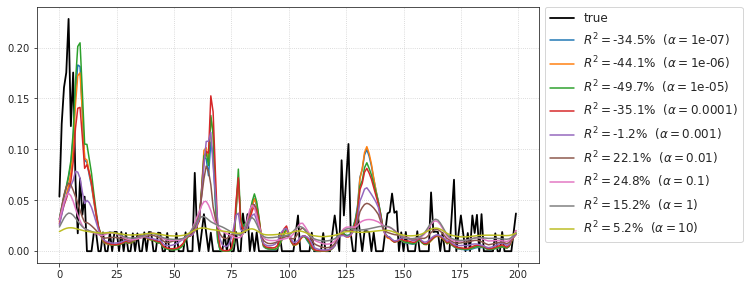

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu116, neuron # 0;  best alpha = 0.001, best_r = 0.570

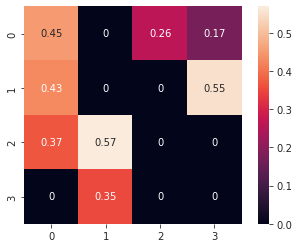

[PROGRESS] 'YUWEI-clu116.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,21:15)

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


[PROGRESS] features extracted

100%|██████████| 35472/35472 [00:41<00:00, 851.37it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

  0%|          | 0/1 [00:00<?, ?it/s]

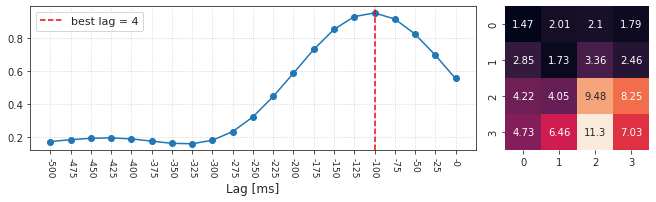

--------------------------------------------------------------------------------
clu120, neuron # 0; pix: (i, j) = (3, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.210591  0.108162  0.738676  49.677339
1.000000e-06  0.210868  0.107035  0.747207  50.951082
1.000000e-05  0.216738  0.106878  0.744185  51.793852
1.000000e-04  0.210422  0.107238  0.780612  56.651175
1.000000e-03  0.217256  0.117490  0.772842  56.696308
1.000000e-02  0.218363  0.118776  0.737848  52.762136
1.000000e-01  0.201218  0.105231  0.750892  55.164511
1.000000e+00  0.176734  0.087504  0.733634  52.042553
1.000000e+01  0.144140  0.062846  0.702700  33.641355

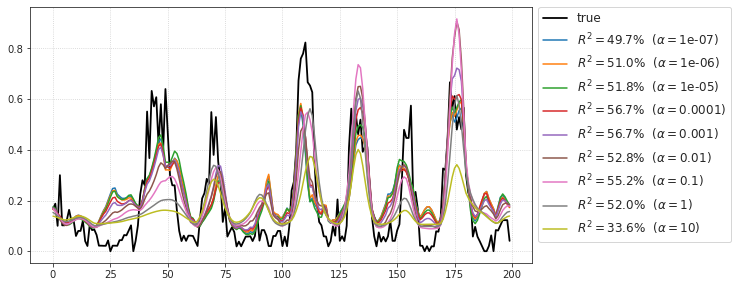

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu120, neuron # 0; pix: (i, j) = (2, 2)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.217475  0.114958  0.771408  55.792448
1.000000e-06  0.216603  0.118142  0.781633  57.913703
1.000000e-05  0.218363  0.117181  0.740397  51.898567
1.000000e-04  0.215513  0.113552  0.791111  59.727478
1.000000e-03  0.217088  0.118920  0.786904  59.251810
1.000000e-02  0.219423  0.124182  0.797701  61.573061
1.000000e-01  0.197636  0.105604  0.780039  59.229125
1.000000e+00  0.163489  0.076547  0.789143  41.078242
1.000000e+01  0.131434  0.049167  0.797105  20.766223

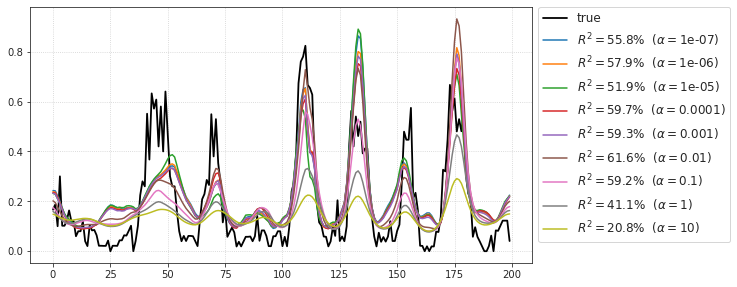

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu120, neuron # 0; pix: (i, j) = (2, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.207732  0.100783  0.729712  47.349592
1.000000e-06  0.206289  0.100592  0.723795  48.083935
1.000000e-05  0.204698  0.100768  0.728655  46.744468
1.000000e-04  0.203739  0.099440  0.749498  54.460270
1.000000e-03  0.209053  0.110662  0.757867  54.964570
1.000000e-02  0.210110  0.112750  0.776412  60.144565
1.000000e-01  0.200322  0.100279  0.771078  58.994210
1.000000e+00  0.172457  0.074126  0.758959  49.110123
1.000000e+01  0.142515  0.048995  0.749566  25.726078

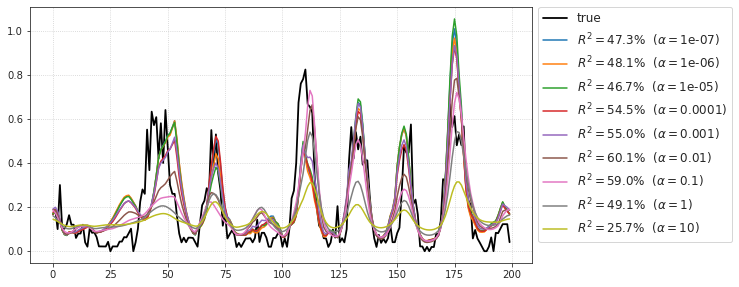

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu120, neuron # 0; pix: (i, j) = (3, 3)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.210903  0.099790  0.747210  55.387724
1.000000e-06  0.210730  0.100148  0.740979  54.010366
1.000000e-05  0.213192  0.103452  0.731120  52.764552
1.000000e-04  0.215128  0.110537  0.719015  51.370560
1.000000e-03  0.216081  0.112018  0.751476  56.106290
1.000000e-02  0.211522  0.111321  0.778173  59.629735
1.000000e-01  0.197774  0.099643  0.788073  59.451935
1.000000e+00  0.182122  0.081787  0.783108  46.418972
1.000000e+01  0.148317  0.043804  0.760665  10.424651

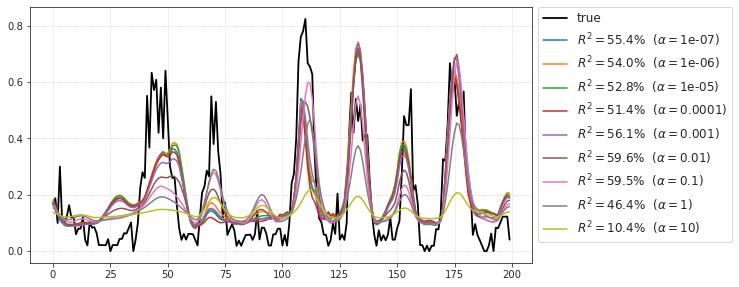

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu120, neuron # 0; pix: (i, j) = (3, 1)

r      nnll     r_tst     r2_tst
alpha                                                
1.000000e-07  0.205637  0.112135  0.721818  45.114179
1.000000e-06  0.204107  0.110932  0.713282  45.740254
1.000000e-05  0.208363  0.112585  0.668838  40.221445
1.000000e-04  0.208588  0.114733  0.682548  41.024016
1.000000e-03  0.210613  0.119197  0.700902  44.451361
1.000000e-02  0.205982  0.117128  0.689906  41.989390
1.000000e-01  0.183791  0.097238  0.665645  31.854702
1.000000e+00  0.138037  0.064293  0.582128  21.378402
1.000000e+01  0.105849  0.038092  0.515969  10.288878

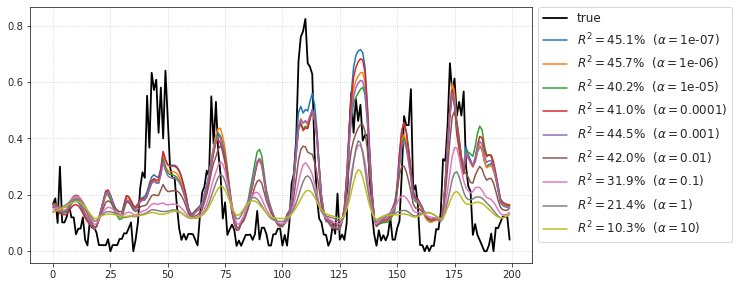

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

KeyboardInterrupt: 

In [5]:
%%time
kws = dict(
    root='YUWEI',
    tr=tr,
    n_pcs=500,
    n_lags=20,
    n_top_pix=8,
    rescale=2.0,
    verbose=True,
)
perf_all, alpha_all = {}, {}
for expt, useful in vae.cfg.useful_yuwei.items():
    ro = ReadoutGLM(expt=expt, **kws).fit_readout()
    if ro.has_repeats:
        bound = np.sqrt(max_r2(ro.spks_r))
    else:
        bound = None
    for idx in tqdm(useful, leave=False):
        ro.show(idx)
        perf_r, _ = ro.fit_neuron(idx, full=False)
        key = f"{expt}_{idx}"
        alpha_all[key] = ro.glm[idx].alpha
        if ro.has_repeats:
            perf_all[key] = ro.perf[idx] / bound[idx]
        else:
            perf_all[key] = ro.perf[idx]
        # plot
        sns.heatmap(perf_r, square=True, annot=True)
        plt.show()
    ro.save(fit_name)

## clu096

In [4]:
%%time

ro = ReadoutGLM(
    root='YUWEI',
    expt='clu096',
    n_lags=20,
    tr=tr,
    verbose=True,
).fit_readout()

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


[PROGRESS] features extracted

100%|██████████| 24279/24279 [00:32<00:00, 736.41it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

CPU times: user 59.8 s, sys: 11.8 s, total: 1min 11s
Wall time: 1min 11s


In [5]:
%%time

perf_r, _ = ro.fit_neuron(0, alphas=[0.01, 0.1], full=True)

NameError: name 'ro' is not defined

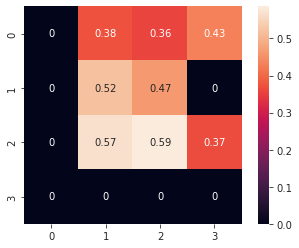

In [6]:
sns.heatmap(perf_r, square=True, annot=True)
plt.show()

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (1, 1)

r      nnll     r_tst     r2_tst
alpha                                         
0.01   0.259415  0.245017  0.457077 -21.468732
0.10   0.219109  0.185047  0.522400 -29.469129

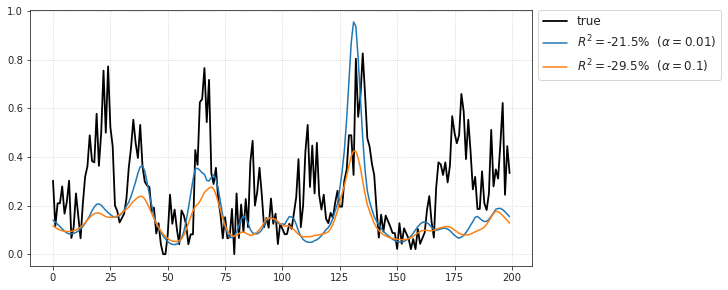

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

CPU times: user 16min 22s, sys: 1min 1s, total: 17min 23s
Wall time: 1min 46s


In [5]:
%%time

self = ro.fit_neuron(0, alphas=[0.01, 0.1], full=True)

In [7]:
self.df

,r,nnll,r_tst,r2_tst
alpha,,,,
0.01,0.259415,0.245017,0.457077,-21.468732
0.10,0.219109,0.185047,0.522400,-29.469129


In [10]:
np.sqrt(max_r2(ro.spks_r)[0])

0.9096882574110489

In [11]:
0.522400 / 0.91

0.574065934065934

[(0.01, 0.2594145697035651), (0.1, 0.21910879038503306)]

(0.01, 0.2594145697035651)

In [51]:
glm.df['r_tst'].max()

KeyError: 'r_tst'

In [21]:
for a, r in self.r_tst.items():
    df_copy.loc[a, 'r_tst'] = r
    df_copy.loc[a, 'r2_tst'] = self.r2_tst[a]

In [22]:
df_copy

,r,r2,nnll,r_tst,r2_tst
alpha,,,,,
0.01,0.259415,-21.052284,0.245017,0.457077,-21.468732
0.10,0.219109,-29.534619,0.185047,0.522400,-29.469129


In [42]:
df_init = pd.DataFrame({
    'alpha': [0.01, 0.1],
    'r': [np.nan] * 2,
    'nnll': [np.nan] * 2,
    'r_tst': [np.nan] * 2,
    'r2_tst': [np.nan] * 2,
})
df_init = df_init.set_index('alpha')
df_init

,r,nnll,r_tst,r2_tst
alpha,,,,
0.01,NaN,NaN,NaN,NaN
0.10,NaN,NaN,NaN,NaN


In [46]:
df_copy = self.df.copy()
df_copy = df_copy.drop(columns='r2')
df_copy

,r,nnll
alpha,,
0.01,0.259415,0.245017
0.10,0.219109,0.185047


In [48]:
df_init['r'] = df_copy['r']


In [49]:
alpha = 0.01
df_copy.loc[alpha, 'nnll']

0.24501745934456903

In [24]:
for a, r in self.r_tst.items():
    df_copy.loc[a, 'r_tst'] = r
    df_copy.loc[a, 'r2_tst'] = self.r2_tst[a]

In [25]:
df_copy

,alpha,r_tst,r2_tst
0.00,0.01,NaN,NaN
1.00,0.10,NaN,NaN
0.01,NaN,0.457077,-21.468732
0.10,NaN,0.522400,-29.469129


## Test on clu090

In [4]:
%%time

ro = ReadoutGLM(
    root='YUWEI',
    expt='clu090',
    n_lags=20,
    tr=tr,
    verbose=True,
).fit_readout()

[PROGRESS] neural data loaded

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


[PROGRESS] features extracted

100%|██████████| 54385/54385 [02:57<00:00, 306.16it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

CPU times: user 3min 45s, sys: 50.6 s, total: 4min 35s
Wall time: 5min 4s


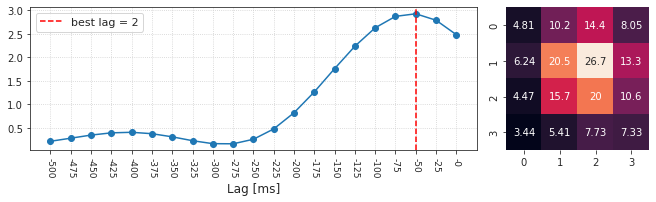

In [5]:
ro.show(0)

In [6]:
collections.Counter([
    tuple(pix)for pix in
    ro.best_pix_all[0]
]).most_common()

[((1, 2), 15), ((3, 3), 3), ((2, 2), 1), ((2, 3), 1), ((2, 1), 1)]

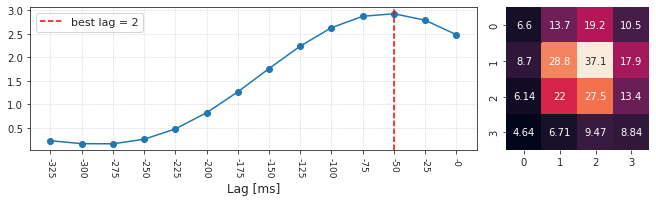

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 2)

None

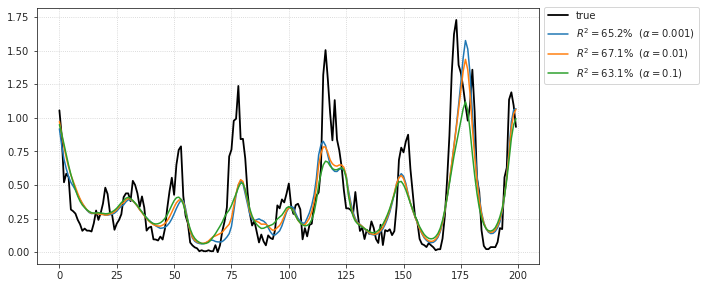

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 1)

None

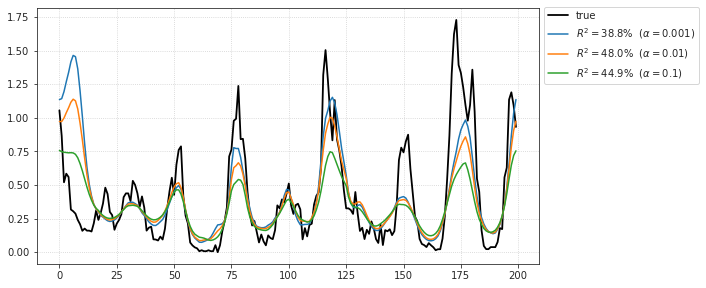

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 2)

None

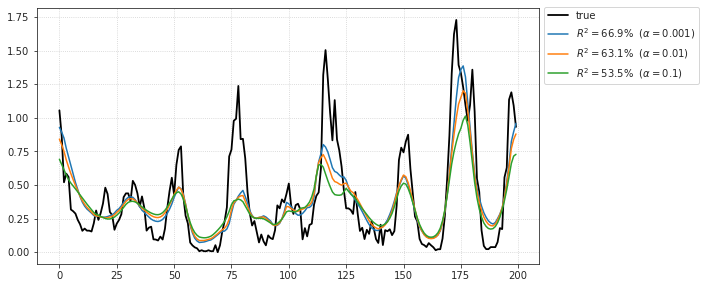

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 1)

None

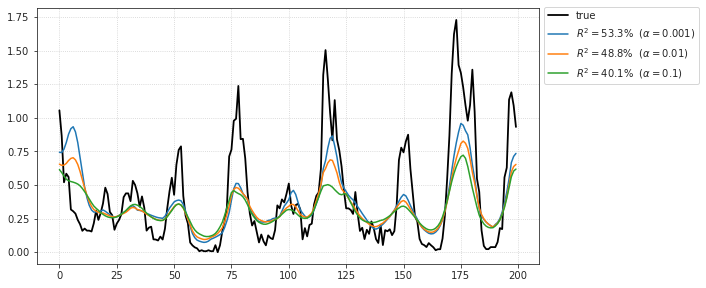

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (0, 2)

None

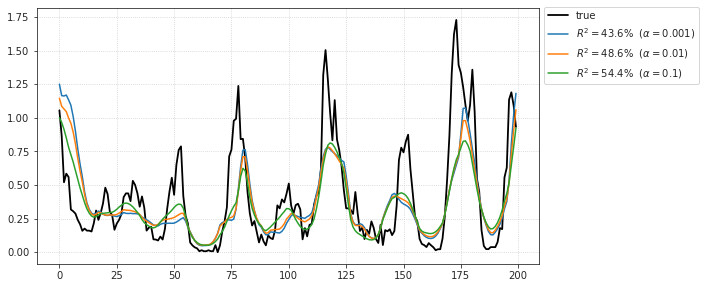

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 3)

None

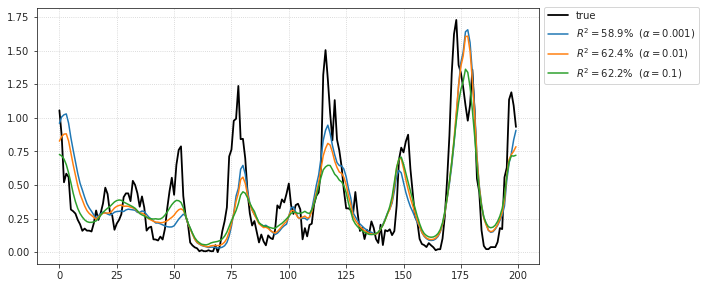

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 3)

None

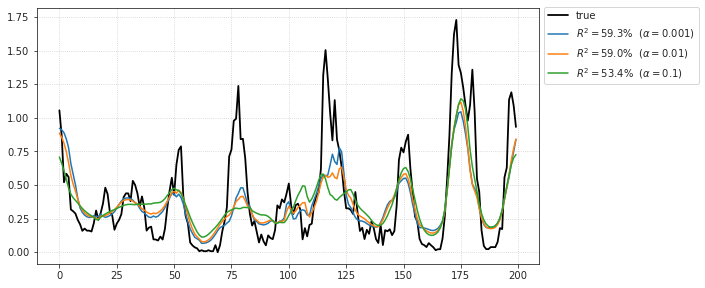

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (0, 1)

None

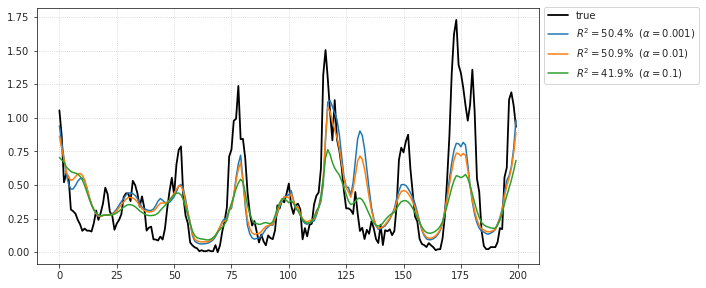

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu090, neuron # 0;  best alpha = 0.1, best_r = 0.849

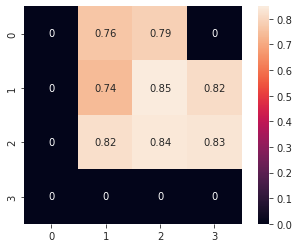

CPU times: user 1h 17min 20s, sys: 7min 7s, total: 1h 24min 27s
Wall time: 15min 54s


In [7]:
%%time

perf_r, _ = ro.fit_neuron(0, alphas=[0.001, 0.01, 0.1], full=False)
sns.heatmap(perf_r, square=True, annot=True)
plt.show()

In [11]:
ro.sorted_pix

array([[[1, 2],
        [1, 1],
        [2, 2],
        [2, 1],
        [0, 2],
        [1, 3],
        [2, 3],
        [0, 1]]])

In [12]:
ro.best_pix_all

array([[[3, 3],
        [2, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [2, 3],
        [3, 3],
        [3, 3],
        [2, 1],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2]]])

[((1, 2), 15), ((3, 3), 3), ((2, 2), 1), ((2, 3), 1), ((2, 1), 1)]

In [14]:
ro.save('TeSt')

[PROGRESS] 'YUWEI-clu090.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/TeSt_nf-1984_(2023_04_16,15:58)

In [3]:
ro_new = ReadoutGLM('YUWEI', 'clu090').load('TeSt_nf-1984_(2023_04_16,15:58)', 'cuda:2').load_neuron()

## Further: test and fix the forward function.
Can you reproduce above fit by applying PCA to ftrs, and then getting x, etc and pred neuron?

In [4]:
data, ftr, ftr_r = ro_new.validate(0)

In [5]:
list(data)

['x', 'y', 'x_tst', 'y_tst']

In [12]:
pred = ro_new.glm[0].predict(data['x_tst'])
sp_stats.pearsonr(data['y_tst'], pred)[0], sk_metric.r2_score(data['y_tst'], pred) * 100

(0.8485709317736884, 63.120314662444656)

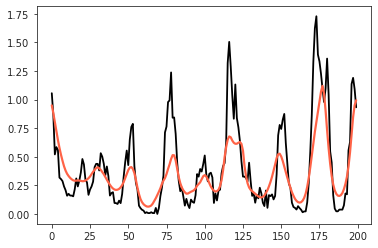

In [24]:
plt.plot(data['y_tst'], lw=1.8, color='k')
plt.plot(pred, lw=2.2, color='tomato');

In [25]:
ftr.shape

(72000, 1984, 4, 4)

In [26]:
ftr, ftr_p, stats = ro_new.forward(full=True)

In [29]:
ftr.shape, ftr_p.shape

((72000, 1984, 4, 4), (72000, 1984))

In [28]:
list(stats)

['var', 'mu2', 'snr2', 's']

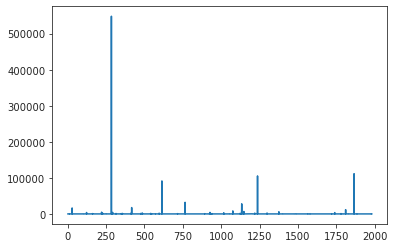

In [33]:
plt.plot(stats['snr2'])

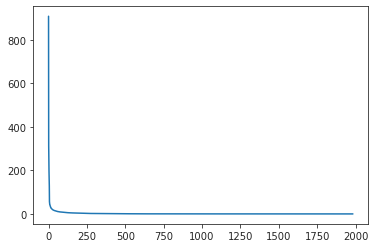

In [35]:
plt.plot(stats['s'])

In [36]:
sum(stats['s']) ** 2 / sum(stats['s'] ** 2)

19.546097806806713

In [39]:
x, x_r, ftr, ftr_r, stats = forward(ro_new, 0, full=True)

In [40]:
x.shape

(72000, 500)

(0.8485709317736884, 63.120314662444656)

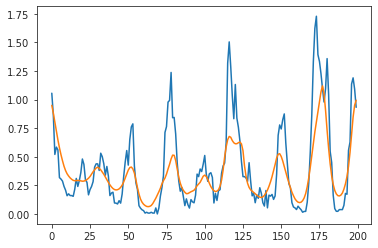

In [69]:
pred = ro_new.glm[0].predict(x_r[ro_new.good_r - 2])
true = np.nanmean(ro_new.spks_r[0], 0)

plt.plot(true)
plt.plot(pred)



## TODO:
test saving and loading

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 2)

None

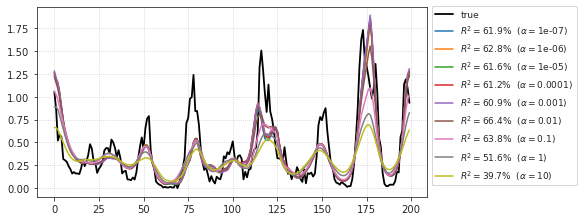

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 1)

None

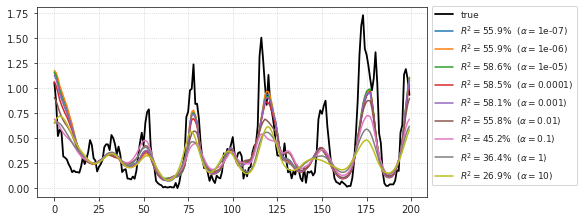

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 2)

None

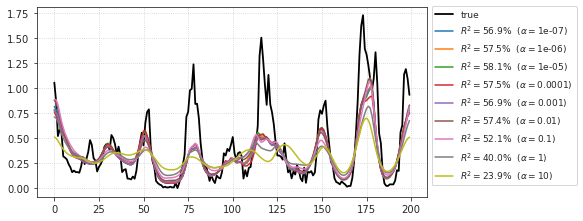

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 1)

None

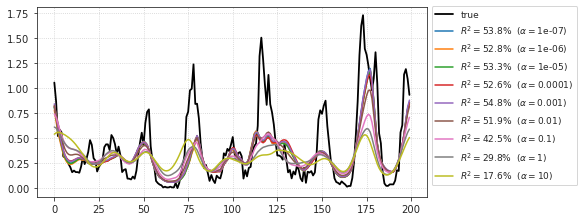

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (0, 2)

None

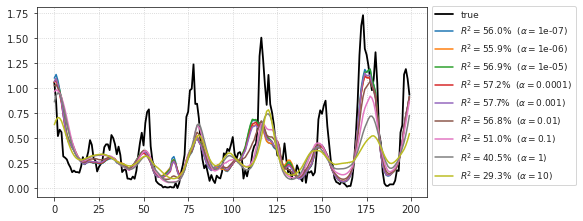

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (1, 3)

None

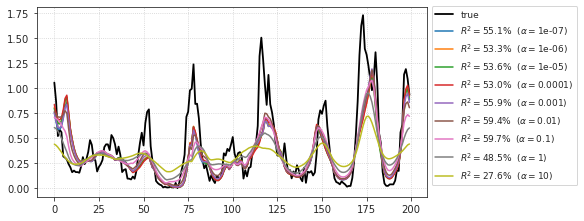

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (2, 3)

None

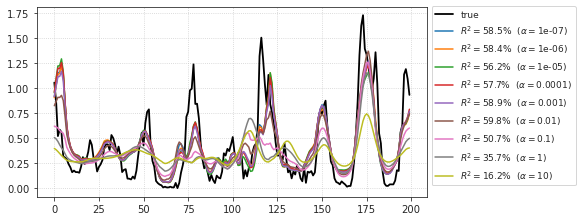

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu090, neuron # 0; pix: (i, j) = (0, 1)

None

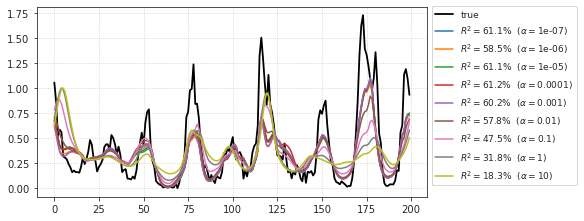

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

clu090, neuron # 0;  best alpha = 0.01, best_r = 0.875

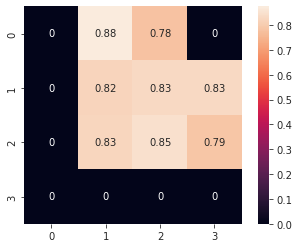

Task: find out which pixel produced the best result, and if it correlates with count-based best pix selection

In [10]:
ro.best_pix

{0: (0, 1)}

In [11]:
ro.best_pix_all

array([[[3, 3],
        [3, 3],
        [3, 3],
        [3, 3],
        [1, 1],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2]]])

In [58]:
[k for k in vars(ro) if k not in _FIT + _ATTRS]

['tr', 'mask', 'spks', 'good', 'spks_r', 'good_r', 'ftr', 'ftr_r']

In [56]:
ro.expt

'clu090'

In [13]:
list(vars(ro))

['root',
 'expt',
 'tr',
 'n_pcs',
 'n_lags',
 'n_top_pix',
 'rescale',
 'kws_hf',
 'kws_xt',
 'normalize',
 'verbose',
 'dtype',
 'x',
 'x_r',
 'pca',
 'perf',
 'alphas',
 'models',
 'best_pix',
 'has_repeats',
 'nc',
 'mask',
 'spks',
 'good',
 'spks_r',
 'good_r',
 'mu',
 'sd',
 'ftr',
 'ftr_r',
 'sta',
 'temporal',
 'best_lags',
 'best_pix_all',
 'spatial',
 'top_pix']

In [14]:
ro.n_pcs

500

In [18]:
sys.getsizeof(ro.ftr) / 1e6

9142.272152

In [24]:
path = pjoin(tr.model.cfg.results_dir, 'GLM')
path

'/home/hadi/Documents/MTMST/results/GLM'

In [25]:
comment = 'reservoir'
nf = sum(ro.tr.model.ftr_sizes()[0].values())
comment = '_'.join([
    comment,
    f"nf-{nf}",
    f"({now(True)})",
])
print(comment)

reservoir_nf-1984_(2023_04_16,13:45)

In [26]:
path = pjoin(path, comment)
path_tr = pjoin(path, 'Trainer')
os.makedirs(path_tr, exist_ok=True)

In [29]:
tr.save(0, path_tr)
tr.cfg.save(path_tr)
tr.model.cfg.save(path_tr)

In [36]:
fname = f"{ro.root}-{ro.expt}"
fname

'YUWEI-clu090'

In [ ]:
_ATTRS = [
	'root', 'expt', 'n_pcs', 'n_lags', 'n_top_pix', 'rescale', 'nc',
	'kws_hf', 'kws_xt', 'normalize', 'dtype', 'verbose', 'has_repeats',
]
_FIT = [
	'sta', 'temporal', 'spatial', 'best_lags', 'best_pix', 'best_pix_all',
	'mu', 'sd', 'pca', 'x', 'x_r', 'top_pix', 'perf', 'alphas', 'models',
]

In [60]:
state_dict = {k: getattr(ro, k) for k in _ATTRS + _FIT}

In [61]:
save_obj(
    obj=state_dict,
    file_name=fname,
    save_dir=path,
    verbose=True,
    mode='pkl',
)

[PROGRESS] 'YUWEI-clu090.pkl' saved at
/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,13:45)

'/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,13:45)/YUWEI-clu090.pkl'

In [62]:
file = pjoin(path, f"{fname}.pkl")

In [63]:
with (open(file, 'rb')) as f:
    loaded = pickle.load(f)

In [64]:
len(loaded)

28

In [65]:
loaded

{'root': 'YUWEI',
 'expt': 'clu090',
 'n_pcs': 500,
 'n_lags': 13,
 'n_top_pix': 8,
 'rescale': 2.0,
 'nc': 1,
 'kws_hf': {'dim': 17, 'sres': 1, 'radius': 7},
 'kws_xt': {'scale': 4, 'pool': 'max', 'act_fn': 'swish'},
 'normalize': True,
 'dtype': 'float32',
 'verbose': True,
 'has_repeats': True,
 'sta': array([[[[[-1.87007826e-02,  9.82621597e-02,  8.73716428e-02,
             7.91531771e-02],
           [-6.77596844e-04,  5.39745667e-02,  1.79558858e-02,
             4.14726588e-02],
           [ 5.38659688e-03,  3.45138911e-02, -3.78154817e-03,
             4.51176381e-02],
           [ 1.71052393e-03,  1.02275314e-01,  1.12596288e-01,
             1.01228497e-01]],
 
          [[ 3.61604222e-02,  2.45202155e-02,  2.22801683e-02,
             7.47889602e-02],
           [ 4.07468832e-02, -1.79948072e-02, -4.96217466e-02,
             1.54021533e-02],
           [ 3.89513296e-02, -4.46865924e-02, -3.40240480e-02,
             1.09575984e-02],
           [ 1.27034291e-02, -1.83887803

In [47]:
loaded

[{'temporal': array([[[0.00567929, 0.01155867, 0.01706392, 0.01001117],
          [0.00736533, 0.02486769, 0.02997805, 0.01526475],
          [0.00539907, 0.0188031 , 0.02264891, 0.01203125],
          [0.00405002, 0.00660541, 0.00919665, 0.00866195]]]),
  'models': {0: PoissonRegressor(alpha=0.01)}}]

In [11]:
from base.utils_model import load_model_lite

In [12]:
trainer, metadata = load_model_lite(path_tr)

In [13]:
metadata

{'checkpoint': 0,
 'global_step': 0,
 'file': 'VAE+TrainerVAE-0000-(2023_04_16,12:15).pt',
 'path': '/home/hadi/Documents/MTMST/results/GLM/reservoir_nf-1984_(2023_04_16,12:14)/Trainer'}

In [ ]:
		self.pca = {}
		self.glm = {}
		self.perf = {}
		self.perf_df = {}
		self.best_pix = {}

In [14]:
vars(trainer.cfg)

{'lr': 0.003,
 'epochs': 2000,
 'batch_size': 1000,
 'warm_restart': 0,
 'warmup_portion': 0.025,
 'optimizer': 'adamax_fast',
 'optimizer_kws': {'betas': [0.9, 0.999],
  'weight_decay': 0.0003,
  'eps': 1e-08},
 'scheduler_type': 'cosine',
 'scheduler_kws': {'T_max': 1950.0, 'eta_min': 1e-05},
 'ema_rate': 0.999,
 'grad_clip': 1000,
 'chkpt_freq': 20,
 'eval_freq': 5,
 'log_freq': 10,
 'use_amp': False,
 'kl_beta': 1.0,
 'kl_beta_min': 0.0001,
 'kl_balancer': 'equal',
 'kl_anneal_cycles': 1,
 'kl_anneal_portion': 0.3,
 'kl_const_portion': 0.0001,
 'lambda_anneal': True,
 'lambda_init': 1e-07,
 'lambda_norm': 0.0001,
 'spectral_reg': False}

In [15]:
vars(trainer.model.cfg)

{'sim': 'fixate1',
 'n_ch': 32,
 'ker_sz': 2,
 'input_sz': 17,
 'n_enc_cells': 1,
 'n_enc_nodes': 3,
 'n_dec_cells': 1,
 'n_dec_nodes': 2,
 'n_pre_cells': 3,
 'n_pre_blocks': 1,
 'n_post_cells': 3,
 'n_post_blocks': 1,
 'n_latent_scales': 3,
 'n_latent_per_group': 20,
 'n_groups_per_scale': 8,
 'spectral_norm': 0,
 'separable': False,
 'compress': True,
 'use_bn': False,
 'groups': [8, 4, 2],
 'base_dir': '/home/hadi/Documents/MTMST',
 'results_dir': '/home/hadi/Documents/MTMST/results',
 'runs_dir': '/home/hadi/Documents/MTMST/runs/fixate1_k-32_z-20x[2,4,8]_enc(1x3)-dec(1x2)-pre(1x3)-post(1x3)',
 'save_dir': '/home/hadi/Documents/MTMST/models/fixate1_k-32_z-20x[2,4,8]_enc(1x3)-dec(1x2)-pre(1x3)-post(1x3)',
 'data_dir': '/home/hadi/Documents/MTMST/data',
 'h_file': '/home/hadi/Documents/MTMST/data/ALL_tres25.h5',
 'sim_path': '/home/hadi/Documents/MTMST/data/fixate1_dim-17_n-750k',
 'useful_cells': {'clu036': [0],
  'clu037': [0],
  'clu038': [0],
  'clu039': [0],
  'clu040': [0],
  'c

In [17]:
coef = ro.models[0].coef_

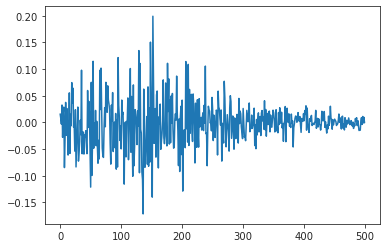

In [18]:
plt.plot(coef)

In [20]:
ro.x[0].shape

(54386, 500)

In [22]:
ro.x[0].mean(), ro.x[0].std()

(7.2509266e-08, 1.2586805)

In [25]:
ro.pca[0].components_.shape

(500, 1984)

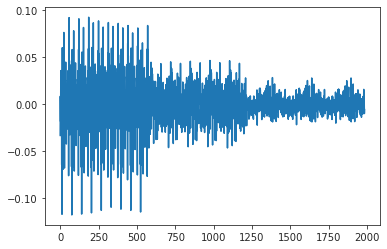

In [33]:
plt.plot(ro.pca[0].components_[14])

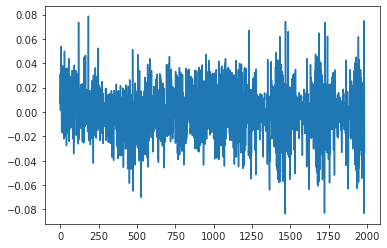

In [36]:
plt.plot(coef @ ro.pca[0].components_)

In [41]:
perm = sk_inspect.permutation_importance(
    ro.models[0],
    ro.x_r[0],
    np.nanmean(ro.spks_r[0], 0),
    n_repeats=10,
    random_state=0,
)

In [43]:
list(perm)

['importances_mean', 'importances_std', 'importances']

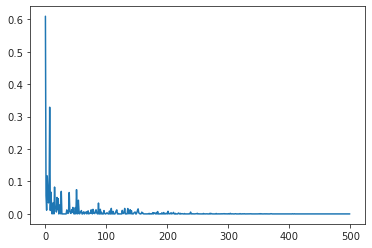

In [47]:
plt.plot(np.maximum(perm['importances_mean'], 0))

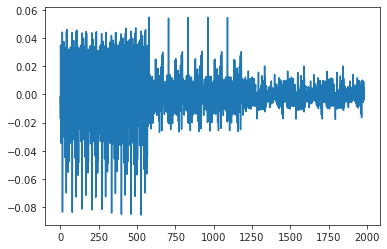

In [49]:
plt.plot(np.maximum(perm['importances_mean'], 0) @ ro.pca[0].components_)

In [54]:
(perm['importances_mean'] > 0.1).sum()

3